last version with right number of exposure for the whole LSST survey (https://arxiv.org/pdf/0805.2366.pdf)

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import sys
import os
import galsim
import scipy.stats as stats
import seaborn as sns
from importlib import reload
import pandas as pd
import matplotlib
import scipy
import tensorflow as tf

%matplotlib inline
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('retina')

In [2]:
sys.path.insert(0,'../../scripts/tools_for_VAE/')
from tools_for_VAE import vae_functions, model, utils, plot, generator, results_processing, boxplot

from tools_for_VAE.results_processing import processing
from tools_for_VAE.boxplot import boxplot_func

W0621 00:42:06.510124 140095485790016 deprecation.py:323] From /sps/lsst/users/barcelin/miniconda/envs/python_cpu6/lib/python3.6/site-packages/tensorflow_core/python/compat/v2_compat.py:88: disable_resource_variables (from tensorflow.python.ops.variable_scope) is deprecated and will be removed in a future version.
Instructions for updating:
non-resource variables are not supported in the long term


# Function to import deblender

In [5]:
nb_of_bands = 6
batch_size = 256

input_shape = (59, 59, nb_of_bands)
hidden_dim = 256
latent_dim = 32
final_dim = 2
filters = [32,64,128,256]
kernels = [3,3,3,3]

In [6]:
net_psf = model.create_model_wo_ls_peak_pooling_vae_3(input_shape, latent_dim, hidden_dim, filters, kernels, final_dim, conv_activation=None, dense_activation=None)
net_no_psf = model.create_model_wo_ls_peak_pooling_vae_4(input_shape, latent_dim, hidden_dim, filters, kernels, final_dim, conv_activation=None, dense_activation=None)

W0603 15:33:10.167080 140456960567104 deprecation.py:506] From /sps/lsst/users/barcelin/miniconda/envs/python_cpu6/lib/python3.6/site-packages/tensorflow_core/python/ops/resource_variable_ops.py:1635: calling BaseResourceVariable.__init__ (from tensorflow.python.ops.resource_variable_ops) with constraint is deprecated and will be removed in a future version.
Instructions for updating:
If using Keras pass *_constraint arguments to layers.
W0603 15:33:10.794200 140456960567104 deprecation.py:506] From /sps/lsst/users/barcelin/miniconda/envs/python_cpu6/lib/python3.6/site-packages/tensorflow_core/python/ops/linalg/linear_operator_lower_triangular.py:158: calling LinearOperator.__init__ (from tensorflow.python.ops.linalg.linear_operator) with graph_parents is deprecated and will be removed in a future version.
Instructions for updating:
Do not pass `graph_parents`.  They will  no longer be used.


in cropping
in cropping


In [7]:
loading_path_1 = '/sps/lsst/users/barcelin/TFP/weights/test_dc2/v_vae_psf_noisy/loss/'
loading_path_2 = '/sps/lsst/users/barcelin/TFP/weights/test_dc2/v_vae_no_psf_noisy/loss/'

In [8]:
latest = tf.train.latest_checkpoint(loading_path_1)
net_psf.load_weights(latest)

latest = tf.train.latest_checkpoint(loading_path_2)
net_no_psf.load_weights(latest)

# Fix parameters

In [9]:
# Batch size for training
batch_size = 100

bands_lsst = [0,1,2,3,4,5]
pix_scale_lsst = 0.2

# Stamp size used
stamp_size = 59

# Load test data

In [10]:
## Compute lensed ellipticities from shear and 
def calc_lensed_ellipticity_1(es1, es2, gamma1, gamma2, kappa):
    gamma = gamma1 + gamma2*1j # shear (as a complex number)
    es =  es1 + es2*1j # intrinsic ellipticity (as a complex number)
    g = gamma / (1.0 - kappa) # reduced shear
    e = (es + g) / (1.0 + g.conjugate()*es) # lensed ellipticity
    return np.real(e)

def calc_lensed_ellipticity_2(es1, es2, gamma1, gamma2, kappa):
    gamma = gamma1 + gamma2*1j # shear (as a complex number)
    es =   es1 + es2*1j # intrinsic ellipticity (as a complex number)
    g = gamma / (1.0 - kappa) # reduced shear
    e = (es + g) / (1.0 + g.conjugate()*es) # lensed ellipticity
    return np.imag(e)

def calc_lensed_ellipticity(es1, es2, gamma1, gamma2, kappa):
    gamma = gamma1 + gamma2*1j # shear (as a complex number)
    es =   es1 + es2*1j # intrinsic ellipticity (as a complex number)
    g = gamma / (1.0 - kappa) # reduced shear
    e = (es + g) / (1.0 + g.conjugate()*es) # lensed ellipticity
    return np.absolute(e)

ellipticity_conversion = lambda e: 2*e / (1.0+ellipticity[:len(e)]*ellipticity[:len(e)])

In [11]:
root_dir = "/pbs/home/b/barcelin/sps_link/data/dc2_test/24.5/test/"

images = np.load(root_dir+'img_cropped_sample_2.npy', mmap_mode = 'c')
psf = np.load(root_dir+'psf_cropped_sample_2.npy', mmap_mode = 'c')
data = pd.read_csv(root_dir+'img_noiseless_data_2.csv')

ell_1 = np.array(data['e1'])
ell_2 = np.array(data['e2'])
shear_1 = np.array(data['shear_1'])
shear_2 = np.array(data['shear_2'])
convergence = np.array(data['convergence'])

ellipticity = calc_lensed_ellipticity(-ell_1, ell_2, -shear_1, shear_2, convergence)
ellipticity_conversion = lambda e: 2*e / (1.0+ellipticity[:len(e)]*ellipticity[:len(e)])

e1 = ellipticity_conversion(calc_lensed_ellipticity_1(-ell_1, ell_2, -shear_1, shear_2, convergence))
e2 = ellipticity_conversion(calc_lensed_ellipticity_2(-ell_1, ell_2, -shear_1, shear_2, convergence))

# With PSF

## Shape reproduction

In [186]:
data_dir = "/pbs/home/b/barcelin/sps_link/data/dc2_test/24.5/test/"
root = 'img_noiseless'

images = np.load(root_dir+'img_cropped_sample_2.npy', mmap_mode = 'c')
test_sample = [data_dir+'img_cropped_sample_2.npy']

In [187]:
reload(results_processing)

<module 'tools_for_VAE.results_processing' from '../../scripts/tools_for_VAE/tools_for_VAE/results_processing.py'>

In [188]:
df_psf = results_processing.processing(net_psf,
                                     data_dir,                                           
                                     root,
                                     test_sample[0],
                                     bands_lsst,
                                     3,
                                     stamp_size, 
                                     batch_size,
                                     psf, 
                                     pix_scale_lsst)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99

(10000, 2, 2)


In [189]:
df_psf.to_csv('data/df_vae_dc2_psf_noisy_i.csv')

In [10]:
df_psf = pd.read_csv('data/df_vae_dc2_psf_noisy.csv', encoding = 'utf-8')

Plots

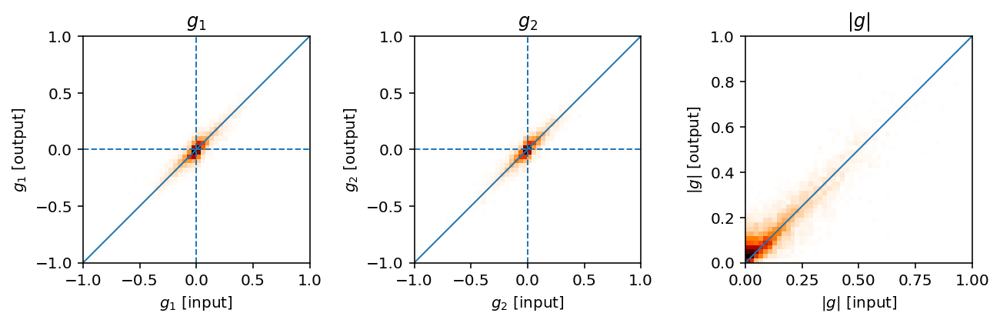

In [51]:
fig = plt.figure(figsize=(12,5))

emax = 1
bins = np.linspace(-emax,+emax,51)

ax = fig.add_subplot(141, aspect='equal')
_ = ax.hist2d(df_psf['e1_in_ksb'], df_psf['e1_out_ksb'], bins=bins, cmap=mpl.cm.gist_heat_r)
ax.plot([-emax,+emax],[-emax,+emax], lw=1)
ax.axhline(y=0, ls='--', lw=1)
ax.axvline(x=0, ls='--', lw=1)
ax.set_xlabel('$g_1$ [input]')
ax.set_ylabel('$g_1$ [output]')
ax.set_title('$g_1$')

ax = fig.add_subplot(142, aspect='equal')
_ = ax.hist2d(df_psf['e2_in_ksb'], df_psf['e2_out_ksb'], bins=bins, cmap=mpl.cm.gist_heat_r)
ax.plot([-emax,+emax],[-emax,+emax], lw=1)
ax.axhline(y=0, ls='--', lw=1)
ax.axvline(x=0, ls='--', lw=1)
ax.set_xlabel('$g_2$ [input]')
ax.set_ylabel('$g_2$ [output]')
ax.set_title('$g_2$')

ax = fig.add_subplot(143, aspect='equal')
_ = ax.hist2d(df_psf['e_in_ksb'], df_psf['e_out_ksb'], bins=np.linspace(0,1,51), cmap=mpl.cm.gist_heat_r)
#_ = ax.hist2d(df_plot['e_in'],df_plot['e_out'], bins=np.linspace(0,1,51), cmap=mpl.cm.gist_heat_r)
ax.plot([0,1],[0,1], lw=1)
ax.set_xlabel('$|g|$ [input]')
ax.set_ylabel('$|g|$ [output]')
ax.set_title('$|g|$')

plt.tight_layout()


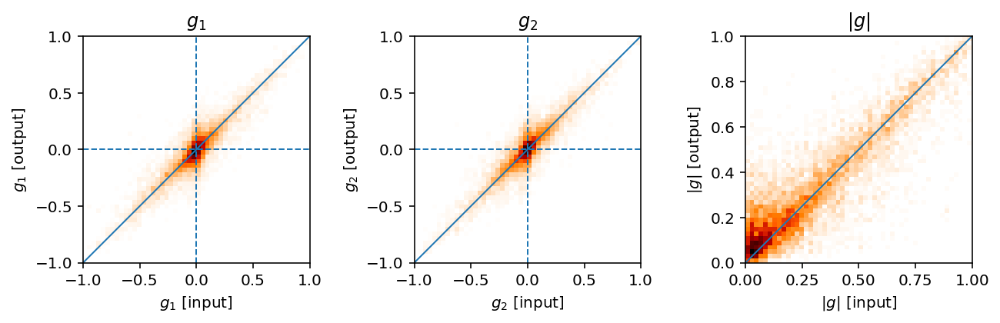

In [52]:
fig = plt.figure(figsize=(12,5))

emax = 1
bins = np.linspace(-emax,+emax,51)

ax = fig.add_subplot(141, aspect='equal')
_ = ax.hist2d(df_psf['e1_in_reg'], df_psf['e1_out_reg'], bins=bins, cmap=mpl.cm.gist_heat_r)
ax.plot([-emax,+emax],[-emax,+emax], lw=1)
ax.axhline(y=0, ls='--', lw=1)
ax.axvline(x=0, ls='--', lw=1)
ax.set_xlabel('$g_1$ [input]')
ax.set_ylabel('$g_1$ [output]')
ax.set_title('$g_1$')

ax = fig.add_subplot(142, aspect='equal')
_ = ax.hist2d(df_psf['e2_in_reg'], df_psf['e2_out_reg'], bins=bins, cmap=mpl.cm.gist_heat_r)
ax.plot([-emax,+emax],[-emax,+emax], lw=1)
ax.axhline(y=0, ls='--', lw=1)
ax.axvline(x=0, ls='--', lw=1)
ax.set_xlabel('$g_2$ [input]')
ax.set_ylabel('$g_2$ [output]')
ax.set_title('$g_2$')

ax = fig.add_subplot(143, aspect='equal')
_ = ax.hist2d(df_psf['e_in_reg'], df_psf['e_out_reg'], bins=np.linspace(0,1,51), cmap=mpl.cm.gist_heat_r)
#_ = ax.hist2d(df_plot['e_in'],df_plot['e_out'], bins=np.linspace(0,1,51), cmap=mpl.cm.gist_heat_r)
ax.plot([0,1],[0,1], lw=1)
ax.set_xlabel('$|g|$ [input]')
ax.set_ylabel('$|g|$ [output]')
ax.set_title('$|g|$')

plt.tight_layout()


## Flux reproduction

Text(0.5, 1.0, '$r$-band magnitude')

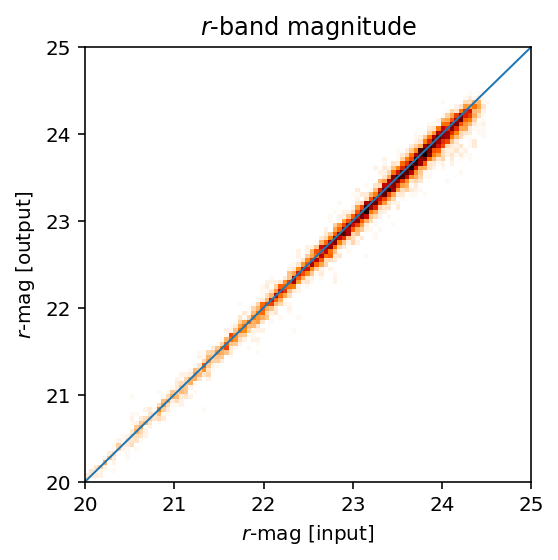

In [53]:
fig = plt.figure(figsize=(4,4))

emax = 100
bins = np.linspace(20,25,100)

#ax = fig.add_subplot(141, aspect='equal')
_ = plt.hist2d(df_psf['mag_in'], df_psf['mag_out'], bins=bins, cmap=mpl.cm.gist_heat_r)
plt.plot([-emax,+emax],[-emax,+emax], lw=1)
plt.axhline(y=0, ls='--', lw=1)
plt.axvline(x=0, ls='--', lw=1)
plt.xlabel('$r$-mag [input]')
plt.ylabel('$r$-mag [output]')
plt.title('$r$-band magnitude')

#plt.tight_layout()


# Without PSF

## Shape reproduction

In [12]:
data_dir = "/pbs/home/b/barcelin/sps_link/data/dc2_test/24.5/test/"
root = 'img_noiseless'

images = np.load(root_dir+'img_cropped_sample_2.npy', mmap_mode = 'c')
test_sample = [data_dir+'img_cropped_sample_2.npy']

In [184]:
df_no_psf = results_processing.processing(net_no_psf,
                                         data_dir,                                           
                                         root,
                                         test_sample[0],
                                         bands_lsst,
                                         3,
                                         stamp_size, 
                                         batch_size,
                                         psf, 
                                         pix_scale_lsst)

0
1
2


../../scripts/tools_for_VAE/tools_for_VAE/results_processing.py:81: RuntimeWarning: invalid value encountered in arctanh
  output_vae = np.sinh(np.arctanh(network.predict([input_to_deblend,psf_images])))


error for galaxy 800
3
error for galaxy 1276
4
5
6
7
8
9
10
error for galaxy 4041
11
error for galaxy 4469
12
13
14
15
16
17
error for galaxy 6859
error for galaxy 6886
18
19
20
21
error for galaxy 8421
22
23
24
25
error for galaxy 10046
26
27
28
29
error for galaxy 11670
30
31
32
error for galaxy 12836
33
error for galaxy 13210
34
35
error for galaxy 14070
36
error for galaxy 14456
37
38
39
40
41
error for galaxy 16403
42
error for galaxy 16802
43
44
45
46
error for galaxy 18471
47
48
error for galaxy 19207
49
50
error for galaxy 20071
51
error for galaxy 20477
52
53
error for galaxy 21219
54
error for galaxy 21641
55
error for galaxy 22010
56
57
58
59
60
error for galaxy 24093
61
error for galaxy 24411
error for galaxy 24451
error for galaxy 24487
62
63
error for galaxy 25280
64
65
error for galaxy 26001
error for galaxy 26048
66
67
68
69
error for galaxy 27644
error for galaxy 27653
70
71
72
73
error for galaxy 29285
74
error for galaxy 29659
75
76
error for galaxy 30410
error for g

In [185]:
df_no_psf.to_csv('data/df_vae_dc2_no_psf_noisy_i.csv')

In [9]:
df_no_psf = pd.read_csv('data/df_vae_dc2_no_psf_noisy.csv', encoding = 'utf-8')

In [13]:
df_no_psf_i = pd.read_csv('data/df_vae_dc2_no_psf_noisy_i.csv', encoding = 'utf-8')

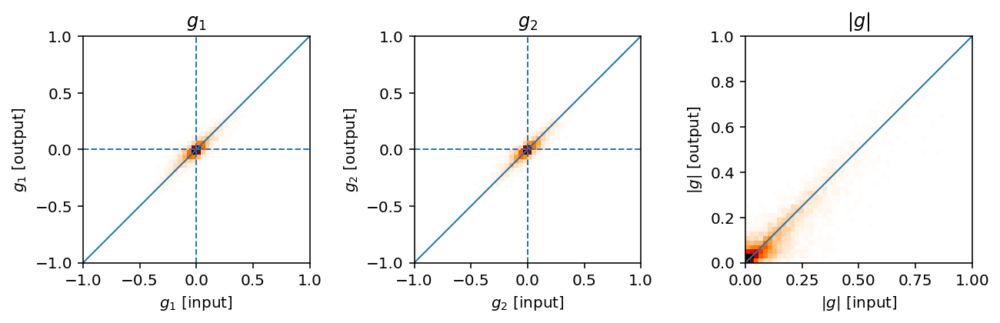

In [58]:
fig = plt.figure(figsize=(12,5))



emax = 1
bins = np.linspace(-emax,+emax,51)

ax = fig.add_subplot(141, aspect='equal')
_ = ax.hist2d(df_no_psf['e1_in_ksb'], df_no_psf['e1_out_ksb'], bins=bins, cmap=mpl.cm.gist_heat_r)
ax.plot([-emax,+emax],[-emax,+emax], lw=1)
ax.axhline(y=0, ls='--', lw=1)
ax.axvline(x=0, ls='--', lw=1)
ax.set_xlabel('$g_1$ [input]')
ax.set_ylabel('$g_1$ [output]')
ax.set_title('$g_1$')

ax = fig.add_subplot(142, aspect='equal')
_ = ax.hist2d(df_no_psf['e2_in_ksb'], df_no_psf['e2_out_ksb'], bins=bins, cmap=mpl.cm.gist_heat_r)
ax.plot([-emax,+emax],[-emax,+emax], lw=1)
ax.axhline(y=0, ls='--', lw=1)
ax.axvline(x=0, ls='--', lw=1)
ax.set_xlabel('$g_2$ [input]')
ax.set_ylabel('$g_2$ [output]')
ax.set_title('$g_2$')

ax = fig.add_subplot(143, aspect='equal')
_ = ax.hist2d(df_no_psf['e_in_ksb'], df_no_psf['e_out_ksb'], bins=np.linspace(0,1,51), cmap=mpl.cm.gist_heat_r)
#_ = ax.hist2d(df_plot['e_in'],df_plot['e_out'], bins=np.linspace(0,1,51), cmap=mpl.cm.gist_heat_r)
ax.plot([0,1],[0,1], lw=1)
ax.set_xlabel('$|g|$ [input]')
ax.set_ylabel('$|g|$ [output]')
ax.set_title('$|g|$')

plt.tight_layout()

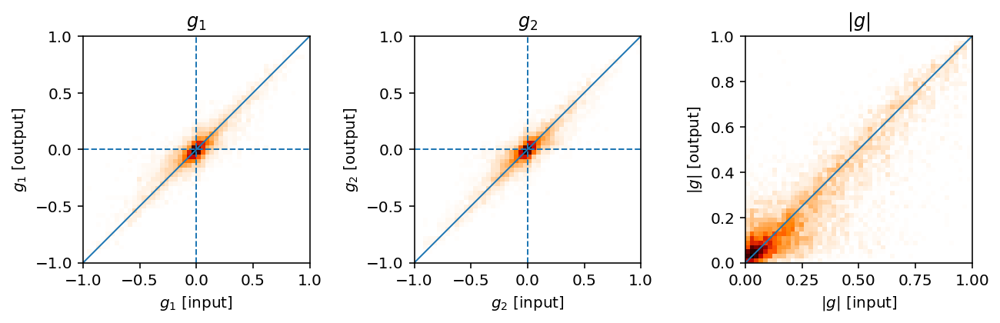

In [59]:
fig = plt.figure(figsize=(12,5))



emax = 1
bins = np.linspace(-emax,+emax,51)

ax = fig.add_subplot(141, aspect='equal')
_ = ax.hist2d(df_no_psf['e1_in_reg'], df_no_psf['e1_out_reg'], bins=bins, cmap=mpl.cm.gist_heat_r)
ax.plot([-emax,+emax],[-emax,+emax], lw=1)
ax.axhline(y=0, ls='--', lw=1)
ax.axvline(x=0, ls='--', lw=1)
ax.set_xlabel('$g_1$ [input]')
ax.set_ylabel('$g_1$ [output]')
ax.set_title('$g_1$')

ax = fig.add_subplot(142, aspect='equal')
_ = ax.hist2d(df_no_psf['e2_in_reg'], df_no_psf['e2_out_reg'], bins=bins, cmap=mpl.cm.gist_heat_r)
ax.plot([-emax,+emax],[-emax,+emax], lw=1)
ax.axhline(y=0, ls='--', lw=1)
ax.axvline(x=0, ls='--', lw=1)
ax.set_xlabel('$g_2$ [input]')
ax.set_ylabel('$g_2$ [output]')
ax.set_title('$g_2$')

ax = fig.add_subplot(143, aspect='equal')
_ = ax.hist2d(df_no_psf['e_in_reg'], df_no_psf['e_out_reg'], bins=np.linspace(0,1,51), cmap=mpl.cm.gist_heat_r)
#_ = ax.hist2d(df_plot['e_in'],df_plot['e_out'], bins=np.linspace(0,1,51), cmap=mpl.cm.gist_heat_r)
ax.plot([0,1],[0,1], lw=1)
ax.set_xlabel('$|g|$ [input]')
ax.set_ylabel('$|g|$ [output]')
ax.set_title('$|g|$')

plt.tight_layout()

## Flux reproduction

Text(0.5, 1.0, '$r$-band magnitude')

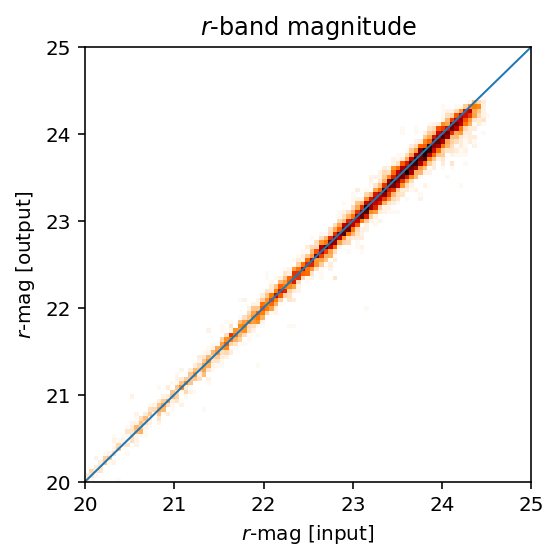

In [60]:
fig = plt.figure(figsize=(4,4))

emax = 100
bins = np.linspace(20,25,100)

#ax = fig.add_subplot(141, aspect='equal')
_ = plt.hist2d(df_no_psf['mag_in'], df_no_psf['mag_out'], bins=bins, cmap=mpl.cm.gist_heat_r)
plt.plot([-emax,+emax],[-emax,+emax], lw=1)
plt.axhline(y=0, ls='--', lw=1)
plt.axvline(x=0, ls='--', lw=1)
plt.xlabel('$r$-mag [input]')
plt.ylabel('$r$-mag [output]')
plt.title('$r$-band magnitude')

#plt.tight_layout()


# Delta WL parameters

## As function of SNR

In [11]:
df_plot = pd.concat([df_psf, df_no_psf], ignore_index=True)
df_plot['exp'] = [1]*10000 + [2]*10000

In [12]:
df_plot

,Unnamed: 0,id,e1,e2,shear_1,shear_2,redshift,redshift_true,blendedness,snr_r,...,e_in_reg,e_out_reg,e_error_reg,e_in_obs_ksb,e_out_obs_ksb,e_obs_error_ksb,mag_in,mag_out,delta_mag,exp
0,0,6000542719,0.107939,-0.378144,0.003401,0.001616,0.555395,0.555024,0.000000e+00,143.526553,...,0.706858,0.732358,0.025500,0.434346,0.445743,0.011397,22.595931,22.415869,-0.180062,1
1,1,7002508926,0.030137,0.078186,-0.000434,-0.007706,1.035572,1.034230,0.000000e+00,45.361976,...,0.164745,0.022114,-0.142632,0.017695,0.009831,-0.007865,24.277602,24.125150,-0.152451,1
2,2,7003076680,-0.274697,0.108764,0.011749,0.005150,1.103071,1.118202,1.726409e-04,43.881997,...,0.771828,0.723720,-0.048107,0.092376,0.087705,-0.004672,24.384241,24.331617,-0.052624,1
3,3,7001184867,-0.187118,0.302167,-0.000108,-0.003375,0.760792,0.755289,6.817342e-02,65.864587,...,0.736250,0.671459,-0.064791,0.150599,0.208450,0.057852,23.068190,23.092644,0.024454,1
4,4,6001754782,-0.005709,0.004559,0.000341,-0.009107,0.915118,0.907079,9.068794e-03,80.891898,...,0.014808,0.095178,0.080369,0.011476,0.056747,0.045271,23.184655,23.082745,-0.101910,1
5,5,7000882760,0.000312,-0.055905,-0.006311,-0.009120,0.674783,0.674843,4.882416e-05,51.378779,...,0.189189,0.364712,0.175523,0.034829,0.086640,0.051810,24.141578,24.211540,0.069962,1
6,6,6000762167,-0.077130,-0.052751,-0.003559,0.009595,0.630387,0.633642,6.789515e-03,78.562084,...,0.191619,0.138599,-0.053019,0.065432,0.047318,-0.018114,23.571631,23.503925,-0.067706,1
7,7,7000310489,0.109083,0.019797,0.003889,0.001969,0.469199,0.469145,0.000000e+00,324.825753,...,0.238520,0.136606,-0.101913,0.066516,0.039053,-0.027463,21.966016,22.025380,0.059363,1
8,8,6007417860,-0.001756,-0.030963,0.010128,-0.015410,1.768460,1.766109,3.573528e-04,53.711315,...,0.099223,0.068102,-0.031121,0.024536,0.023057,-0.001479,23.925755,23.924372,-0.001383,1
9,9,6002193856,0.113330,0.132385,-0.003001,0.002157,0.996017,0.996346,4.136335e-06,115.443323,...,0.347011,0.376456,0.029445,0.133259,0.152803,0.019544,22.643735,22.572987,-0.070749,1


In [13]:
df_plot = df_plot.drop('Unnamed: 0', axis = 1)

df_plot = df_plot.dropna(axis = 1, how = 'all')

df_plot = df_plot[(df_plot['e1_out_ksb']<=1.) & 
                  (df_plot['e2_out_ksb']<=1.) &
                  (df_plot['e1_out_ksb']>=-1.) & 
                  (df_plot['e2_out_ksb']>=-1.) &
                  (df_plot['e_out_ksb']>=0.) & 
                  (df_plot['e_out_ksb']<=1.) ]

### Error on ellipticity

In [105]:
df_plot.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19872 entries, 0 to 19999
Data columns (total 39 columns):
id                 19872 non-null int64
e1                 19872 non-null float64
e2                 19872 non-null float64
shear_1            19872 non-null float64
shear_2            19872 non-null float64
redshift           19872 non-null float64
redshift_true      19872 non-null float64
blendedness        19870 non-null float64
snr_r              19868 non-null float64
convergence        19872 non-null float64
e1_hsm_regauss     19824 non-null float64
e2_hsm_regauss     19824 non-null float64
mag_r_meas         19868 non-null float64
mag_r_true         19872 non-null float64
e1_in_ksb          19872 non-null float64
e1_out_ksb         19872 non-null float64
e1_error_ksb       19872 non-null float64
e2_in_ksb          19872 non-null float64
e2_out_ksb         19872 non-null float64
e2_error_ksb       19872 non-null float64
e_in_ksb           19872 non-null float64
e_out_ksb  

In [106]:
np.min(df_plot['snr_r']), np.max(df_plot['snr_r'])

(39.86887204889025, 21154.467495250905)

In [107]:
mpl.rcParams['font.size']=15

In [126]:
reload(boxplot)

<module 'tools_for_VAE.boxplot' from '../../scripts/tools_for_VAE/tools_for_VAE/boxplot.py'>

In [14]:
df_no_psf['exp'] = [1]*10000

df_no_psf = df_no_psf.dropna(axis = 1, how = 'all')

df_no_psf = df_no_psf[(df_no_psf['e1_out_ksb']<=1.) & 
                  (df_no_psf['e2_out_ksb']<=1.) &
                  (df_no_psf['e1_out_ksb']>=-1.) & 
                  (df_no_psf['e2_out_ksb']>=-1.) &
                  (df_no_psf['e_out_ksb']>=0.) & 
                  (df_no_psf['e_out_ksb']<=1.) ]

9886
[1]
0 1


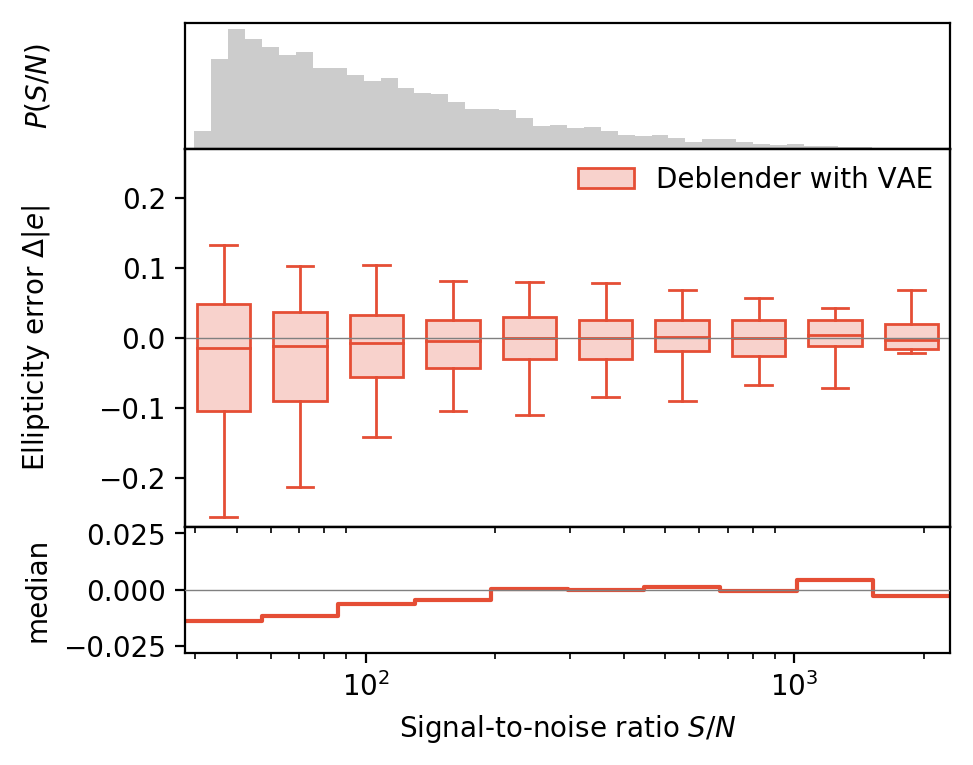

In [17]:
fig, median_shear, q1_shear, q3_shear, whislo_shear, whishi_shear = boxplot.boxplot_func(df_no_psf, x = 'snr_r', y = 'e_error_ksb', z = 'exp',
              xlim = (38, 2300),
              ylim = (-0.27, 0.27),
              ylim2= (-0.028, 0.028),
              x_scale = 'log',
              legend = ['Deblender with VAE'],
              x_label='Signal-to-noise ratio $S/N$', 
              y_label = 'Ellipticity error $\\Delta |e|$',
              y_label_hist='$P(S/N)$',
              y_label_2 = 'median',
              legend_remove = False,
              palette=mpl.cm.RdYlBu([0.15]),
              nbins = 10)

fig.savefig('imgs/e_snr_dc2_no_psf.pdf')

9886
[1]
0 1


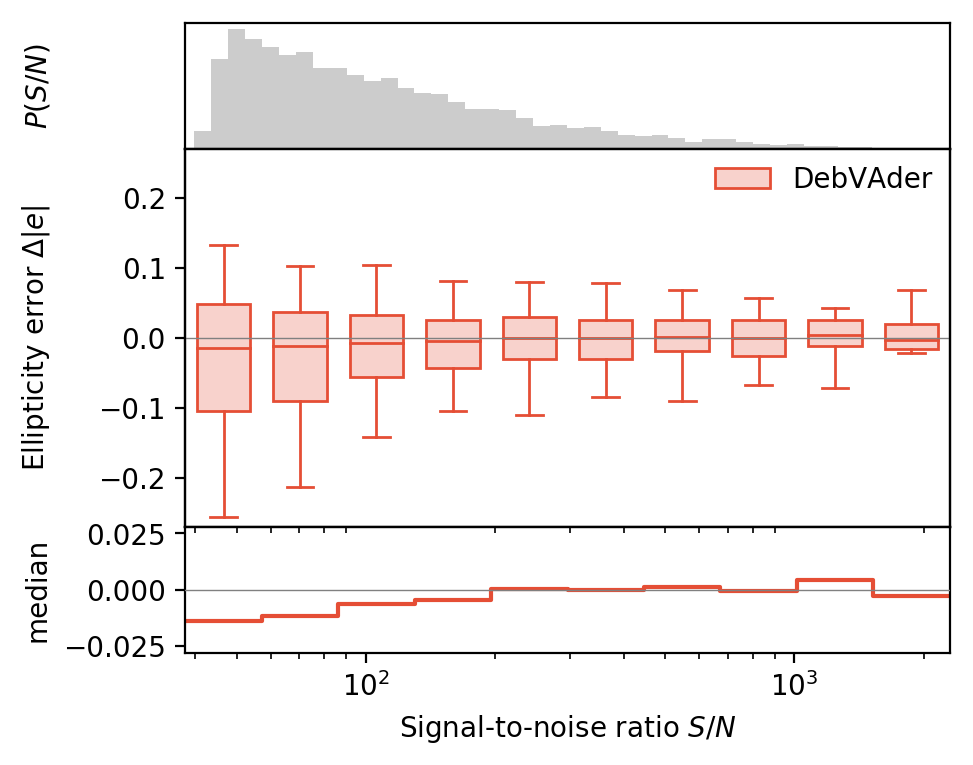

In [35]:
fig, median_shear, q1_shear, q3_shear, whislo_shear, whishi_shear = boxplot.boxplot_func(df_no_psf, x = 'snr_r', y = 'e_error_ksb', z = 'exp',
              xlim = (38, 2300),
              ylim = (-0.27, 0.27),
              ylim2= (-0.028, 0.028),
              x_scale = 'log',
              legend = ['DebVAder'],
              x_label='Signal-to-noise ratio $S/N$', 
              y_label = 'Ellipticity error $\\Delta |e|$',
              y_label_hist='$P(S/N)$',
              y_label_2 = 'median',
              legend_remove = False,
              palette=mpl.cm.RdYlBu([0.15]),
              nbins = 10)

fig.savefig('imgs/e_snr_dc2_no_psf_vader.pdf')

19824
[1 2]
0 1
1 2


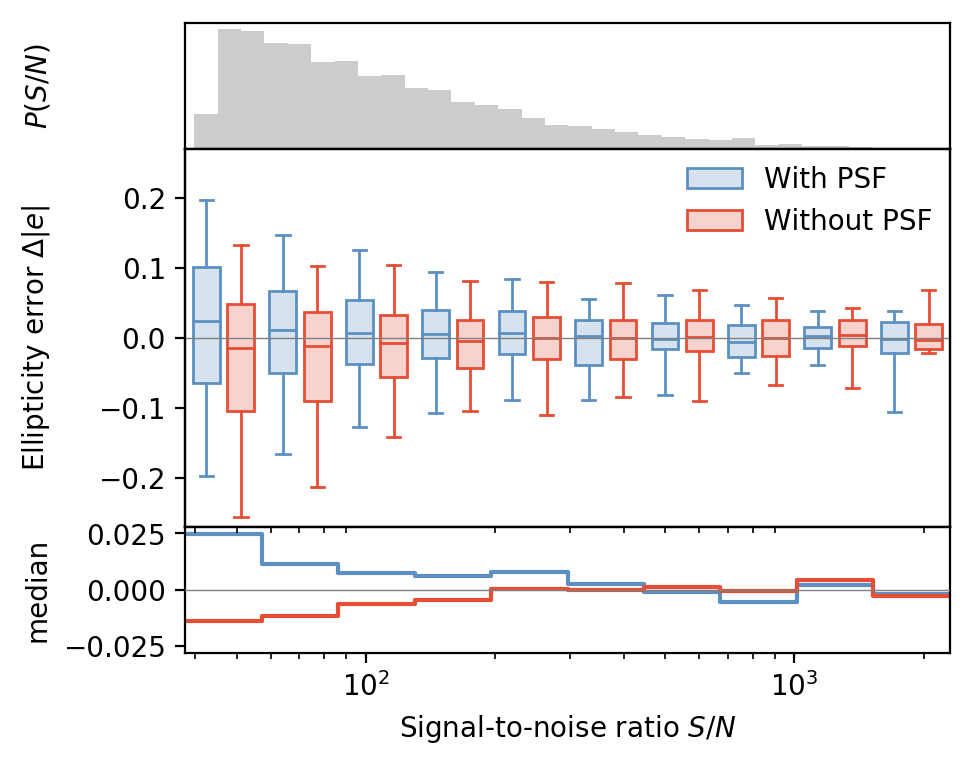

In [131]:
fig, median_shear, q1_shear, q3_shear, whislo_shear, whishi_shear = boxplot.boxplot_func(df_plot, x = 'snr_r', y = 'e_error_ksb', z = 'exp',
              xlim = (38, 2300),
              ylim = (-0.27, 0.27),
              ylim2= (-0.028, 0.028),
              x_scale = 'log',
              legend = ['With PSF', 'Without PSF'],
              x_label='Signal-to-noise ratio $S/N$', 
              y_label = 'Ellipticity error $\\Delta |e|$',
              y_label_hist='$P(S/N)$',
              y_label_2 = 'median',
              legend_remove = False,
              palette=mpl.cm.RdYlBu([0.85,0.15]),
              nbins = 10)

fig.savefig('imgs/e_snr_dc2.pdf')

Magnitude error as function of S/N

9886
[1]
0 1


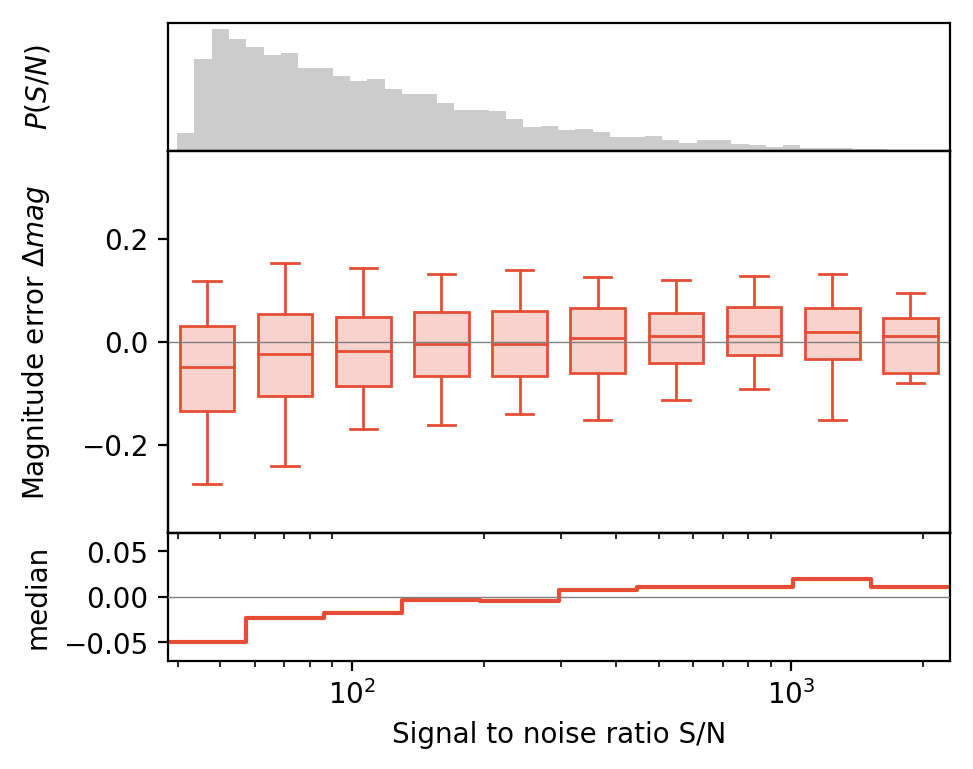

In [36]:
fig, median_mag, q1_mag, q3_mag, whislo_mag, whishi_mag = boxplot.boxplot_func(df_no_psf, x = 'snr_r', y = 'delta_mag', z = 'exp',
              xlim = (38, 2300),
              ylim = (-0.37,0.37),
              ylim2 = (-0.07,0.07),
              x_scale = 'log',
              legend = ['With PSF'],
              x_label='Signal to noise ratio S/N', 
              y_label = 'Magnitude error $\\Delta mag$',
              y_label_hist='$P(S/N)$',
              y_label_2 = 'median',
              legend_remove = True,
              palette=mpl.cm.RdYlBu([0.15]),
              nbins = 10)

fig.savefig('imgs/mag_snr_dc2_no_psf.pdf')

19824
[1 2]
0 1
1 2


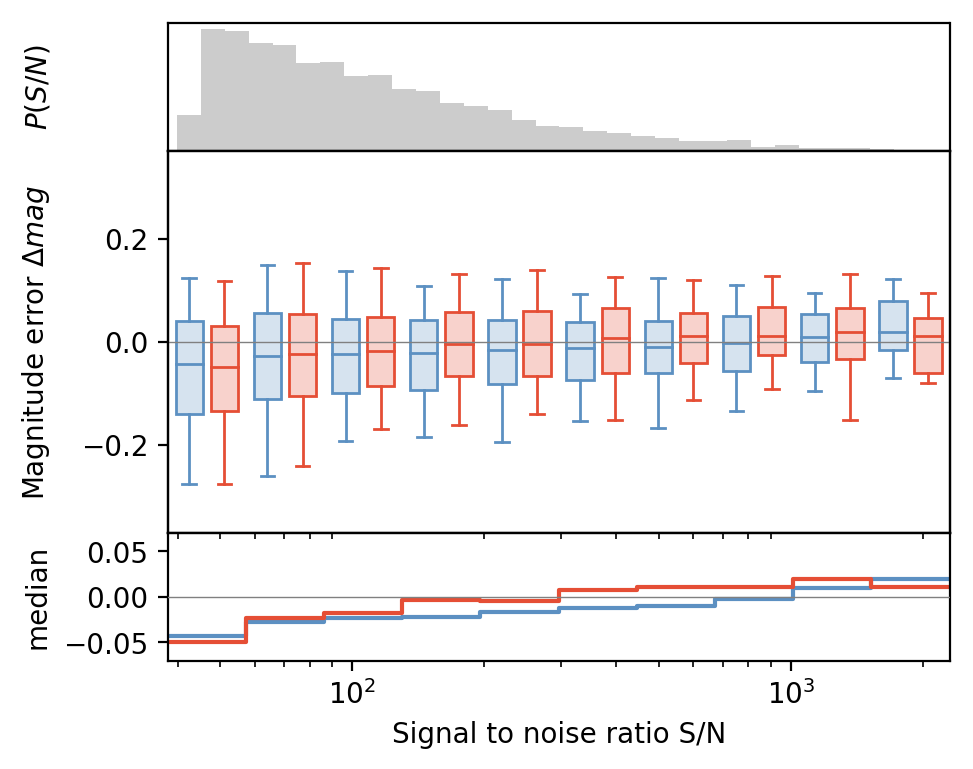

In [132]:
fig, median_mag, q1_mag, q3_mag, whislo_mag, whishi_mag = boxplot.boxplot_func(df_plot, x = 'snr_r', y = 'delta_mag', z = 'exp',
              xlim = (38, 2300),
              ylim = (-0.37,0.37),
              ylim2 = (-0.07,0.07),
              x_scale = 'log',
              legend = ['With PSF', 'Without PSF'],
              x_label='Signal to noise ratio S/N', 
              y_label = 'Magnitude error $\\Delta mag$',
              y_label_hist='$P(S/N)$',
              y_label_2 = 'median',
              legend_remove = True,
              palette=mpl.cm.RdYlBu([0.85,0.15]),
              nbins = 10)

fig.savefig('imgs/mag_snr_dc2.pdf')

In [79]:
df_stat = pd.DataFrame()
df_stat['median_shear'] = np.abs(median_shear)
df_stat['q1_shear'] = np.abs(q1_shear)
df_stat['q3_shear'] = np.abs(q3_shear)
df_stat['whislo_shear'] = np.abs(whislo_shear)
df_stat['whishi_shear'] = np.abs(whishi_shear)
df_stat['median_mag'] = np.abs(median_mag)
df_stat['q1_mag'] = np.abs(q1_mag)
df_stat['q3_mag'] = np.abs(q3_mag)
df_stat['whislo_mag'] = np.abs(whislo_mag)
df_stat['whishi_mag'] = np.abs(whishi_mag)
df_stat['stats_names'] = ['LSST']*10 + ['LSST Euclid']*10

x = 10

In [80]:
param = 'median_shear'
print('mean for each exp: '+str([np.mean(df_stat[param][:x]), np.mean(df_stat[param][10:10+x])]))
print('improvement between each exp: '+str([np.mean(df_stat[param][:x])/np.mean(df_stat[param][10:10+x]) ]))
param = 'q1_shear'
print('mean for each exp: '+str([np.mean(df_stat[param][:x]), np.mean(df_stat[param][10:10+x])]))
print('improvement between each exp: '+str([np.mean(df_stat[param][:x])/np.mean(df_stat[param][10:10+x]) ]))
param = 'q3_shear'
print('mean for each exp: '+str([np.mean(df_stat[param][:x]), np.mean(df_stat[param][10:10+x])]))
print('improvement between each exp: '+str([np.mean(df_stat[param][:x])/np.mean(df_stat[param][10:10+x]) ]))
param = 'whislo_shear'
print('mean for each exp: '+str([np.mean(df_stat[param][:x]), np.mean(df_stat[param][10:10+x])]))
print('improvement between each exp: '+str([np.mean(df_stat[param][:x])/np.mean(df_stat[param][10:10+x])]))
param = 'whishi_shear'
print('mean for each exp: '+str([np.mean(df_stat[param][:x]), np.mean(df_stat[param][10:10+x])]))
print('improvement between each exp: '+str([np.mean(df_stat[param][:x])/np.mean(df_stat[param][10:10+x])]))

mean for each exp: [0.003728171152543317, 0.001979416757497653]
improvement between each exp: [1.8834695313261929]
mean for each exp: [0.04563102958831936, 0.028772907960680244]
improvement between each exp: [1.5859026015262923]
mean for each exp: [0.03918407683739176, 0.025626256967907397]
improvement between each exp: [1.5290597017919263]
mean for each exp: [0.12799833455748005, 0.09174056214813894]
improvement between each exp: [1.3952207350854633]
mean for each exp: [0.10121087052419087, 0.07872937600881602]
improvement between each exp: [1.2855540797485476]


In [81]:
param = 'median_mag'
print('mean for each exp: '+str([np.mean(df_stat[param][:x]), np.mean(df_stat[param][10:10+x])]))
print('improvement between each exp: '+str([np.mean(df_stat[param][:x])/np.mean(df_stat[param][10:10+x]) ]))
param = 'q1_mag'
print('mean for each exp: '+str([np.mean(df_stat[param][:x]), np.mean(df_stat[param][10:10+x])]))
print('improvement between each exp: '+str([np.mean(df_stat[param][:x])/np.mean(df_stat[param][10:10+x]) ]))
param = 'q3_mag'
print('mean for each exp: '+str([np.mean(df_stat[param][:x]), np.mean(df_stat[param][10:10+x])]))
print('improvement between each exp: '+str([np.mean(df_stat[param][:x])/np.mean(df_stat[param][10:10+x]) ]))
param = 'whislo_mag'
print('mean for each exp: '+str([np.mean(df_stat[param][:x]), np.mean(df_stat[param][10:10+x])]))
print('improvement between each exp: '+str([np.mean(df_stat[param][:x])/np.mean(df_stat[param][10:10+x])]))
param = 'whishi_mag'
print('mean for each exp: '+str([np.mean(df_stat[param][:x]), np.mean(df_stat[param][10:10+x])]))
print('improvement between each exp: '+str([np.mean(df_stat[param][:x])/np.mean(df_stat[param][10:10+x])]))

mean for each exp: [0.017772644095477474, 0.00659700169144326]
improvement between each exp: [2.694048740131407]
mean for each exp: [0.0757752156770978, 0.055747148778179226]
improvement between each exp: [1.3592662107009506]
mean for each exp: [0.06488701050810063, 0.04419339798378537]
improvement between each exp: [1.4682512200557147]
mean for each exp: [0.15909738649717262, 0.144058735378141]
improvement between each exp: [1.1043924971266512]
mean for each exp: [0.14380506794441422, 0.11367698579272592]
improvement between each exp: [1.2650323804910049]


## As a function of blend rate

### As a function of blendedness

#### Error on ellipticity

In [93]:
np.max(df_plot['blendedness']), np.min(df_plot['blendedness'])

(0.628631488532428, -0.002334192643843825)

In [110]:
np.where(df_plot['blendedness']<0)

(array([   59,    69,    76,    93,   114,   184,   220,   251,   403,
          428,   431,   441,   456,   477,   485,   491,   549,   575,
          625,   626,   714,   737,   747,   749,   769,   778,   806,
          839,   869,   943,   982,  1024,  1114,  1115,  1142,  1149,
         1208,  1219,  1226,  1227,  1269,  1284,  1292,  1301,  1373,
         1460,  1465,  1508,  1527,  1536,  1573,  1627,  1648,  1703,
         1706,  1726,  1849,  1877,  1878,  1930,  1941,  1967,  2017,
         2030,  2071,  2076,  2147,  2149,  2198,  2202,  2236,  2244,
         2255,  2270,  2363,  2375,  2395,  2408,  2497,  2550,  2564,
         2617,  2641,  2651,  2708,  2769,  2859,  2869,  2892,  2903,
         2931,  2982,  3018,  3040,  3051,  3099,  3123,  3196,  3294,
         3319,  3325,  3333,  3338,  3347,  3404,  3428,  3431,  3447,
         3466,  3489,  3577,  3581,  3642,  3651,  3729,  3743,  3874,
         3908,  3923,  4104,  4141,  4151,  4190,  4234,  4298,  4341,
      

In [96]:
df_plot['blendedness'] = df_plot['blendedness'] +0.0023341926438438251

In [15]:
df_plot_2 = df_plot[df_plot['blendedness']>0]

In [118]:
np.min(df_plot_2['blendedness'])

2.131073095767988e-12

In [16]:
df_no_psf_2 = df_no_psf[df_no_psf['blendedness']>0]

7992
[1]
0 1


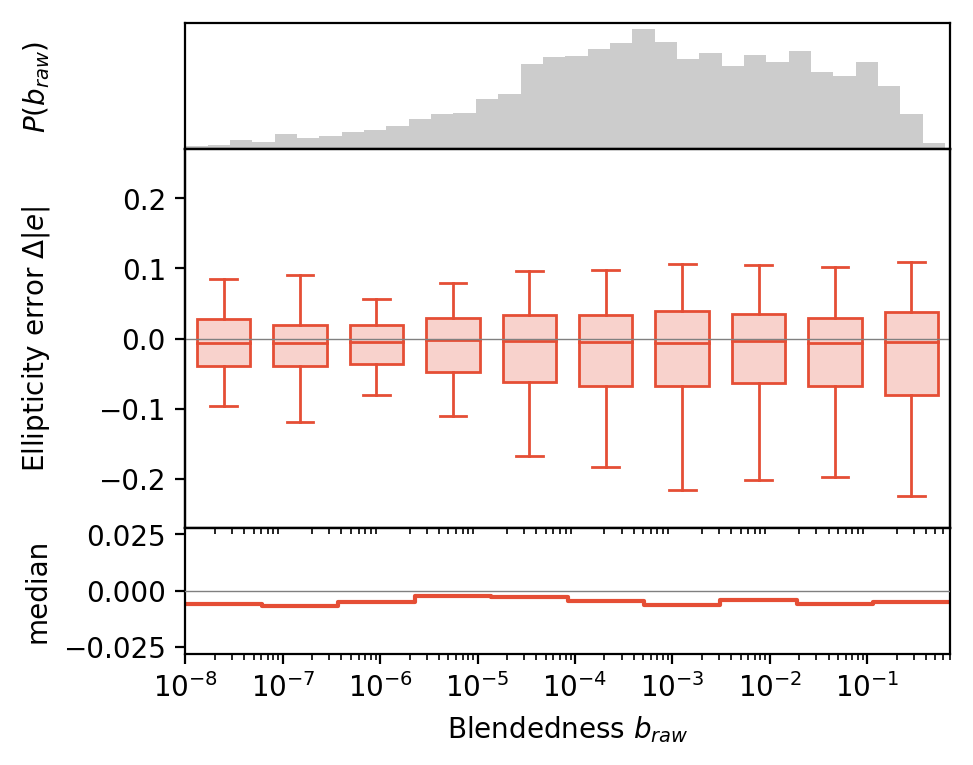

In [18]:
fig, median_shear, q1_shear, q3_shear, whislo_shear, whishi_shear = boxplot.boxplot_func(df_no_psf_2, x = 'blendedness', y = 'e_error_ksb', z = 'exp',
              xlim = (1e-8, 0.7),
              ylim = (-0.27,0.27), 
              ylim2 = (-0.028,0.028), 
              x_scale = 'log',
              legend = ['Deblender with VAE'],
              x_label='Blendedness $b_{raw}$', 
              y_label = 'Ellipticity error $\\Delta |e|$',
              y_label_hist='$P(b_{raw})$',
              y_label_2 = 'median',
              legend_remove = True,
              palette=mpl.cm.RdYlBu([0.15]),
              nbins = 10)
fig.savefig('imgs/e_blend_dc2_no_psf_v1.pdf')

7992
[1]
0 1


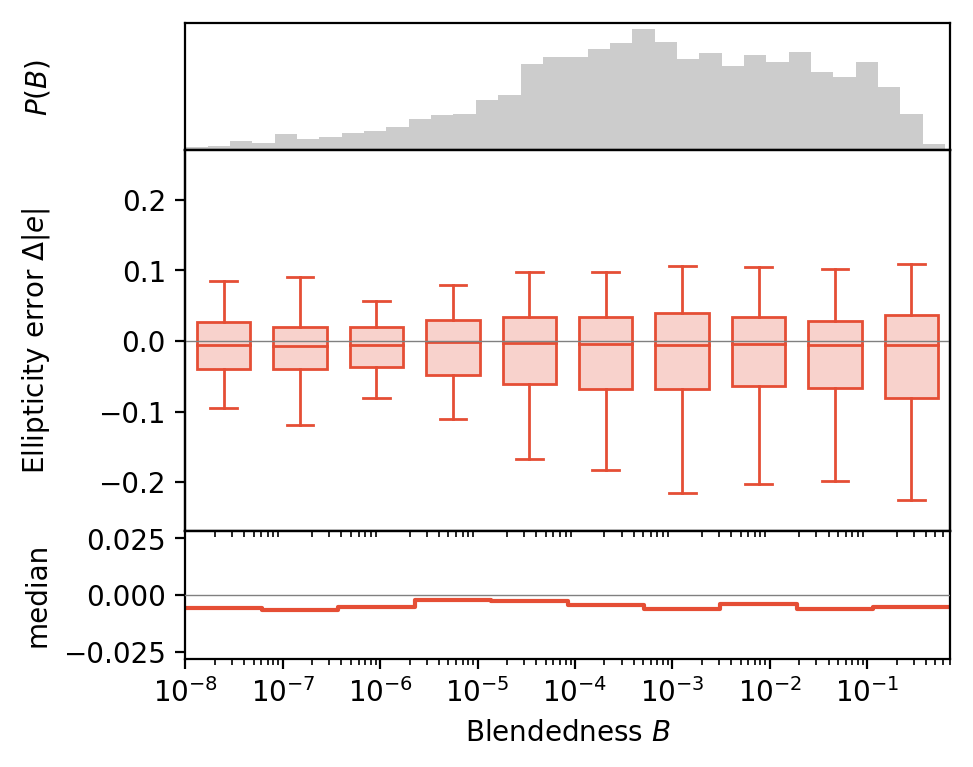

In [19]:
fig, median_shear, q1_shear, q3_shear, whislo_shear, whishi_shear = boxplot.boxplot_func(df_no_psf_2, x = 'blendedness', y = 'e_error_ksb', z = 'exp',
              xlim = (1e-8, 0.7),
              ylim = (-0.27,0.27), 
              ylim2 = (-0.028,0.028), 
              x_scale = 'log',
              legend = ['Deblender with VAE'],
              x_label='Blendedness $B$', 
              y_label = 'Ellipticity error $\\Delta |e|$',
              y_label_hist='$P(B)$',
              y_label_2 = 'median',
              legend_remove = True,
              palette=mpl.cm.RdYlBu([0.15]),
              nbins = 10)

fig.savefig('imgs/e_blend_dc2_no_psf.pdf')

16032
[1 2]
0 1
1 2


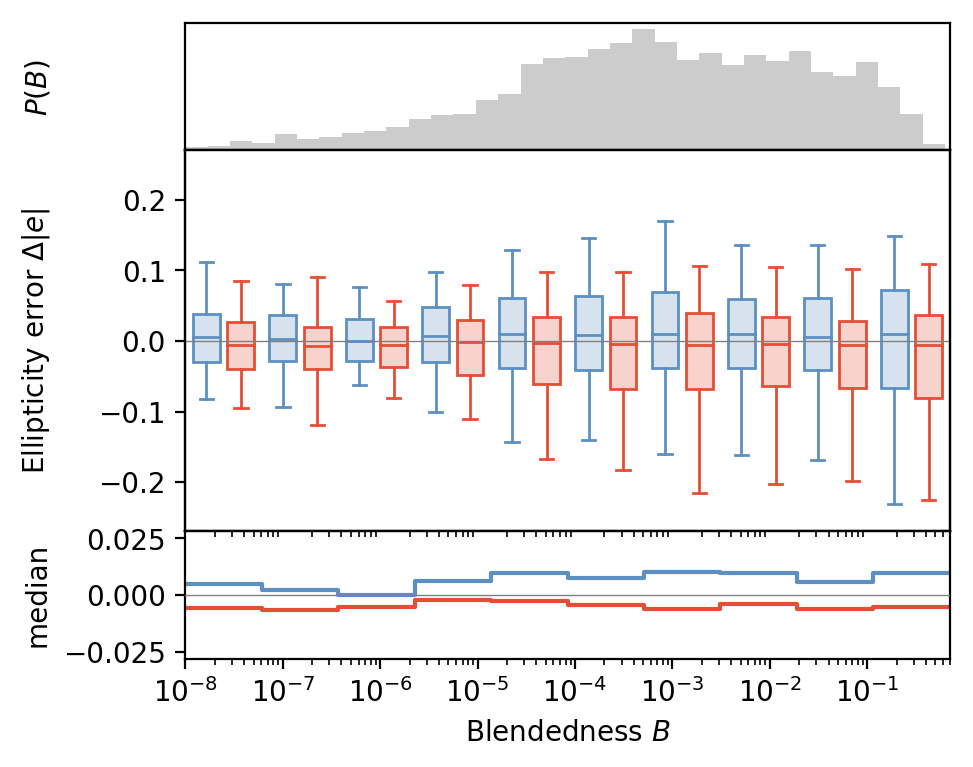

In [133]:
fig, median_shear, q1_shear, q3_shear, whislo_shear, whishi_shear = boxplot.boxplot_func(df_plot_2, x = 'blendedness', y = 'e_error_ksb', z = 'exp',
              xlim = (1e-8, 0.7),
              ylim = (-0.27,0.27), 
              ylim2 = (-0.028,0.028), 
              x_scale = 'log',
              legend = ['With PSF', 'Without PSF'],
              x_label='Blendedness $B$', 
              y_label = 'Ellipticity error $\\Delta |e|$',
              y_label_hist='$P(B)$',
              y_label_2 = 'median',
              legend_remove = True,
              palette=mpl.cm.RdYlBu([0.85,0.15]),
              nbins = 10)

fig.savefig('imgs/e_blend_dc2.pdf')

#### Error on flux

7992
[1]
0 1


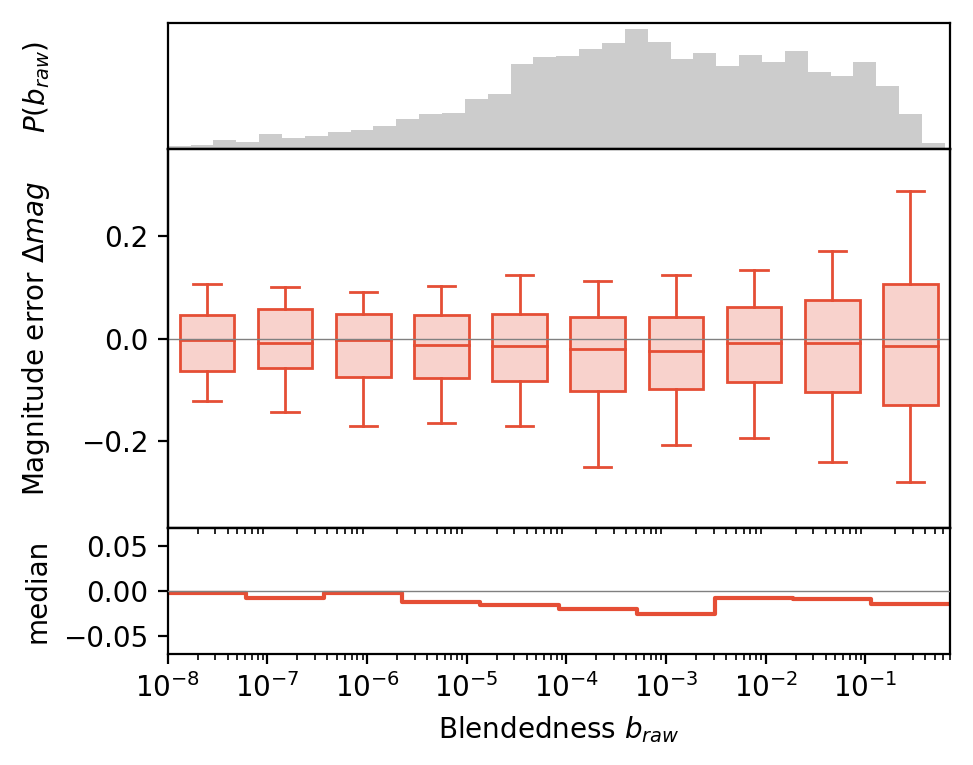

In [19]:
fig, median_mag, q1_mag, q3_mag, whislo_mag, whishi_mag = boxplot.boxplot_func(df_no_psf_2, x = 'blendedness', y = 'delta_mag', z = 'exp',
              xlim = (1e-8, 0.7),
              ylim = (-0.37,0.37), 
              ylim2 = (-0.07,0.07),
              x_scale = 'log',
              legend = ['With PSF'],
              x_label='Blendedness $b_{raw}$', 
              y_label = 'Magnitude error $\\Delta mag$',
              y_label_hist='$P(b_{raw})$',
              y_label_2 = 'median',
              legend_remove = True,
              palette=mpl.cm.RdYlBu([0.15]),
              nbins = 10)

fig.savefig('imgs/mag_blend_dc2_no_psf_v1.pdf')

7992
[1]
0 1


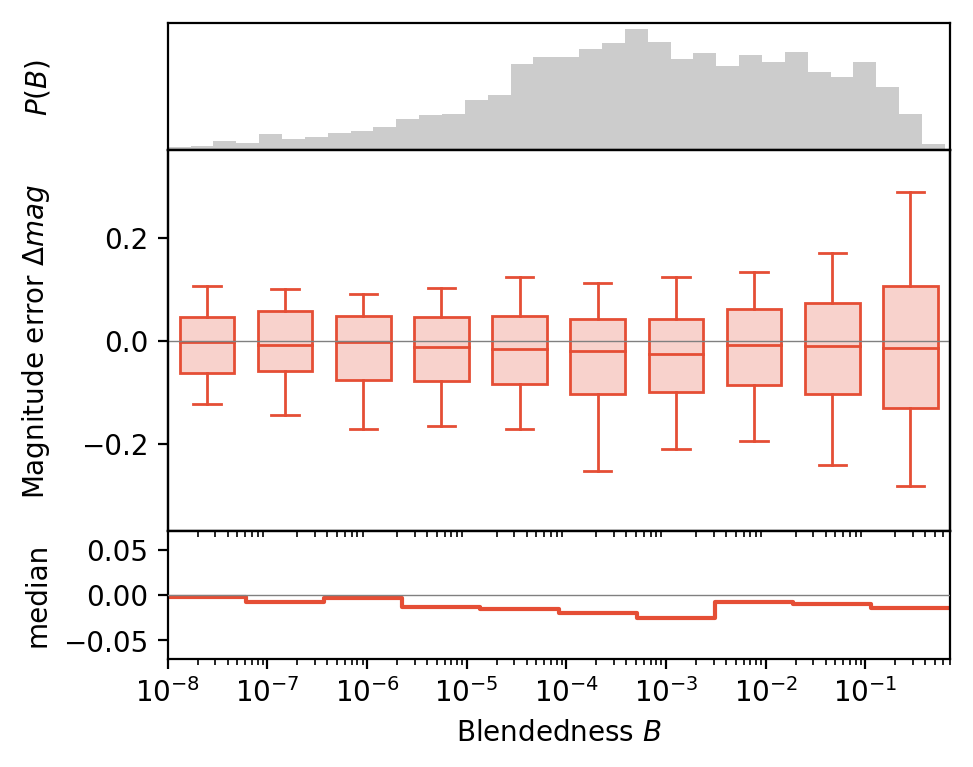

In [39]:
fig, median_mag, q1_mag, q3_mag, whislo_mag, whishi_mag = boxplot.boxplot_func(df_no_psf_2, x = 'blendedness', y = 'delta_mag', z = 'exp',
              xlim = (1e-8, 0.7),
              ylim = (-0.37,0.37), 
              ylim2 = (-0.07,0.07),
              x_scale = 'log',
              legend = ['With PSF'],
              x_label='Blendedness $B$', 
              y_label = 'Magnitude error $\\Delta mag$',
              y_label_hist='$P(B)$',
              y_label_2 = 'median',
              legend_remove = True,
              palette=mpl.cm.RdYlBu([0.15]),
              nbins = 10)

fig.savefig('imgs/mag_blend_dc2_no_psf.pdf')

16032
[1 2]
0 1
1 2


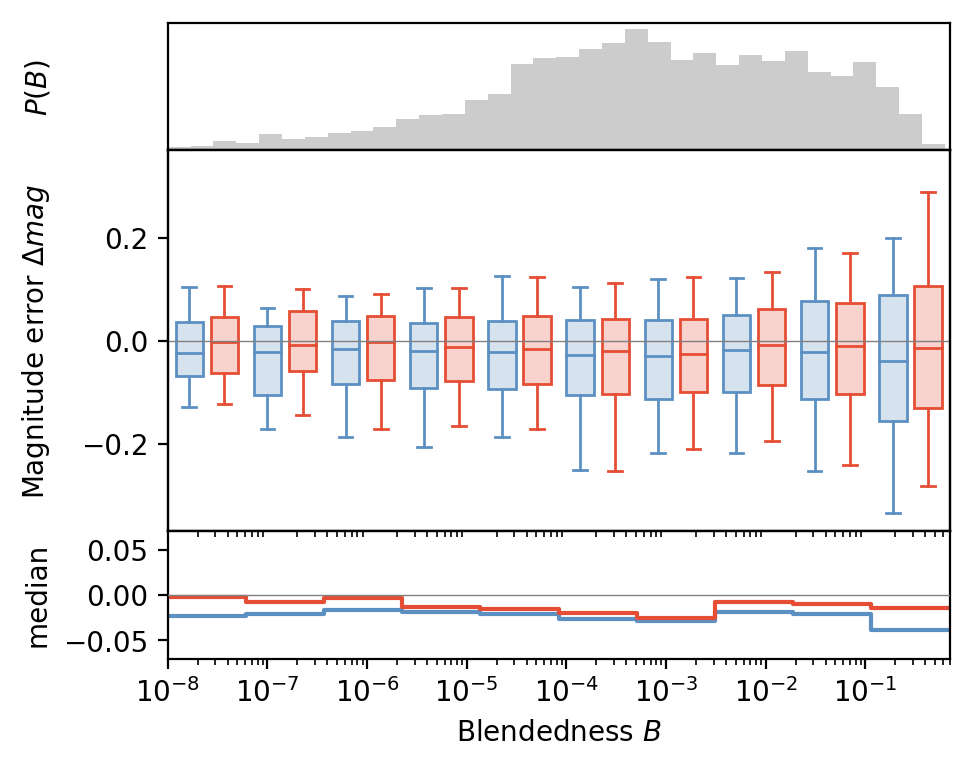

In [134]:
fig, median_mag, q1_mag, q3_mag, whislo_mag, whishi_mag = boxplot.boxplot_func(df_plot_2, x = 'blendedness', y = 'delta_mag', z = 'exp',
              xlim = (1e-8, 0.7),
              ylim = (-0.37,0.37), 
              ylim2 = (-0.07,0.07),
              x_scale = 'log',
              legend = ['With PSF', 'Without PSF'],
              x_label='Blendedness $B$', 
              y_label = 'Magnitude error $\\Delta mag$',
              y_label_hist='$P(B)$',
              y_label_2 = 'median',
              legend_remove = True,
              palette=mpl.cm.RdYlBu([0.85,0.15]),
              nbins = 10)

fig.savefig('imgs/mag_blend_dc2.pdf')

In [84]:
df_stat = pd.DataFrame()
df_stat['median_shear'] = np.abs(median_shear)
df_stat['q1_shear'] = np.abs(q1_shear)
df_stat['q3_shear'] = np.abs(q3_shear)
df_stat['whislo_shear'] = np.abs(whislo_shear)
df_stat['whishi_shear'] = np.abs(whishi_shear)
df_stat['median_mag'] = np.abs(median_mag)
df_stat['q1_mag'] = np.abs(q1_mag)
df_stat['q3_mag'] = np.abs(q3_mag)
df_stat['whislo_mag'] = np.abs(whislo_mag)
df_stat['whishi_mag'] = np.abs(whishi_mag)
df_stat['stats_names'] = ['LSST']*10 + ['LSST Euclid']*10

x = 10

In [85]:
param = 'median_shear'
print('mean for each exp: '+str([np.mean(df_stat[param][:x]), np.mean(df_stat[param][10:10+x])]))
print('improvement between each exp: '+str([np.mean(df_stat[param][:x])/np.mean(df_stat[param][10:10+x]) ]))
param = 'q1_shear'
print('mean for each exp: '+str([np.mean(df_stat[param][:x]), np.mean(df_stat[param][10:10+x])]))
print('improvement between each exp: '+str([np.mean(df_stat[param][:x])/np.mean(df_stat[param][10:10+x]) ]))
param = 'q3_shear'
print('mean for each exp: '+str([np.mean(df_stat[param][:x]), np.mean(df_stat[param][10:10+x])]))
print('improvement between each exp: '+str([np.mean(df_stat[param][:x])/np.mean(df_stat[param][10:10+x]) ]))
param = 'whislo_shear'
print('mean for each exp: '+str([np.mean(df_stat[param][:x]), np.mean(df_stat[param][10:10+x])]))
print('improvement between each exp: '+str([np.mean(df_stat[param][:x])/np.mean(df_stat[param][10:10+x])]))
param = 'whishi_shear'
print('mean for each exp: '+str([np.mean(df_stat[param][:x]), np.mean(df_stat[param][10:10+x])]))
print('improvement between each exp: '+str([np.mean(df_stat[param][:x])/np.mean(df_stat[param][10:10+x])]))

mean for each exp: [0.0031599843098748803, 0.002017325374107999]
improvement between each exp: [1.5664227250758351]
mean for each exp: [0.05950811472152436, 0.03385112711013345]
improvement between each exp: [1.7579359921433872]
mean for each exp: [0.038700305495145755, 0.027422156414204674]
improvement between each exp: [1.4112787087414833]
mean for each exp: [0.17619672499620317, 0.11082366567558624]
improvement between each exp: [1.589883567937405]
mean for each exp: [0.11765566543682777, 0.08112175775268624]
improvement between each exp: [1.4503589258447962]


In [86]:
param = 'median_mag'
print('mean for each exp: '+str([np.mean(df_stat[param][:x]), np.mean(df_stat[param][10:10+x])]))
print('improvement between each exp: '+str([np.mean(df_stat[param][:x])/np.mean(df_stat[param][10:10+x]) ]))
param = 'q1_mag'
print('mean for each exp: '+str([np.mean(df_stat[param][:x]), np.mean(df_stat[param][10:10+x])]))
print('improvement between each exp: '+str([np.mean(df_stat[param][:x])/np.mean(df_stat[param][10:10+x]) ]))
param = 'q3_mag'
print('mean for each exp: '+str([np.mean(df_stat[param][:x]), np.mean(df_stat[param][10:10+x])]))
print('improvement between each exp: '+str([np.mean(df_stat[param][:x])/np.mean(df_stat[param][10:10+x]) ]))
param = 'whislo_mag'
print('mean for each exp: '+str([np.mean(df_stat[param][:x]), np.mean(df_stat[param][10:10+x])]))
print('improvement between each exp: '+str([np.mean(df_stat[param][:x])/np.mean(df_stat[param][10:10+x])]))
param = 'whishi_mag'
print('mean for each exp: '+str([np.mean(df_stat[param][:x]), np.mean(df_stat[param][10:10+x])]))
print('improvement between each exp: '+str([np.mean(df_stat[param][:x])/np.mean(df_stat[param][10:10+x])]))

mean for each exp: [0.011384352525955776, 0.008299924866744668]
improvement between each exp: [1.3716211542552021]
mean for each exp: [0.08946726294005207, 0.0719803054834305]
improvement between each exp: [1.2429408619368387]
mean for each exp: [0.06430660454292274, 0.05056322065244876]
improvement between each exp: [1.271805943393924]
mean for each exp: [0.20111841312694878, 0.16176132066035115]
improvement between each exp: [1.2433034813633561]
mean for each exp: [0.14758785386410408, 0.12788211918529946]
improvement between each exp: [1.154092963147188]


### Comparison HSM LSST pipeline

In [3]:
df_psf = pd.read_csv('data/df_vae_dc2_psf_noisy_i.csv', encoding = 'utf-8')
df_no_psf = pd.read_csv('data/df_vae_dc2_no_psf_noisy_i.csv', encoding = 'utf-8')

In [4]:
df_lsst = df_no_psf.copy()
df_lsst['e_error_reg'] = np.sqrt(df_lsst['e1_hsm_regauss']**2+df_lsst['e2_hsm_regauss']**2)-df_lsst['e_in_reg']

In [5]:
df_plot = pd.concat([ df_no_psf, df_lsst], ignore_index=True)
df_plot['exp'] = [2]*10000 + [3]*10000

In [6]:
df_plot = df_plot.drop('Unnamed: 0', axis = 1)

df_plot = df_plot.dropna(axis = 1, how = 'all')

df_plot = df_plot[(df_plot['e1_out_ksb']<=1.) & 
                  (df_plot['e2_out_ksb']<=1.) &
                  (df_plot['e1_out_ksb']>=-1.) & 
                  (df_plot['e2_out_ksb']>=-1.) &
                  (df_plot['e_out_ksb']>=0.) & 
                  (df_plot['e_out_ksb']<=1.) ]

19772
[2 3]
0 2
1 3


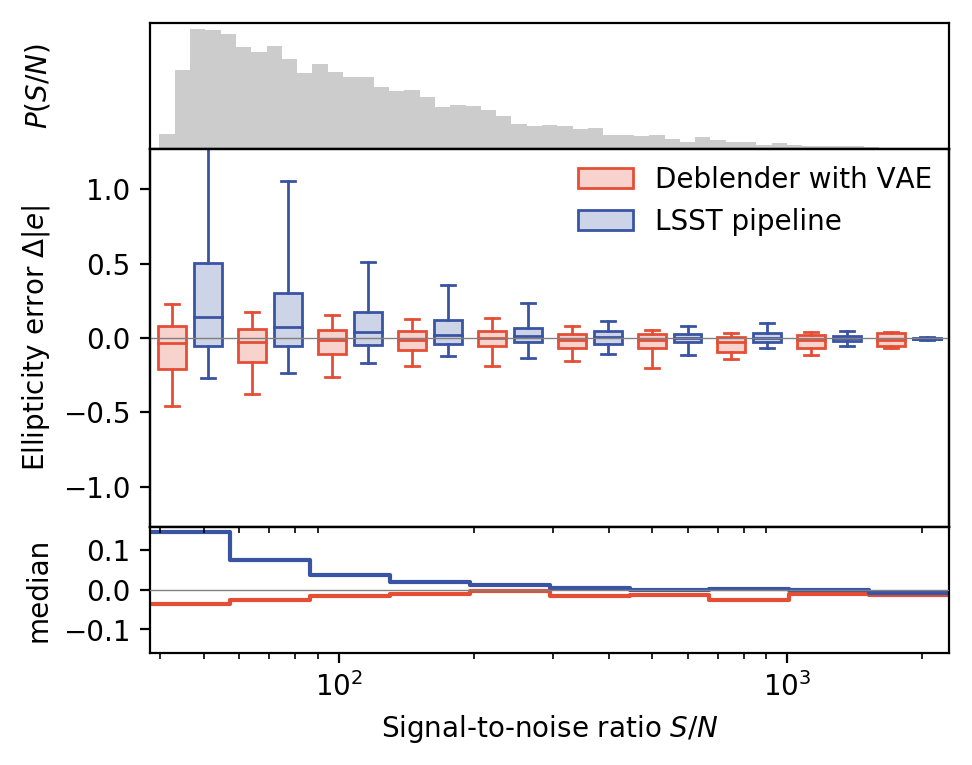

In [7]:
fig, median_shear, q1_shear, q3_shear, whislo_shear, whishi_shear = boxplot.boxplot_func(df_plot, x = 'snr_r', y = 'e_error_reg', z = 'exp',
              xlim = (38, 2300),
              ylim = (-1.27, 1.27),
              ylim2= (-0.158, 0.158),
              x_scale = 'log',
              legend = ['Deblender with VAE', 'LSST pipeline'],
              x_label='Signal-to-noise ratio $S/N$', 
              y_label = 'Ellipticity error $\\Delta |e|$',
              y_label_hist='$P(S/N)$',
              y_label_2 = 'median',
              legend_remove = False,
              palette=mpl.cm.RdYlBu([0.15, 0.95]),
              nbins = 10)

fig.savefig('imgs/e_snr_dc2_hsm.pdf')

In [8]:
df_stat = pd.DataFrame()
df_stat['median_shear'] = np.abs(median_shear)
df_stat['q1_shear'] = np.abs(q1_shear)
df_stat['q3_shear'] = np.abs(q3_shear)
df_stat['whislo_shear'] = np.abs(whislo_shear)
df_stat['whishi_shear'] = np.abs(whishi_shear)
#df_stat['median_mag'] = np.abs(median_mag)
#df_stat['q1_mag'] = np.abs(q1_mag)
#df_stat['q3_mag'] = np.abs(q3_mag)
#df_stat['whislo_mag'] = np.abs(whislo_mag)
#df_stat['whishi_mag'] = np.abs(whishi_mag)
df_stat['stats_names'] = ['network']*10 + ['pipeline']*10

x = 10

In [9]:
param = 'median_shear'
print('mean for each exp: '+str([np.mean(df_stat[param][:x]), np.mean(df_stat[param][10:10+x])]))
print('improvement between each exp: '+str([np.mean(df_stat[param][10:10+x])/np.mean(df_stat[param][:+x]) ]))

mean for each exp: [0.017158234892585444, 0.029980958430825155]
improvement between each exp: [1.747321832257977]


19772
[2 3]
0 2
1 3


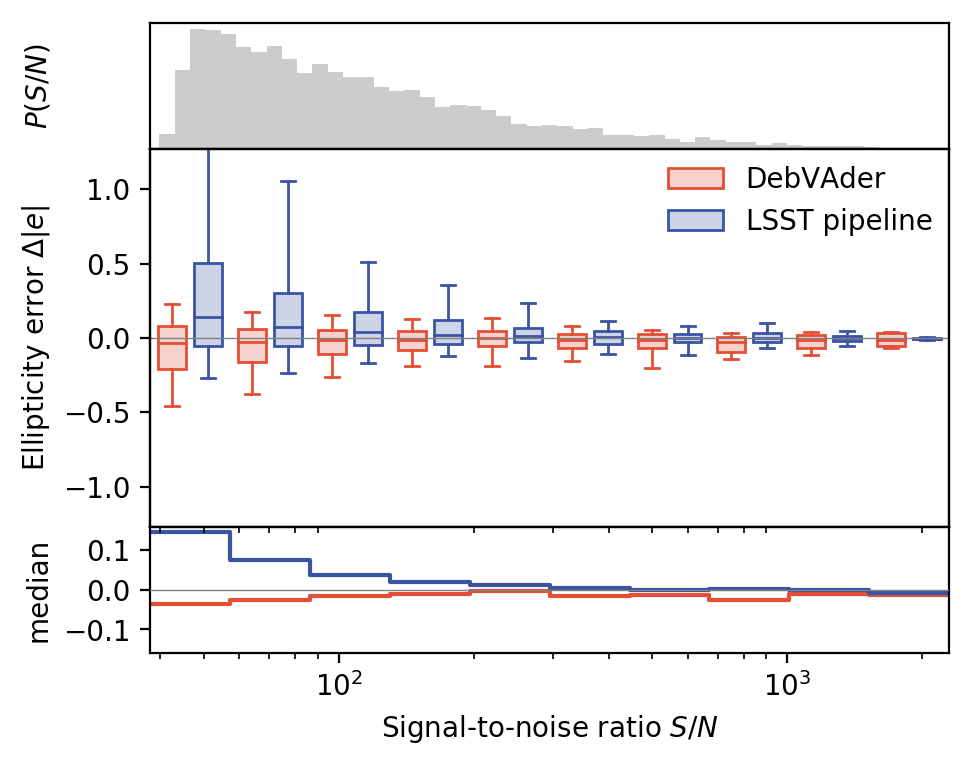

In [28]:
fig, median_shear, q1_shear, q3_shear, whislo_shear, whishi_shear = boxplot.boxplot_func(df_plot, x = 'snr_r', y = 'e_error_reg', z = 'exp',
              xlim = (38, 2300),
              ylim = (-1.27, 1.27),
              ylim2= (-0.158, 0.158),
              x_scale = 'log',
              legend = ['DebVAder', 'LSST pipeline'],
              x_label='Signal-to-noise ratio $S/N$', 
              y_label = 'Ellipticity error $\\Delta |e|$',
              y_label_hist='$P(S/N)$',
              y_label_2 = 'median',
              legend_remove = False,
              palette=mpl.cm.RdYlBu([0.15, 0.95]),
              nbins = 10)

fig.savefig('imgs/e_snr_dc2_hsm_vader.pdf')

In [7]:
df_plot_2 = df_plot[df_plot['blendedness']>0]

15982
[2 3]
0 2
1 3


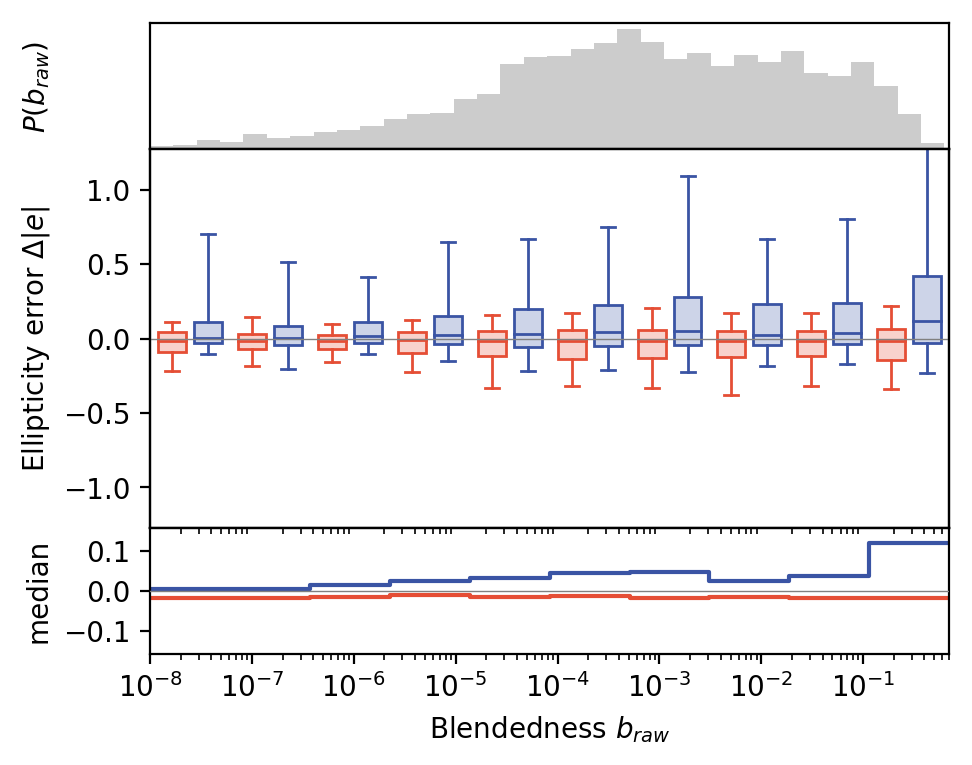

In [8]:
fig, median_shear, q1_shear, q3_shear, whislo_shear, whishi_shear = boxplot.boxplot_func(df_plot_2, x = 'blendedness', y = 'e_error_reg', z = 'exp',
              xlim = (1e-8, 0.7),
              ylim = (-1.27, 1.27),
              ylim2= (-0.158, 0.158),
              x_scale = 'log',
              legend = ['Deblender with VAE', 'LSST pipeline'],
              x_label='Blendedness $b_{raw}$', 
              y_label = 'Ellipticity error $\\Delta |e|$',
              y_label_hist='$P(b_{raw})$',
              y_label_2 = 'median',
              legend_remove = True,
              palette=mpl.cm.RdYlBu([0.15, 0.95]),
              nbins = 10)

fig.savefig('imgs/e_blend_dc2_hsm_v1.pdf')

In [12]:
df_stat = pd.DataFrame()
df_stat['median_shear'] = np.abs(median_shear)
df_stat['q1_shear'] = np.abs(q1_shear)
df_stat['q3_shear'] = np.abs(q3_shear)
df_stat['whislo_shear'] = np.abs(whislo_shear)
df_stat['whishi_shear'] = np.abs(whishi_shear)
#df_stat['median_mag'] = np.abs(median_mag)
#df_stat['q1_mag'] = np.abs(q1_mag)
#df_stat['q3_mag'] = np.abs(q3_mag)
#df_stat['whislo_mag'] = np.abs(whislo_mag)
#df_stat['whishi_mag'] = np.abs(whishi_mag)
df_stat['stats_names'] = ['network']*10 + ['pipeline']*10

x = 10

In [13]:
param = 'median_shear'
print('mean for each exp: '+str([np.mean(df_stat[param][:x]), np.mean(df_stat[param][10:10+x])]))
print('improvement between each exp: '+str([np.mean(df_stat[param][10:10+x])/np.mean(df_stat[param][:+x]) ]))

mean for each exp: [0.016173383552771852, 0.03528717174668611]
improvement between each exp: [2.181805163498918]


In [42]:
df_plot_3 = df_plot_2[(np.abs(df_plot_2['e1_hsm_regauss'])<=1.) & (np.abs(df_plot_2['e1_hsm_regauss'])<=1.)]

15720
[2 3]
0 2
1 3


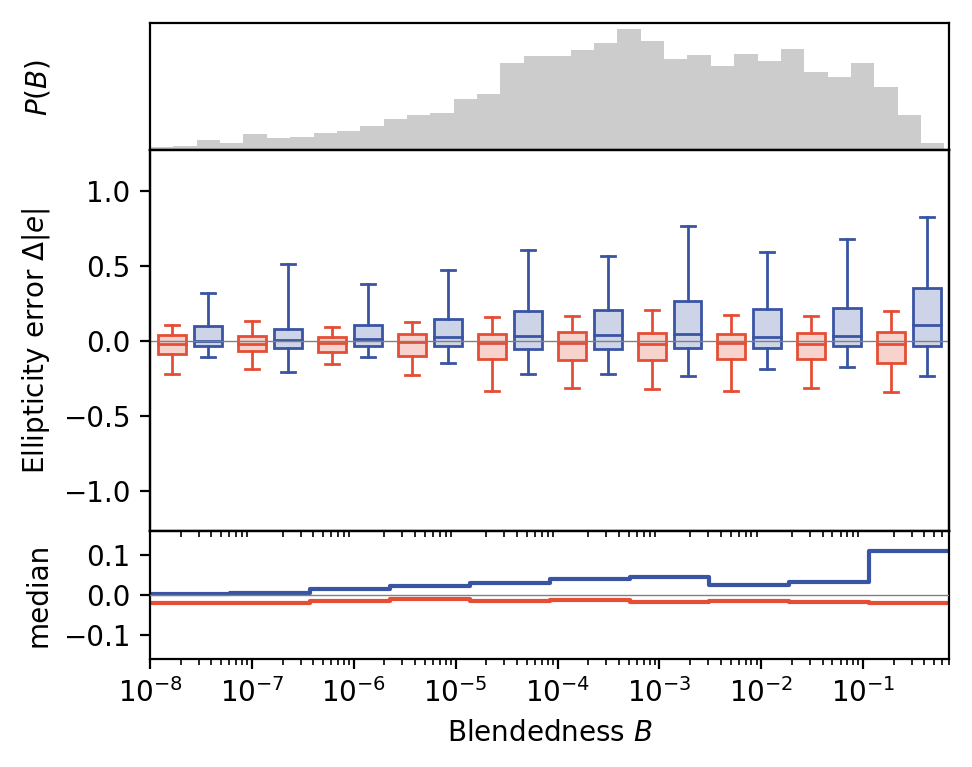

In [43]:
fig, median_shear, q1_shear, q3_shear, whislo_shear, whishi_shear = boxplot.boxplot_func(df_plot_3, x = 'blendedness', y = 'e_error_reg', z = 'exp',
              xlim = (1e-8, 0.7),
              ylim = (-1.27, 1.27),
              ylim2= (-0.158, 0.158),
              x_scale = 'log',
              legend = ['Deblender with VAE', 'LSST pipeline'],
              x_label='Blendedness $B$', 
              y_label = 'Ellipticity error $\\Delta |e|$',
              y_label_hist='$P(B)$',
              y_label_2 = 'median',
              legend_remove = True,
              palette=mpl.cm.RdYlBu([0.15, 0.95]),
              nbins = 10)

#fig.savefig('imgs/e_blend_dc2_hsm.pdf')

# Bias

In [43]:
df_bias = pd.DataFrame()
param = 'SNR'
#df_test = df_lsst_euclid[(df_lsst_euclid['e1_out']<=1.) & (df_lsst_euclid['e2_out']<=1.)]

bins = np.geomspace(30, 5000, 10)
#bins = np.linspace(0.1, 1, 10)

for k in range (2):
    slope = []
    intercept = []
    std_err = []
    bins_list = []

    bining_temp = 10
    mask = ~np.isnan(df_lsst['e_in']) & ~np.isnan(df_lsst['e_out'])
    for i, bining in enumerate (bins):
        
        df_test = df_lsst[(df_lsst['e1_out']<=1.) & 
                          (df_lsst['e2_out']<=1.) &
                          (df_lsst['e_out']>=0.) & 
                          (df_lsst['e_out']<=1.) &
                          (bining_temp <= df_lsst[param]) &
                          (df_lsst[param]<= bining)]
        #print(i,stats.linregress(df_test['e'+str(k+1)+'_in'][mask], df_test['e'+str(k+1)+'_out'][mask])[0], stats.linregress(df_test['e'+str(k+1)+'_in'][mask], df_test['e'+str(k+1)+'_out'][mask])[4])
        slope.append(stats.linregress(df_test['e'+str(k+1)+'_in'][mask], df_test['e'+str(k+1)+'_out'][mask])[0]-1)
        intercept.append(stats.linregress(df_test['e'+str(k+1)+'_in'][mask], df_test['e'+str(k+1)+'_out'][mask])[1])
        std_err.append(stats.linregress(df_test['e'+str(k+1)+'_in'][mask], df_test['e'+str(k+1)+'_out'][mask])[4])
        
        bins_list.append(bining)
        bining_temp = bining

    bining_temp = 10
    mask = ~np.isnan(df_lsst_euclid['e_in']) & ~np.isnan(df_lsst_euclid['e_out'])
    for i, bining in enumerate (bins):
        df_test = df_lsst_euclid[(df_lsst_euclid['e1_out']<=1.) & 
                                 (df_lsst_euclid['e2_out']<=1.) &
                                 (df_lsst_euclid['e_out']>=0.) & 
                                 (df_lsst_euclid['e_out']<=1.) &
                                 (bining_temp <= df_lsst_euclid[param]) &
                                 (df_lsst_euclid[param]<= bining)]
        print(i,bining, bining_temp,stats.linregress(df_test['e'+str(k+1)+'_in'][mask], df_test['e'+str(k+1)+'_out'][mask])[0], stats.linregress(df_test['e'+str(k+1)+'_in'][mask], df_test['e'+str(k+1)+'_out'][mask])[4])
        slope.append(stats.linregress(df_test['e'+str(k+1)+'_in'][mask], df_test['e'+str(k+1)+'_out'][mask])[0]-1)
        intercept.append(stats.linregress(df_test['e'+str(k+1)+'_in'][mask], df_test['e'+str(k+1)+'_out'][mask])[1])
        std_err.append(stats.linregress(df_test['e'+str(k+1)+'_in'][mask], df_test['e'+str(k+1)+'_out'][mask])[4])
        
        bins_list.append(bining)
        bining_temp = bining

    df_bias['slope_e'+str(k+1)] = np.array(slope)
    df_bias['intercept_e'+str(k+1)] = np.array(intercept)
    df_bias['std_err_e'+str(k+1)] = np.array(std_err)

0 29.999999999999996 10 0.9663673005593114 0.006110140676821552
1 52.96553190237298 29.999999999999996 0.9793882492174597 0.0038619524439441693
2 93.51158565670963 52.96553190237298 0.9708076645083241 0.003431740232955804
3 165.09636244473137 93.51158565670963 0.962515667692426 0.0030516372393691775
4 291.4805550677383 165.09636244473137 0.9935213931432251 0.002955096897791645
5 514.6140879453891 291.4805550677383 0.9945833065656204 0.003961615380554518
6 908.5602964160698 514.6140879453891 1.017603311871708 0.0037827001784083198
7 1604.079312168491 908.5602964160698 1.006992970459407 0.008861419702969851
8 2832.0304660865595 1604.079312168491 0.9586733803567036 0.01272088511370547
9 4999.999999999999 2832.0304660865595 1.0073726342807654 0.01392690657636181
0 29.999999999999996 10 0.9443610633059918 0.007111108094376257
1 52.96553190237298 29.999999999999996 0.9583468929578755 0.004002145182608144
2 93.51158565670963 52.96553190237298 0.9726701073897499 0.0030844889770577388
3 165.096

In [44]:
list_mid_bins = []
idx_temp = 10
for i, idx in enumerate (bins_list):
    if i == 10:
        idx_temp = 10
    list_mid_bins.append(idx - (idx - idx_temp)/2)
    idx_temp = idx

In [45]:
df_bias['Experience'] = len(bins)*['LSST'] + len(bins)*['LSST+Euclid']
df_bias['bins_list'] = np.array(list_mid_bins)
df_bias['mean_g'] = np.mean([df_bias['slope_e1'],df_bias['slope_e2']], axis = 0)
df_bias['mean_stderr'] = np.mean([df_bias['std_err_e1'],df_bias['std_err_e2']], axis = 0)

In [46]:
df_bias

,slope_e1,intercept_e1,std_err_e1,slope_e2,intercept_e2,std_err_e2,Experience,bins_list,mean_g,mean_stderr
0,-0.132184,-0.004353,0.011583,-0.129348,-0.006995,0.012116,LSST,20.000000,-0.130766,0.011850
1,-0.110204,-0.000431,0.006789,-0.095920,-0.003611,0.006849,LSST,41.482766,-0.103062,0.006819
2,-0.070462,-0.000144,0.004859,-0.075011,-0.001857,0.004480,LSST,73.238559,-0.072736,0.004670
3,-0.036540,0.001889,0.004490,-0.026960,0.000010,0.004399,LSST,129.303974,-0.031750,0.004445
4,-0.017812,0.001772,0.004124,-0.014583,-0.001290,0.004135,LSST,228.288459,-0.016197,0.004129
5,-0.008436,0.006672,0.004541,-0.006581,0.000501,0.004540,LSST,403.047322,-0.007509,0.004540
6,0.009908,0.003770,0.004505,0.021617,0.000361,0.004195,LSST,711.587192,0.015762,0.004350
7,-0.001872,-0.000551,0.009861,0.042254,-0.001629,0.009012,LSST,1256.319804,0.020191,0.009437
8,0.001923,0.001717,0.012432,-0.015748,-0.001681,0.012152,LSST,2218.054889,-0.006912,0.012292
9,0.027423,-0.007128,0.011454,0.002261,0.005282,0.011015,LSST,3916.015233,0.014842,0.011235


["['LSST $|g_1|$', 'LSST+Euclid $|g_1|$']", 'Experience', 'LSST', 'LSST+Euclid']
["['LSST $|g_2|$', 'LSST+Euclid $|g_2|$']", 'Experience', 'LSST', 'LSST+Euclid']
['Experience', 'LSST', 'LSST+Euclid']


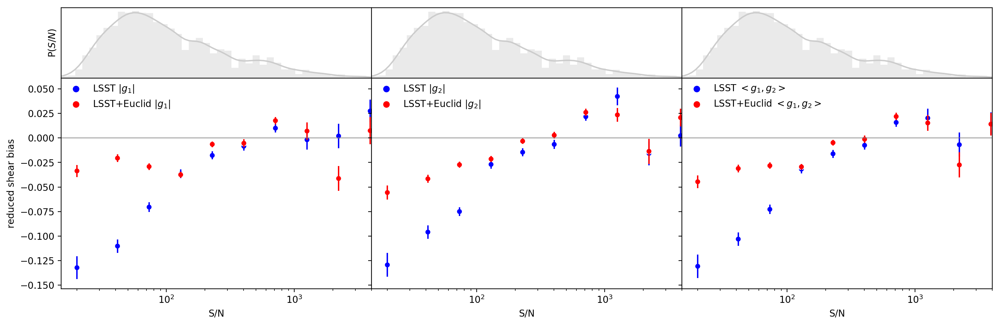

In [47]:
fig, axes = plt.subplots(2, 3, figsize=(15,5),sharey='row', gridspec_kw={'height_ratios': [1, 3]})

palette_lsst = ['blue']
palette_lsst_euclid = ['red']

xlim = (15,4000)
xscale = 'log'

for i in range (3):
    sns.distplot(np.log10(df_lsst[param]), ax=axes[0,i], color='0.8')
    axes[0,i].set_xlim(np.log10(xlim[0]), np.log10(xlim[1]))
axes[0,0].set_ylabel('P($S/N$)')
axes[0,0].set_yticks([])

for k in range (2):
    handles = []
    legend = []

    axis = axes[1,k]
    ax = sns.scatterplot(x="bins_list",
                  y="slope_e"+str(k+1), 
                  hue="Experience",
                  data=df_bias, 
                  markers = '.',
                  palette = [palette_lsst[0], palette_lsst_euclid[0]],
                  label = ['LSST $|g_'+str(k+1)+'|$','LSST+Euclid $|g_'+str(k+1)+'|$'],
                  ax = axis)
    print(ax.get_legend_handles_labels()[1])

    handles.append(ax.get_legend_handles_labels()[0][2])
    handles.append(ax.get_legend_handles_labels()[0][3])
    legend.append('LSST $|g_'+str(k+1)+'|$')
    legend.append('LSST+Euclid $|g_'+str(k+1)+'|$')
    # Find the x,y coordinates for each point
    x_coords = []
    y_coords = []

    for i, idx in enumerate (df_bias['bins_list']):
        x_coords.append(idx)
        y_coords.append(df_bias["slope_e"+str(k+1)][i])

    colors = [palette_lsst[0]]*int(len(df_bias['bins_list'])/2) + [palette_lsst_euclid[0]]*int(len(df_bias['bins_list'])/2)

    axis.errorbar(x_coords, 
                 y_coords, 
                 yerr=df_bias['std_err_e'+str(k+1)],
                 ecolor=colors,
                 fmt=' ')


    axis.legend(handles, legend, frameon=False, loc ='upper left', borderpad = 0.1, fontsize = 10)
    axis.set_xlabel('S/N')
    axis.set_ylabel('reduced shear bias')
    axis.axhline(0,color = 'grey', alpha = 0.5)
    axis.set_xscale(xscale)
    axis.set_xlim(xlim)

 

handles = []
legend = []

axis = axes[1,2]
ax = sns.scatterplot(x="bins_list",
              y="mean_g", 
              hue="Experience",
              data=df_bias, 
              markers = '.',
              palette = [palette_lsst[0], palette_lsst_euclid[0]],
              #label = ['LSST $|g_'+str(k+1)+'|$','LSST+Euclid $|g_'+str(k+1)+'|$'],
              ax = axis)
print(ax.get_legend_handles_labels()[1])

handles.append(ax.get_legend_handles_labels()[0][1])
handles.append(ax.get_legend_handles_labels()[0][2])
legend.append('LSST $<g_1, g_2>$')
legend.append('LSST+Euclid $<g_1, g_2>$')
# Find the x,y coordinates for each point
x_coords = []
y_coords = []

for i, idx in enumerate (df_bias['bins_list']):
    x_coords.append(idx)
    y_coords.append(df_bias["mean_g"][i])

colors = [palette_lsst[0]]*int(len(df_bias['bins_list'])/2) + [palette_lsst_euclid[0]]*int(len(df_bias['bins_list'])/2)

axis.errorbar(x_coords, 
             y_coords, 
             yerr=df_bias['mean_stderr'],
             ecolor=colors,
             fmt=' ')


axis.legend(handles, legend, frameon=False, loc ='upper left', borderpad = 0.1, fontsize = 10)#, colors = ['steelblue','coral','blue','red'])
axis.set_xlabel('S/N')
axis.axhline(0, color = 'grey', alpha = 0.5)
axis.set_xscale(xscale)
axis.set_xlim(xlim)

plt.tight_layout()
plt.subplots_adjust(wspace=0, hspace=0)

# test real data

In [11]:
data_dir = '/sps/lsst/users/barcelin/data/blended_galaxies/27.5/real/test/'
root = 'galaxies_blended_20191024'

In [12]:
shifts = np.load(os.path.join(data_dir, root+'_0_shifts.npy'))
images = np.load(data_dir+'galaxies_blended_20191024_0_images.npy', mmap_mode = 'c')
test_sample = [data_dir+'galaxies_blended_20191024_0_images.npy']

In [9]:
images.shape

(10000, 2, 10, 64, 64)

In [10]:
dfs = []

#dfs.append(pd.read_csv(os.path.join(data_dir, root+'_010_data.csv')))
dfs.append(pd.read_csv(os.path.join(data_dir, root+'_0_data.csv')))
df = dfs[0]

for df2 in dfs[1:]:
    df = df.append(df2)

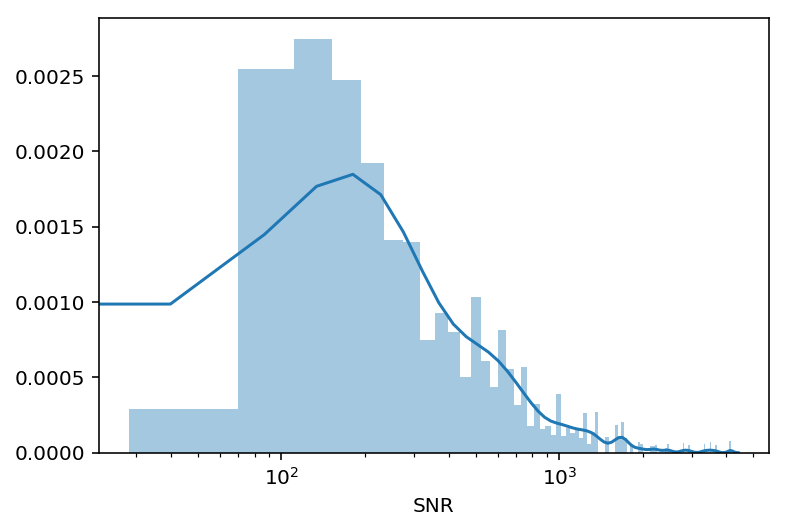

In [11]:
sns.distplot(df["SNR"], bins = 100)
plt.xscale('log')

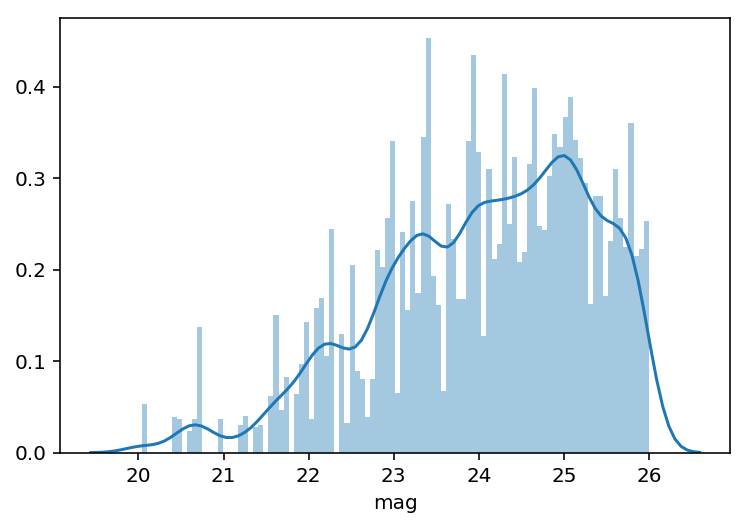

In [24]:
sns.distplot(df['mag'], bins = 100)

In [12]:
reload(results_processing)

<module 'tools_for_VAE.results_processing' from '../../scripts/tools_for_VAE/tools_for_VAE/results_processing.py'>

In [15]:
df_lsst_euclid_real = results_processing.processing(deblender_lsst_euclid,
                                             data_dir,                                           
                                             root,
                                              test_sample[0],
                                              bands_lsst_euclid,
                                              6,
                                              stamp_size,
                                              batch_size,
                                              psf,
                                              pix_scale_lsst,
                                              mag_cut)

error for galaxy 3282
error for galaxy 12033
error for galaxy 14874
error for galaxy 15694
error for galaxy 34048

(10000, 2, 2)


In [143]:
len(df_lsst_euclid_real)

10000

In [16]:
df_lsst_euclid_real.to_csv('data_v2/df_deb_centered_lsst_euclid_real_26.csv')

In [13]:
df_lsst_euclid_real = pd.read_csv('data_v2/df_deb_centered_lsst_euclid_real_26.csv', encoding = 'utf-8')

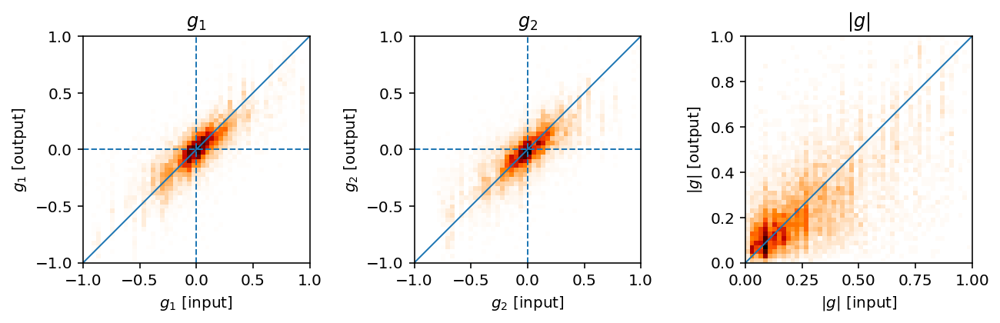

In [17]:
fig = plt.figure(figsize=(12,5))



emax = 1
bins = np.linspace(-emax,+emax,51)

ax = fig.add_subplot(141, aspect='equal')
_ = ax.hist2d(df_lsst_euclid_real['e1_in'], df_lsst_euclid_real['e1_out'], bins=bins, cmap=mpl.cm.gist_heat_r)
ax.plot([-emax,+emax],[-emax,+emax], lw=1)
ax.axhline(y=0, ls='--', lw=1)
ax.axvline(x=0, ls='--', lw=1)
ax.set_xlabel('$g_1$ [input]')
ax.set_ylabel('$g_1$ [output]')
ax.set_title('$g_1$')

ax = fig.add_subplot(142, aspect='equal')
_ = ax.hist2d(df_lsst_euclid_real['e2_in'], df_lsst_euclid_real['e2_out'], bins=bins, cmap=mpl.cm.gist_heat_r)
ax.plot([-emax,+emax],[-emax,+emax], lw=1)
ax.axhline(y=0, ls='--', lw=1)
ax.axvline(x=0, ls='--', lw=1)
ax.set_xlabel('$g_2$ [input]')
ax.set_ylabel('$g_2$ [output]')
ax.set_title('$g_2$')

ax = fig.add_subplot(143, aspect='equal')
_ = ax.hist2d(df_lsst_euclid_real['e_in'], df_lsst_euclid_real['e_out'], bins=np.linspace(0,1,51), cmap=mpl.cm.gist_heat_r)
#_ = ax.hist2d(df_plot['e_in'],df_plot['e_out'], bins=np.linspace(0,1,51), cmap=mpl.cm.gist_heat_r)
ax.plot([0,1],[0,1], lw=1)
ax.set_xlabel('$|g|$ [input]')
ax.set_ylabel('$|g|$ [output]')
ax.set_title('$|g|$')

plt.tight_layout()

Text(0.5, 1.0, 'Magnitude')

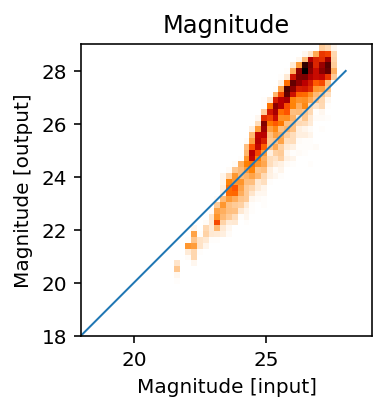

In [18]:
fig = plt.figure(figsize=(12,5))



emax = 28
bins = np.linspace(18,29,51)

ax = fig.add_subplot(141, aspect='equal')
_ = ax.hist2d(df_lsst_euclid_real['mag_in'], df_lsst_euclid_real['mag_out'], bins=bins, cmap=mpl.cm.gist_heat_r)
ax.plot([-emax,+emax],[-emax,+emax], lw=1)
ax.axhline(y=0, ls='--', lw=1)
ax.axvline(x=0, ls='--', lw=1)
ax.set_xlabel('Magnitude [input]')
ax.set_ylabel('Magnitude [output]')
ax.set_title('Magnitude')


In [19]:
bands_lsst_euclid = [0,1,2,3,4,5,6,7,8,9]

N_plot = 9

indices = np.random.choice(10000, size=N_plot*N_plot, replace=False)

input_lsst = images[indices]
input_noisy = norm(input_lsst[:,1].transpose([0,2,3,1]), bands_lsst_euclid, channel_last = True, path = os.path.join(data_dir, ""))
input_noiseless = norm(input_lsst[:,0].transpose([0,2,3,1]), bands_lsst_euclid, channel_last = True,path = os.path.join(data_dir, ""))

In [20]:
output_deblender_lsst_euclid = deblender_lsst_euclid.predict(input_noisy, batch_size = 100)

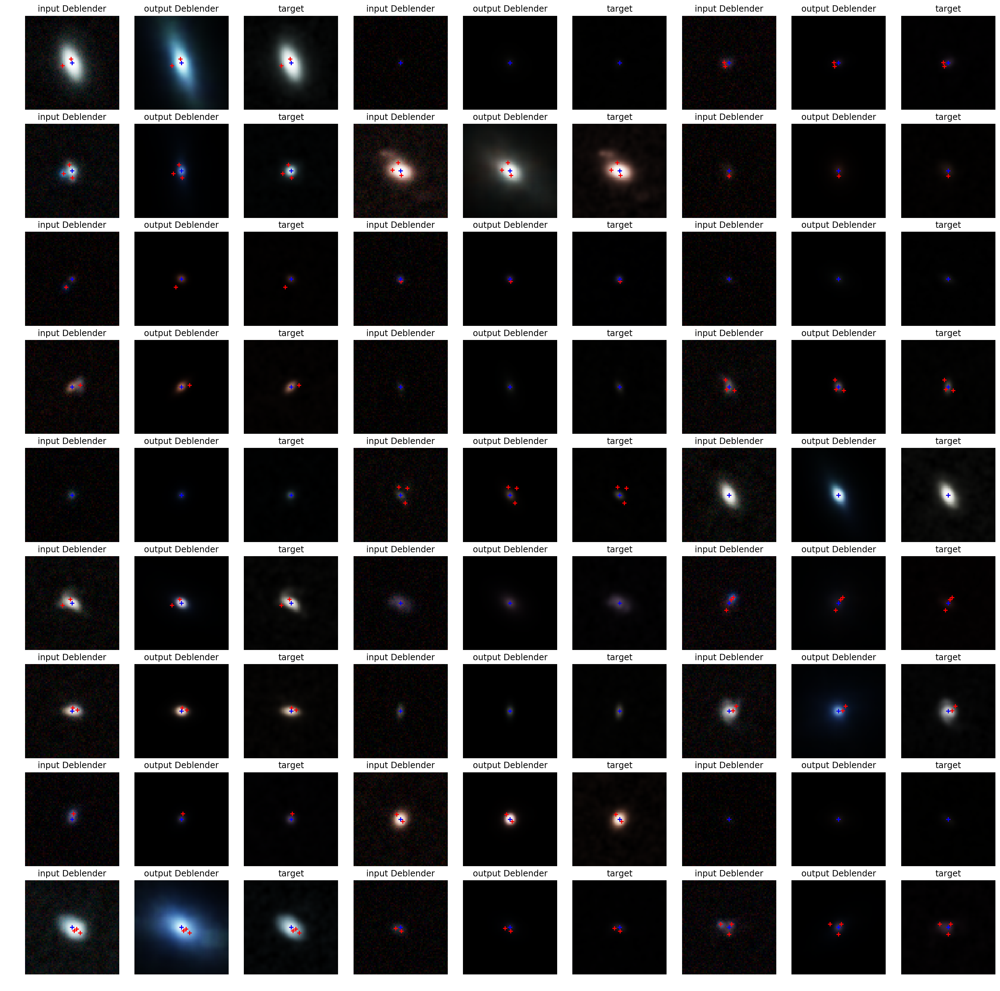

In [21]:
fig, axes = plt.subplots(N_plot, N_plot, figsize=(25, 25))
fig.subplots_adjust(wspace=.01, hspace=.15)

k = 0

for i in range(N_plot):
    for j in range(0,N_plot,3):
        
        plot.plot_rgb(input_noisy[k], bands = [5,6,7],ax= axes[i,j], band_first= False,zoom = 1, shifts = shifts[indices[k]]/pixel_scale_lsst)
        plot.plot_rgb(output_deblender_lsst_euclid[k], bands = [5,6,7],ax= axes[i,j+1], band_first = False,zoom = 1, shifts = shifts[indices[k]]/pixel_scale_lsst)
        plot.plot_rgb(input_noiseless[k], bands = [5,6,7],ax= axes[i,j+2], band_first = False,zoom = 1, shifts = shifts[indices[k]]/pixel_scale_lsst)

        axes[i,j].axis('off')
        axes[i,j].set_title('input Deblender')
        axes[i,j+1].axis('off')
        axes[i,j+1].set_title('output Deblender')
        axes[i,j+2].axis('off')
        axes[i,j+2].set_title('target')
        
        k+=1

In [20]:
df_lsst_euclid_real

,nb_blended_gal,SNR,SNR_peak,redshift,moment_sigma,e1,e2,mag,mag_ir,closest_x,...,e_out,e_error,e_in_obs,e_out_obs,e_obs_error,flux_in,flux_out,mag_in,mag_out,delta_mag
0,1,70.296780,0.070266,0.9712,2.480810,-0.154759,-0.162193,25.834956,-2.955935,NaN,...,0.175422,0.012853,0.150398,0.202100,0.051701,1.983250e+05,2.960185e+04,25.776137,27.841284,2.065147
1,2,117.155698,0.128851,0.1570,2.064454,0.485664,0.486081,25.606539,-1.112594,0.653145,...,0.590520,-0.058682,0.435441,0.374947,-0.060494,2.447927e+05,2.899291e+04,25.547585,27.863852,2.316267
2,1,53.315116,0.052067,1.4456,2.295501,0.303336,0.357409,26.376312,-1.910041,NaN,...,0.066154,0.041346,0.049149,0.077728,0.028578,1.204718e+05,1.718860e+04,26.317367,28.431480,2.114113
3,3,70.618270,0.087444,2.2068,1.743131,-0.005745,-0.261933,26.351844,-1.820577,-0.198290,...,0.418291,0.402762,0.030818,0.595314,0.564496,1.232193e+05,5.181001e+04,26.292884,27.233547,0.940663
4,4,757.235210,0.837481,0.3896,2.728459,0.251647,-0.252465,22.800808,-4.792367,-0.398506,...,0.528068,0.153483,0.356486,0.698304,0.341817,3.191193e+06,6.235220e+06,22.759698,22.032452,-0.727247
5,2,76.986001,0.079294,0.1309,2.116907,0.239107,-0.151163,26.077317,-0.626662,-0.664178,...,0.237820,-0.097285,0.299204,0.261197,-0.038007,1.586676e+05,2.437223e+04,26.018361,28.052343,2.033983
6,4,86.839915,0.089073,0.7537,2.216700,-0.639439,0.482078,25.838839,-1.847700,0.576506,...,0.454195,-0.402156,0.510342,0.355894,-0.154448,1.976390e+05,3.236096e+04,25.779899,27.744528,1.964629
7,3,68.123626,0.072257,0.6320,2.046105,-0.211709,-0.145254,26.244856,-1.171307,-0.739657,...,0.234393,-0.064539,0.248800,0.319061,0.070261,1.359789e+05,3.386113e+04,26.185902,27.695328,1.509425
8,1,37.582003,0.046008,0.8314,1.718295,0.499275,-0.074443,27.064646,-0.766282,NaN,...,0.268467,0.251902,0.032885,0.251574,0.218689,6.390837e+04,2.009556e+04,27.005686,28.261829,1.256143
9,1,39.609570,0.045462,0.7124,1.909215,-0.049684,-0.201456,26.871710,-1.114264,NaN,...,0.080361,-0.057111,0.102271,0.071180,-0.031091,7.634232e+04,2.264758e+04,26.812668,28.132027,1.319359


In [28]:
deblender_lsst_euclid_transfer,deblender_utils_lsst_euclid, encoder_lsst_euclid, decoder_lsst_euclid, Dkl = load_vae_full('/sps/lsst/users/barcelin/weights/LSST_EUCLID/deblender/v_2/v_real/bis/bis/mse/',
                                                                                            10, folder = True) #/bis/mse

W0403 14:34:05.706195 140215317120832 util.py:148] Unused attribute in object (root): ['OBJECT_CONFIG_JSON']
W0403 14:34:05.707094 140215317120832 util.py:148] Unused attribute in object (root).layer-0: ['OBJECT_CONFIG_JSON']
W0403 14:34:05.707693 140215317120832 util.py:148] Unused attribute in object (root).layer_with_weights-0: ['OBJECT_CONFIG_JSON']
W0403 14:34:05.708267 140215317120832 util.py:148] Unused attribute in object (root).layer-2: ['OBJECT_CONFIG_JSON']
W0403 14:34:05.708813 140215317120832 util.py:148] Unused attribute in object (root).layer_with_weights-1: ['OBJECT_CONFIG_JSON']
W0403 14:34:05.709382 140215317120832 util.py:148] Unused attribute in object (root).layer_with_weights-0.layer-0: ['OBJECT_CONFIG_JSON']
W0403 14:34:05.709925 140215317120832 util.py:148] Unused attribute in object (root).layer_with_weights-0.layer-1: ['OBJECT_CONFIG_JSON']
W0403 14:34:05.710488 140215317120832 util.py:148] Unused attribute in object (root).layer_with_weights-0.layer_with_weig

/sps/lsst/users/barcelin/weights/LSST_EUCLID/deblender/v_2/v_real/bis/bis/mse/


In [29]:
df_lsst_euclid_real_transfer = results_processing.processing(deblender_lsst_euclid_transfer,
                                             data_dir,                                           
                                             root,
                                              test_sample[0],
                                              bands_lsst_euclid,
                                              6,
                                              stamp_size,
                                              batch_size,
                                              psf,
                                              pix_scale_lsst,
                                              mag_cut)

error for galaxy 443
error for galaxy 4895

(10000, 2, 2)


In [14]:
df_lsst_euclid_real_transfer.to_csv('data_v2/df_deb_centered_lsst_euclid_real_transfer_26.csv')

NameError: name 'df_lsst_euclid_real_transfer' is not defined

In [15]:
df_lsst_euclid_real_transfer = pd.read_csv('data_v2/df_deb_centered_lsst_euclid_real_transfer_26.csv', encoding = 'utf-8')

In [16]:
df_plot = pd.concat([ df_lsst_euclid,df_lsst_euclid_real,df_lsst_euclid_real_transfer], ignore_index=True)

In [17]:
df_plot['exp']= 10000*['LSST+Euclid param'] + 10000*['LSST+Euclid real']+ 10000*['LSST+Euclid real w. transfer']

In [18]:
df_plot = df_plot.dropna(axis = 1, how = 'all')

df_plot = df_plot[(df_plot['e1_out']<=1.) & 
                  (df_plot['e2_out']<=1.) &
                  (df_plot['e1_out']>=-1.) & 
                  (df_plot['e2_out']>=-1.) &
                  (df_plot['e_out']>=0.) & 
                  (df_plot['e_out']<=1.) ]

In [19]:
df_plot

,Unnamed: 0,nb_blended_gal,SNR,SNR_peak,redshift,moment_sigma,e1,e2,mag,mag_ir,...,e_error,e_in_obs,e_out_obs,e_obs_error,flux_in,flux_out,mag_in,mag_out,delta_mag,exp
0,0,2,706.296227,0.596372,0.5391,3.561471,0.205845,0.019063,22.693909,-5.132814,...,0.002410,0.283781,0.289185,0.005404,3.546016e+06,3.501633e+06,22.656717,22.670391,0.013674,LSST+Euclid param
1,1,2,82.488777,0.095915,0.7654,1.969321,-0.259243,0.224808,25.928131,-3.013789,...,0.038222,0.207422,0.226748,0.019326,1.819440e+05,1.812095e+05,25.881224,25.885614,0.004391,LSST+Euclid param
2,2,3,22.480838,0.025421,0.2428,2.007041,0.195549,-0.277853,27.055186,-0.506541,...,0.251293,0.195520,0.296847,0.101327,6.129881e+04,5.817907e+04,27.062438,27.119150,0.056712,LSST+Euclid param
3,3,1,21.911913,0.023381,0.8948,2.058000,-0.551184,-0.356955,27.445184,-0.485815,...,-0.028152,0.421068,0.386047,-0.035021,4.501299e+04,4.511707e+04,27.397724,27.395214,-0.002510,LSST+Euclid param
4,4,2,892.381174,1.294469,0.3437,2.092752,0.011869,-0.167728,22.640140,-5.151480,...,0.026596,0.111708,0.117367,0.005659,3.508241e+06,3.644339e+06,22.668345,22.627020,-0.041325,LSST+Euclid param
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,9995,3,254.777419,0.308376,0.6695,2.020751,-0.246022,-0.024136,24.490509,-4.590373,...,-0.043201,0.153364,0.105841,-0.047523,6.790995e+05,9.704909e+05,26.000053,25.612408,-0.387645,LSST+Euclid real w. transfer
29996,9996,4,1609.711876,0.976740,0.3291,4.605689,-0.167910,-0.092283,21.734780,-5.103992,...,0.002635,0.327606,0.317820,-0.009786,8.658980e+06,1.383844e+07,23.236219,22.727169,-0.509050,LSST+Euclid real w. transfer
29997,9997,2,54.579883,0.036148,1.2278,4.178689,-0.057397,0.023117,25.578211,-3.088042,...,0.030930,0.031765,0.082866,0.051101,2.510435e+05,5.778858e+05,27.080514,26.175283,-0.905231,LSST+Euclid real w. transfer
29998,9998,3,252.665991,0.171951,0.3734,3.768410,-0.024544,-0.092409,24.061914,-2.829701,...,-0.035364,0.156079,0.095715,-0.060364,1.015338e+06,2.199540e+06,25.563359,24.724058,-0.839301,LSST+Euclid real w. transfer


In [31]:
df_plot = df_plot.drop('Unnamed: 0', axis = 1)

['LSST+Euclid param' 'LSST+Euclid real' 'LSST+Euclid real w. transfer']
0 LSST+Euclid param
1 LSST+Euclid real
2 LSST+Euclid real w. transfer


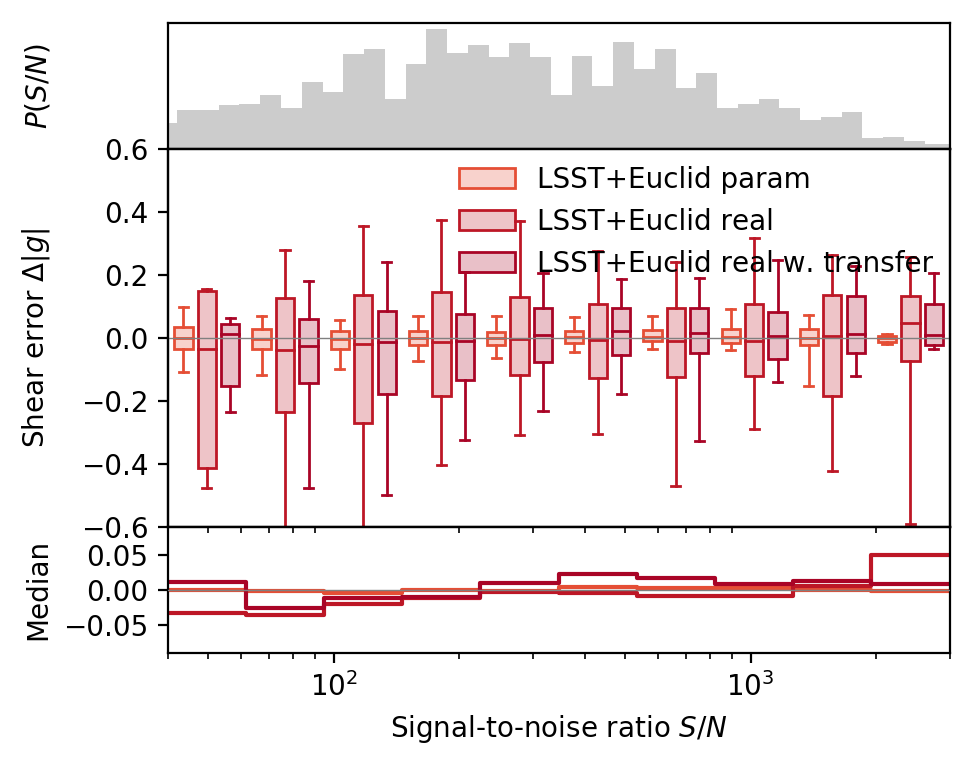

In [32]:
fig, median_shear, q1_shear, q3_shear, whislo_shear, whishi_shear = boxplot_func(df_plot, x = 'SNR', y = 'e_error', z = 'exp',
              xlim = (40, 3000),
              ylim = (-0.6, 0.6),
              ylim2= (-0.09, 0.09),
              x_scale = 'log',
              legend = ['LSST+Euclid param', 'LSST+Euclid real','LSST+Euclid real w. transfer'],
              x_label='Signal-to-noise ratio $S/N$', 
              y_label = 'Shear error $\\Delta |g|$',
              y_label_hist='$P(S/N)$',
              y_label_2 = 'Median',
              legend_remove = False,
              palette=mpl.cm.RdYlBu([0.15, 0.05, 0.01]),
              nbins = 10)

22122
['LSST+Euclid param' 'LSST+Euclid real' 'LSST+Euclid real w. transfer']
0 LSST+Euclid param
1 LSST+Euclid real
2 LSST+Euclid real w. transfer


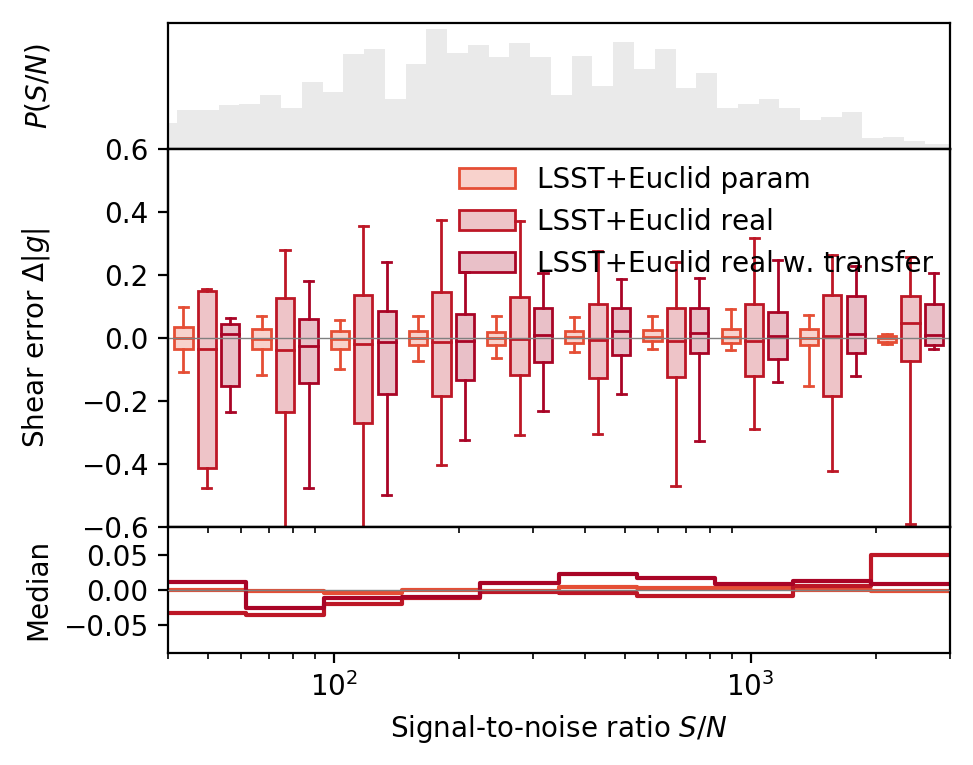

In [40]:
fig, median_shear, q1_shear, q3_shear, whislo_shear, whishi_shear = boxplot_func(df_plot, x = 'SNR', y = 'e_error', z = 'exp',
              xlim = (40, 3000),
              ylim = (-0.6, 0.6),
              ylim2= (-0.09, 0.09),
              x_scale = 'log',
              legend = ['LSST+Euclid param', 'LSST+Euclid real','LSST+Euclid real w. transfer'],
              x_label='Signal-to-noise ratio $S/N$', 
              y_label = 'Shear error $\\Delta |g|$',
              y_label_hist='$P(S/N)$',
              y_label_2 = 'Median',
              legend_remove = False,
              palette=mpl.cm.RdYlBu([0.15, 0.05, 0.01]),
              nbins = 10)

In [23]:
df_lsst_euclid_real_transfer_2 = df_lsst_euclid_real_transfer.dropna(axis = 0, how = 'all')

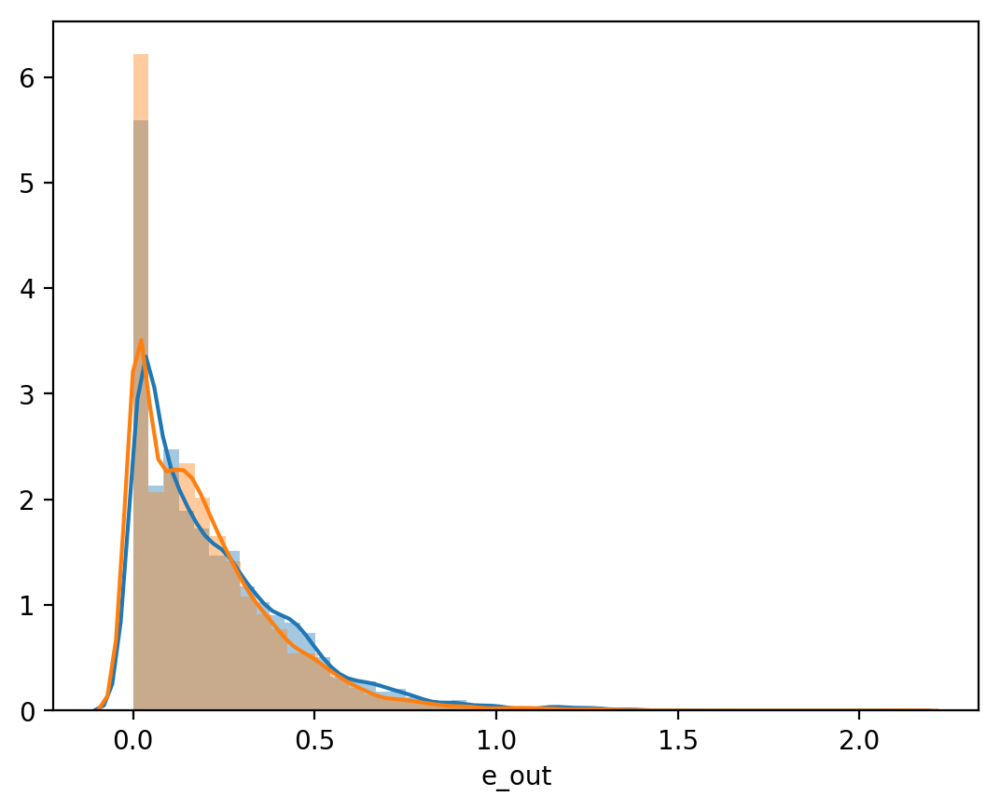

In [24]:
mask = ~np.isnan(df_lsst_euclid_real_transfer['e_in']) & ~np.isnan(df_lsst_euclid_real_transfer['e_out'])

sns.distplot(df_lsst_euclid_real_transfer['e_in'][mask])
sns.distplot(df_lsst_euclid_real_transfer['e_out'][mask])

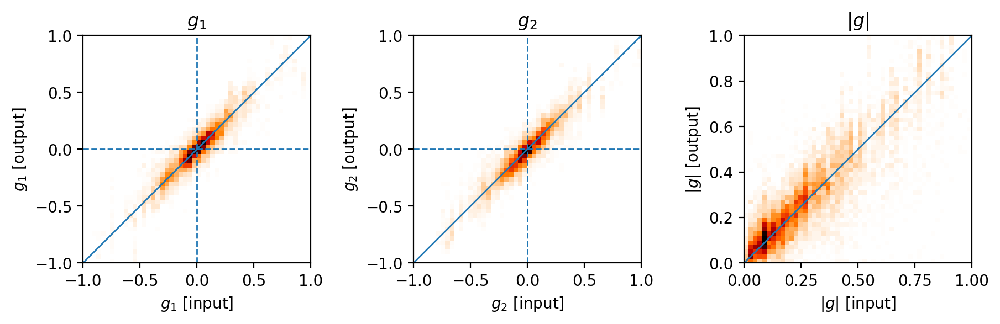

In [41]:
fig = plt.figure(figsize=(12,5))



emax = 1
bins = np.linspace(-emax,+emax,51)

ax = fig.add_subplot(141, aspect='equal')
_ = ax.hist2d(df_lsst_euclid_real_transfer['e1_in'], df_lsst_euclid_real_transfer['e1_out'], bins=bins, cmap=mpl.cm.gist_heat_r)
ax.plot([-emax,+emax],[-emax,+emax], lw=1)
ax.axhline(y=0, ls='--', lw=1)
ax.axvline(x=0, ls='--', lw=1)
ax.set_xlabel('$g_1$ [input]')
ax.set_ylabel('$g_1$ [output]')
ax.set_title('$g_1$')

ax = fig.add_subplot(142, aspect='equal')
_ = ax.hist2d(df_lsst_euclid_real_transfer['e2_in'], df_lsst_euclid_real_transfer['e2_out'], bins=bins, cmap=mpl.cm.gist_heat_r)
ax.plot([-emax,+emax],[-emax,+emax], lw=1)
ax.axhline(y=0, ls='--', lw=1)
ax.axvline(x=0, ls='--', lw=1)
ax.set_xlabel('$g_2$ [input]')
ax.set_ylabel('$g_2$ [output]')
ax.set_title('$g_2$')

ax = fig.add_subplot(143, aspect='equal')
_ = ax.hist2d(df_lsst_euclid_real_transfer['e_in'], df_lsst_euclid_real_transfer['e_out'], bins=np.linspace(0,1,51), cmap=mpl.cm.gist_heat_r)
#_ = ax.hist2d(df_plot['e_in'],df_plot['e_out'], bins=np.linspace(0,1,51), cmap=mpl.cm.gist_heat_r)
ax.plot([0,1],[0,1], lw=1)
ax.set_xlabel('$|g|$ [input]')
ax.set_ylabel('$|g|$ [output]')
ax.set_title('$|g|$')

plt.tight_layout()

Text(0.5, 1.0, 'Magnitude')

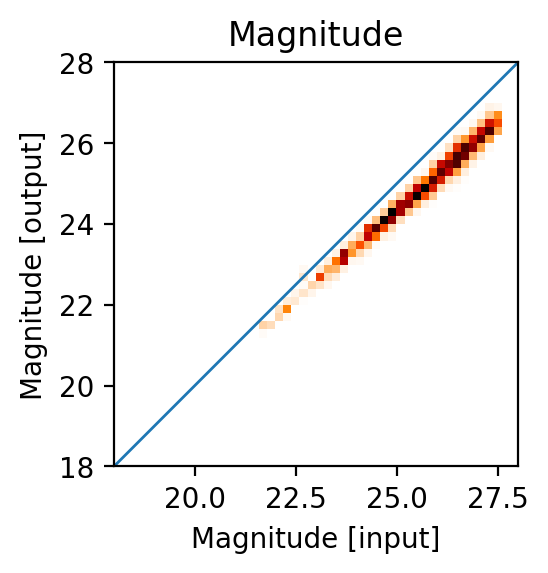

In [42]:
fig = plt.figure(figsize=(12,5))

emax = 28
bins = np.linspace(18,28,51)

ax = fig.add_subplot(141, aspect='equal')
_ = ax.hist2d(df_lsst_euclid_real_transfer['mag_in'], df_lsst_euclid_real_transfer['mag_out'], bins=bins, cmap=mpl.cm.gist_heat_r)
ax.plot([-emax,+emax],[-emax,+emax], lw=1)
ax.axhline(y=0, ls='--', lw=1)
ax.axvline(x=0, ls='--', lw=1)
ax.set_xlabel('Magnitude [input]')
ax.set_ylabel('Magnitude [output]')
ax.set_title('Magnitude')


In [51]:
N_plot = 8

bands_lsst_euclid = [0,1,2,3,4,5,6,7,8,9]

indices = np.random.choice(10000, size=N_plot*N_plot, replace=False)

input_lsst = images[indices]
input_noisy = norm(input_lsst[:,1].transpose([0,2,3,1]), bands_lsst_euclid, channel_last = True,path = os.path.join(data_dir, ""))
input_noiseless = norm(input_lsst[:,0].transpose([0,2,3,1]), bands_lsst_euclid, channel_last = True, path = os.path.join(data_dir, ""))

In [52]:
input_lsst.shape

(64, 2, 10, 64, 64)

In [53]:
output_deblender_lsst_euclid = deblender_lsst_euclid_transfer.predict(input_noisy, batch_size = 100)
output_deblender_lsst_euclid_p = deblender_lsst_euclid.predict(input_noisy, batch_size = 100)

In [54]:
df_plot = pd.concat([df_lsst_euclid_real,df_lsst_euclid_real_transfer], ignore_index=True)

df_plot['exp']= 10000*['LSST+Euclid real']+ 10000*['LSST+Euclid real w. transfer']

df_plot = df_plot.dropna(axis = 1, how = 'all')

/sps/lsst/users/barcelin/miniconda/envs/python_cpu6/lib/python3.6/site-packages/ipykernel_launcher.py:1: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  """Entry point for launching an IPython kernel.


In [55]:
len(df_plot)

20000

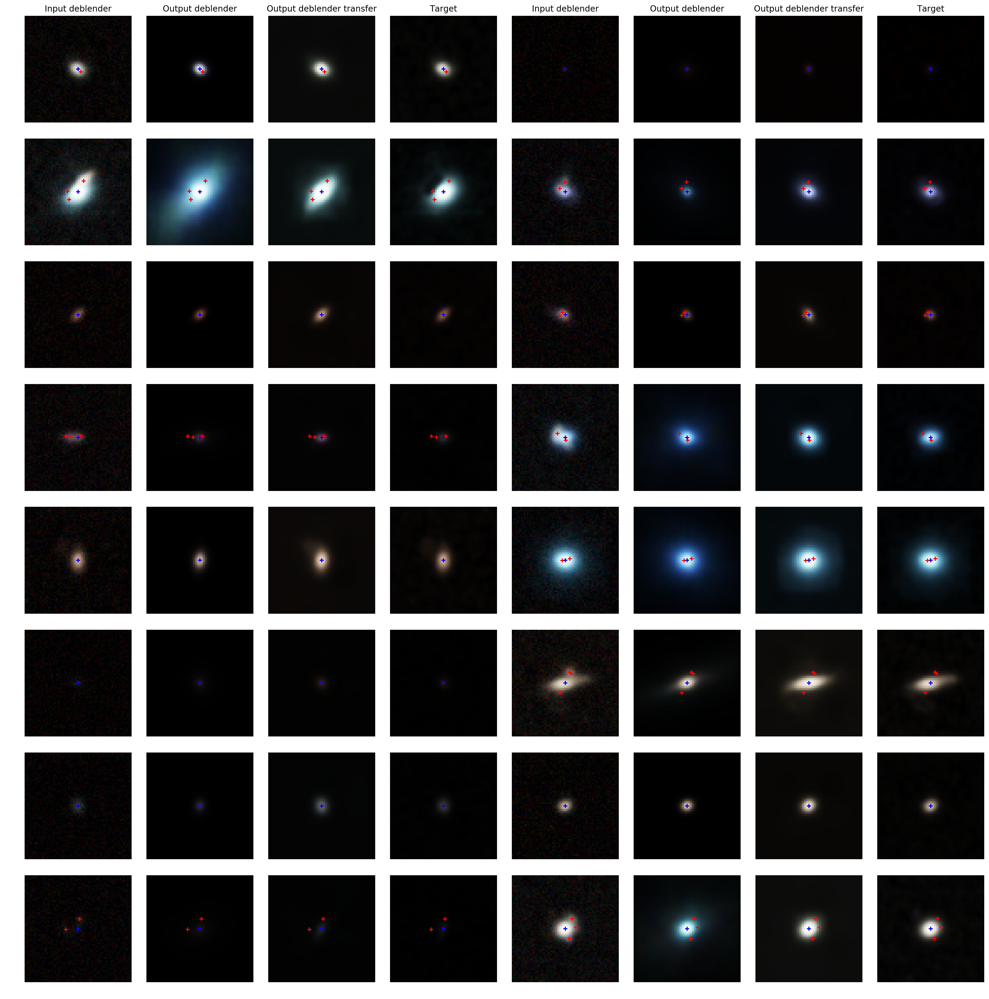

In [56]:
N_plot= 8
fig, axes = plt.subplots(N_plot, N_plot, figsize=(25, 25))
fig.subplots_adjust(wspace=.01, hspace=.15)

k = 0

for i in range(N_plot):
    for j in range(0,N_plot,4):
        
        plot.plot_rgb(input_noisy[k], bands = [5,6,7],ax= axes[i,j], band_first= False,zoom = 1, shifts = shifts[indices[k]]/pixel_scale_lsst)
        plot.plot_rgb(output_deblender_lsst_euclid_p[k], bands = [5,6,7],ax= axes[i,j+1], band_first = False,zoom = 1, shifts = shifts[indices[k]]/pixel_scale_lsst)
        plot.plot_rgb(output_deblender_lsst_euclid[k], bands = [5,6,7],ax= axes[i,j+2], band_first = False,zoom = 1, shifts = shifts[indices[k]]/pixel_scale_lsst)
        plot.plot_rgb(input_noiseless[k], bands = [5,6,7],ax= axes[i,j+3], band_first = False,zoom = 1, shifts = shifts[indices[k]]/pixel_scale_lsst)
        
        if i == 0:
            axes[i,j].set_title('Input deblender')
            axes[i,j+1].set_title('Output deblender')
            axes[i,j+2].set_title('Output deblender transfer')
            axes[i,j+3].set_title('Target')
        
        axes[i,j].axis('off')
        axes[i,j+1].axis('off')
        axes[i,j+2].axis('off')
        axes[i,j+3].axis('off')
       
        
        k+=1

In [26]:
len(input_noisy)

64

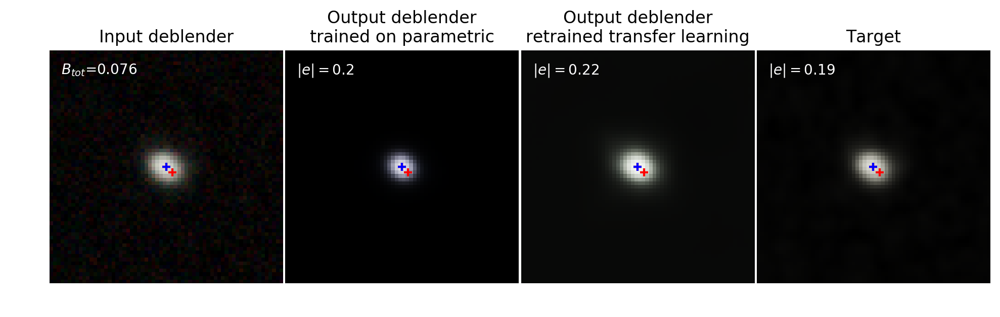

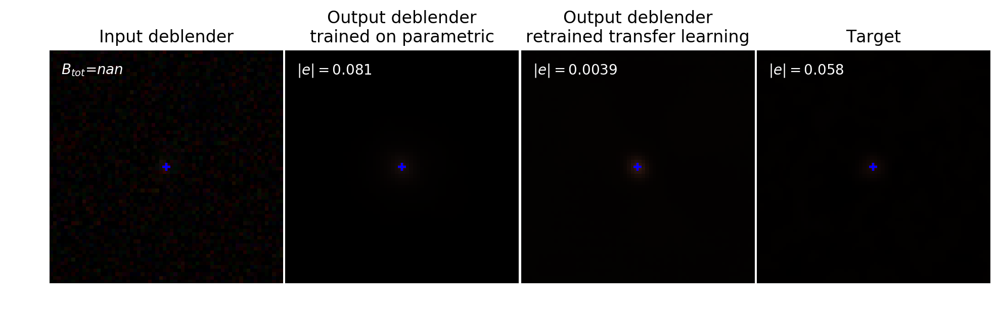

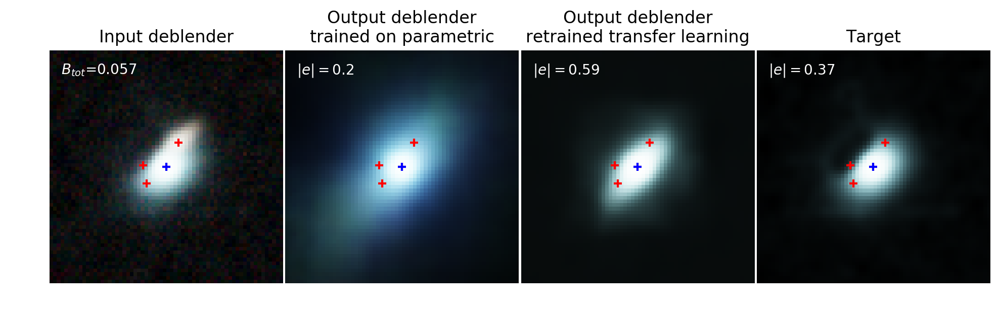

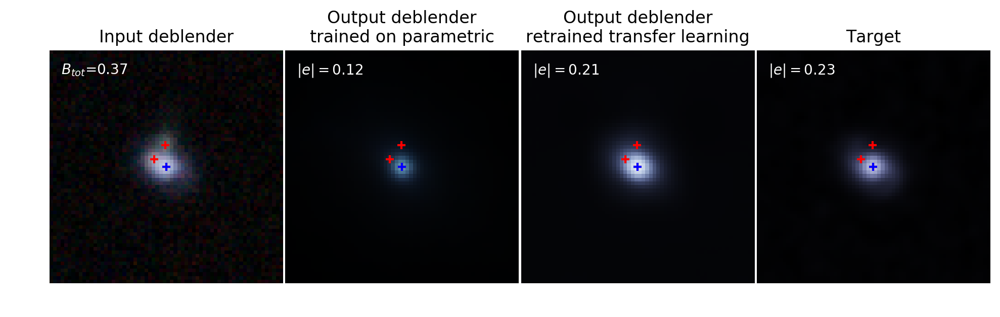

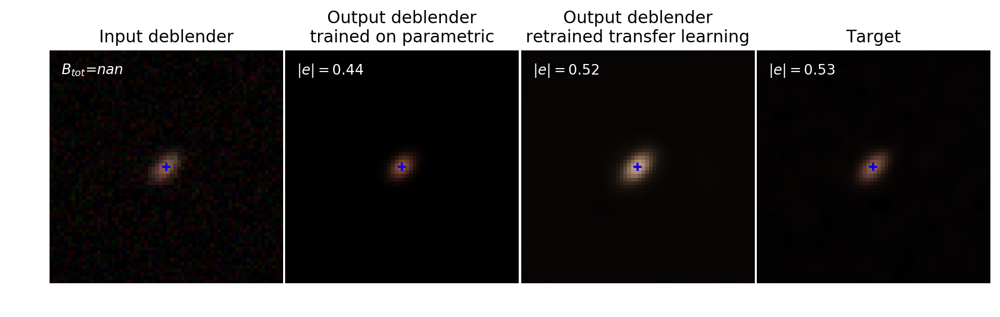

...

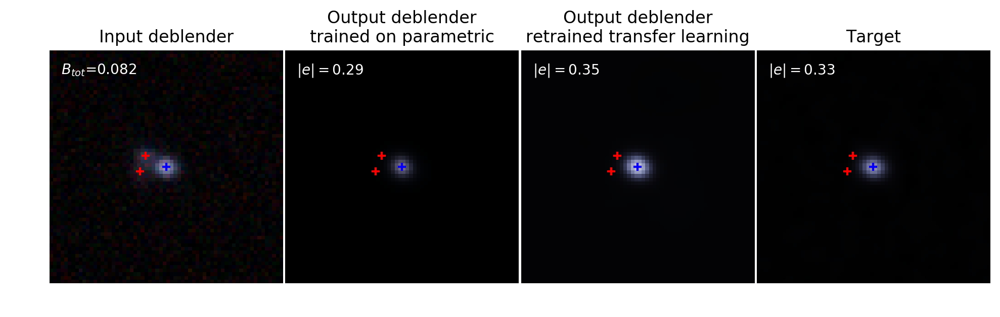

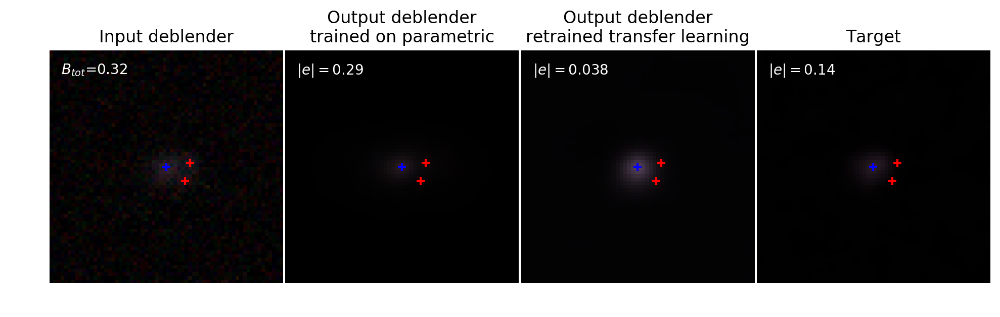

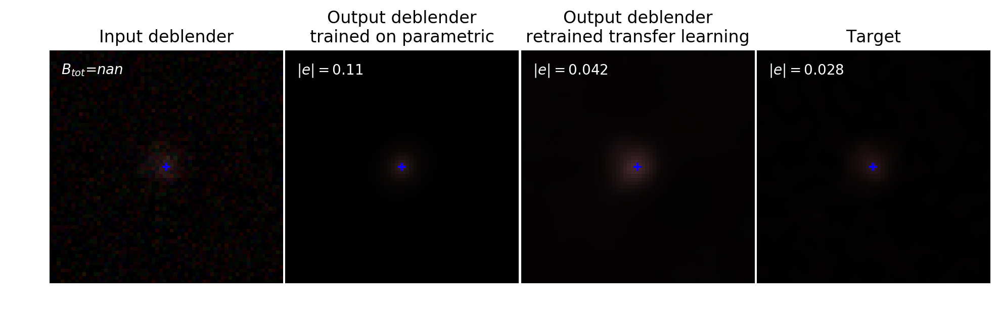

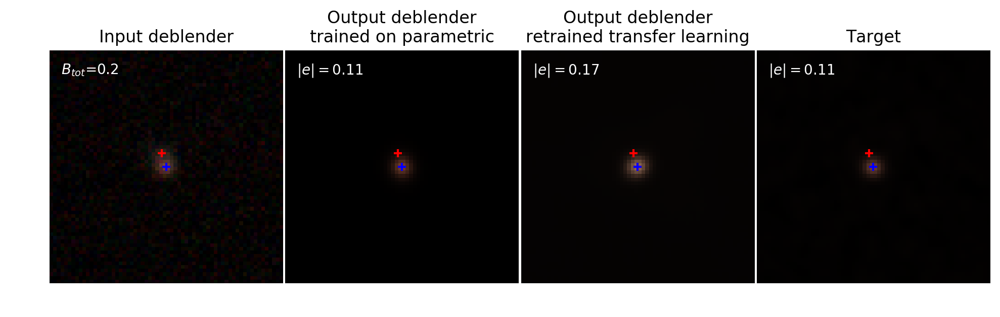

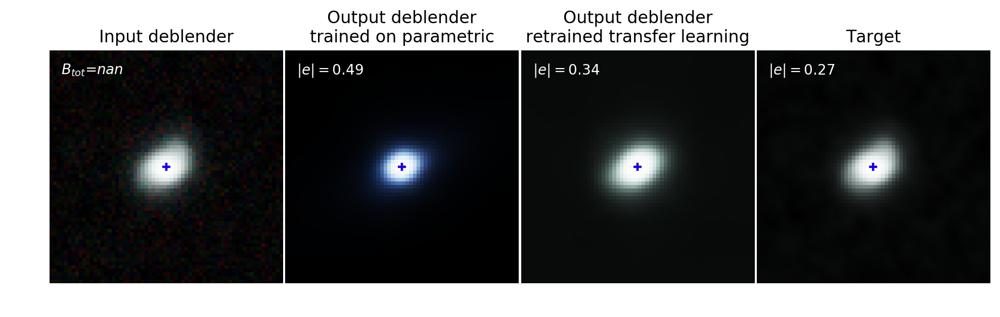

In [57]:
k=0
for j in range (int(len(input_noisy))):
    #print(j)
    fig, axes = plt.subplots(1, 4, figsize=(12, 4))
    fig.subplots_adjust(wspace=.01, hspace=.15)

    plot.plot_rgb(input_noisy[k], bands = [5,6,7],ax= axes[0], band_first= False,zoom = 1, shifts = shifts[indices[k]]/pixel_scale_lsst)
    plot.plot_rgb(output_deblender_lsst_euclid_p[k], bands = [5,6,7],ax= axes[1], band_first = False,zoom = 1, shifts = shifts[indices[k]]/pixel_scale_lsst)
    plot.plot_rgb(output_deblender_lsst_euclid[k], bands = [5,6,7],ax= axes[2], band_first = False,zoom = 1, shifts = shifts[indices[k]]/pixel_scale_lsst)
    plot.plot_rgb(input_noiseless[k], bands = [5,6,7],ax= axes[3], band_first = False,zoom = 1, shifts = shifts[indices[k]]/pixel_scale_lsst)
    axes[0].text(0.05, 0.95, '$B_{tot}$'+'=${:.2g}$'.format(df_plot['blendedness_total_lsst'][indices[k]]), color = 'w', va='top', ha='left', transform=axes[0].transAxes)
    axes[1].text(0.05, 0.95, '$|e|={:.2g}$'.format(df_plot['e_out'][indices[k]]), color = 'w', va='top', ha='left', transform=axes[1].transAxes)
    axes[2].text(0.05, 0.95, '$|e|={:.2g}$'.format(df_plot['e_out'][indices[k]+10000]), color = 'w', va='top', ha='left', transform=axes[2].transAxes)
    axes[3].text(0.05, 0.95, '$|e|={:.2g}$'.format(df_plot['e_in'][indices[k]]), color = 'w', va='top', ha='left', transform=axes[3].transAxes)
    
    axes[0].set_title('Input deblender')
    axes[1].set_title('Output deblender\ntrained on parametric')
    axes[2].set_title('Output deblender\nretrained transfer learning')
    axes[3].set_title('Target')

    axes[0].axis('off')
    axes[1].axis('off')
    axes[2].axis('off')
    axes[3].axis('off')
    k+=1
    
    plt.savefig('figures_v2/deblending/fig_{0}.pdf'.format(j), dpi = 300)

## Bias for mag_cut = 27.5

In [20]:
df_lsst_euclid_real = pd.read_csv('data_v2/df_deb_centered_lsst_euclid_real.csv', encoding = 'utf-8')

In [21]:
df_lsst_euclid_real_transfer = pd.read_csv('data_v2/df_deb_centered_lsst_euclid_real_transfer.csv', encoding = 'utf-8')

In [22]:
df_lsst_euclid = pd.read_csv('data_v2/df_deb_centered_lsst_euclid__27.5_v2.csv', encoding = 'utf-8')

In [23]:
df_bias = pd.DataFrame()
param = 'SNR'
#df_test = df_lsst_euclid[(df_lsst_euclid['e1_out']<=1.) & (df_lsst_euclid['e2_out']<=1.)]

bins = np.geomspace(20, 5000, 10)
bining_temp_init = 10
#bins = np.linspace(0.1, 1, 10)

for k in range (2):
    print(k)
    slope = []
    intercept = []
    std_err = []
    bins_list = []

    bining_temp = bining_temp_init
    mask = ~np.isnan(df_lsst_euclid['e_in']) & ~np.isnan(df_lsst_euclid['e_out'])
    for i, bining in enumerate (bins):
        df_test = df_lsst_euclid[(np.abs(df_lsst_euclid['e1_out'])<=1.) & 
                                 (np.abs(df_lsst_euclid['e2_out'])<=1.) &
                                 (np.abs(df_lsst_euclid['e1_in'])<=1.) & 
                                 (np.abs(df_lsst_euclid['e2_in'])<=1.) &
                                 (df_lsst_euclid['e_out']>=0.) & 
                                 (df_lsst_euclid['e_out']<=1.) &
                                 (df_lsst_euclid['e_in']>=0.) & 
                                 (df_lsst_euclid['e_in']<=1.) &
                                 (bining_temp <= df_lsst_euclid[param]) &
                                 (df_lsst_euclid[param]<= bining)]
        df_test = df_test.drop('Unnamed: 0', axis = 1)
        #print(df_test)
        #print(stats.linregress(df_test['e'+str(k+1)+'_in'][mask], df_test['e'+str(k+1)+'_out'][mask])[0])
        slope.append(stats.linregress(df_test['e'+str(k+1)+'_in'][mask], df_test['e'+str(k+1)+'_out'][mask])[0]-1)
        intercept.append(stats.linregress(df_test['e'+str(k+1)+'_in'][mask], df_test['e'+str(k+1)+'_out'][mask])[1])
        std_err.append(stats.linregress(df_test['e'+str(k+1)+'_in'][mask], df_test['e'+str(k+1)+'_out'][mask])[4])
        bins_list.append(bining)
        bining_temp = bining

    bining_temp = bining_temp_init
    mask = ~np.isnan(df_lsst_euclid_real['e_in']) & ~np.isnan(df_lsst_euclid_real['e_out'])
    for i, bining in enumerate (bins):
        df_test = df_lsst_euclid_real[(np.abs(df_lsst_euclid_real['e1_out'])<=1.) & 
                             (np.abs(df_lsst_euclid_real['e2_out'])<=1.) &
                             (np.abs(df_lsst_euclid_real['e1_in'])<=1.) & 
                             (np.abs(df_lsst_euclid_real['e2_in'])<=1.) &
                             (df_lsst_euclid_real['e_out']>=0.) & 
                             (df_lsst_euclid_real['e_out']<=1.) &
                             (df_lsst_euclid_real['e_in']>=0.) & 
                             (df_lsst_euclid_real['e_in']<=1.) &
                             (bining_temp <= df_lsst_euclid_real[param]) &
                             (df_lsst_euclid_real[param]<= bining)]
        slope.append(stats.linregress(df_test['e'+str(k+1)+'_in'][mask], df_test['e'+str(k+1)+'_out'][mask])[0]-1)
        intercept.append(stats.linregress(df_test['e'+str(k+1)+'_in'][mask], df_test['e'+str(k+1)+'_out'][mask])[1])
        std_err.append(stats.linregress(df_test['e'+str(k+1)+'_in'][mask], df_test['e'+str(k+1)+'_out'][mask])[4])
        bins_list.append(bining)
        bining_temp = bining

    bining_temp = bining_temp_init
    mask = ~np.isnan(df_lsst_euclid_real_transfer['e_in']) & ~np.isnan(df_lsst_euclid_real_transfer['e_out'])
    for i, bining in enumerate (bins):
        df_test = df_lsst_euclid_real_transfer[(np.abs(df_lsst_euclid_real_transfer['e1_out'])<=1.) & 
                           (np.abs(df_lsst_euclid_real_transfer['e2_out'])<=1.) &
                           (np.abs(df_lsst_euclid_real_transfer['e1_in'])<=1.) & 
                           (np.abs(df_lsst_euclid_real_transfer['e2_in'])<=1.) &
                           (df_lsst_euclid_real_transfer['e_out']>=0.) & 
                           (df_lsst_euclid_real_transfer['e_out']<=1.) &
                           (df_lsst_euclid_real_transfer['e_in']>=0.) & 
                           (df_lsst_euclid_real_transfer['e_in']<=1.) &
                           (bining_temp <= df_lsst_euclid_real_transfer[param]) &
                           (df_lsst_euclid_real_transfer[param]<= bining)]
        slope.append(stats.linregress(df_test['e'+str(k+1)+'_in'][mask], df_test['e'+str(k+1)+'_out'][mask])[0]-1)
        intercept.append(stats.linregress(df_test['e'+str(k+1)+'_in'][mask], df_test['e'+str(k+1)+'_out'][mask])[1])
        std_err.append(stats.linregress(df_test['e'+str(k+1)+'_in'][mask], df_test['e'+str(k+1)+'_out'][mask])[4])
        bins_list.append(bining)
        bining_temp = bining
              
    df_bias['slope_e'+str(k+1)] = np.array(slope)
    df_bias['intercept_e'+str(k+1)] = np.array(intercept)
    df_bias['std_err_e'+str(k+1)] = np.array(std_err)

0
1


In [24]:
list_mid_bins = []
idx_temp = 10
for i, idx in enumerate (bins_list):
    if i == 10:
        idx_temp = 10
    if i == 20:
        idx_temp = 10

    list_mid_bins.append(idx - (idx - idx_temp)/2)
    idx_temp = idx

In [25]:
df_bias['Experience'] = len(bins)*['LSST+Euclid param']+ len(bins)*['LSST+Euclid real'] + len(bins)*['LSST+Euclid transfter']
df_bias['bins_list'] = np.array(list_mid_bins)
df_bias['mean_g'] = np.mean([df_bias['slope_e1'],df_bias['slope_e2']], axis = 0)
df_bias['mean_stderr'] = np.mean([df_bias['std_err_e1'],df_bias['std_err_e2']], axis = 0)

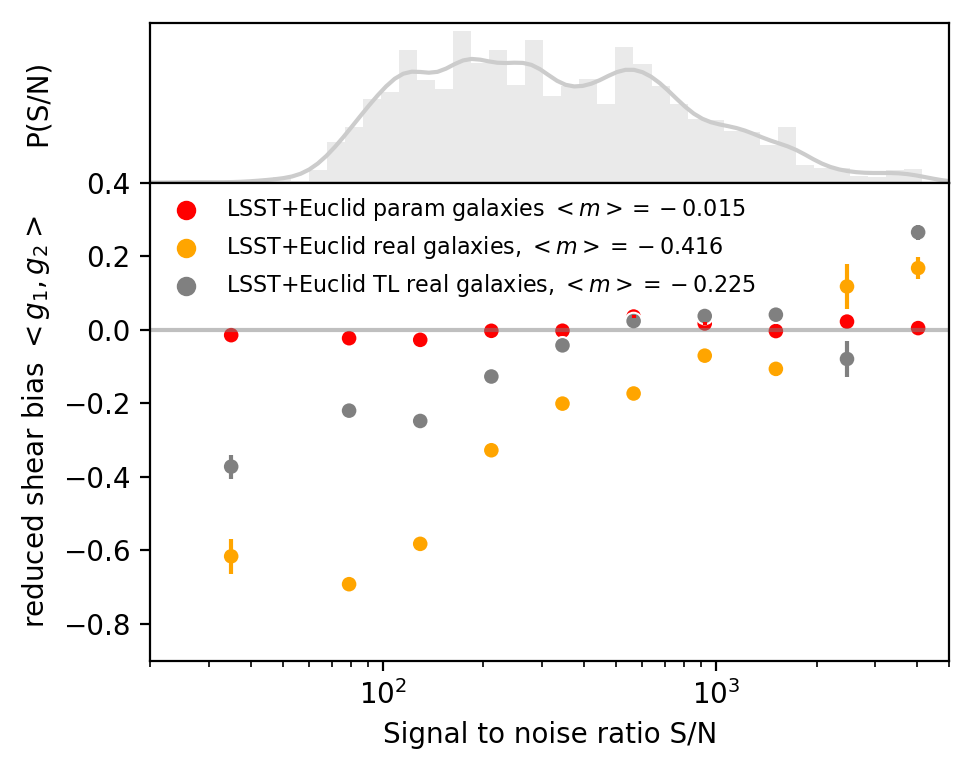

In [54]:
import matplotlib as mpl
mpl.rcdefaults()


fig, axes = plt.subplots(2, 1, figsize=(5,4),sharey='row', gridspec_kw={'height_ratios': [1, 3]})

palette_lsst_euclid = ['red']
palette_lsst_euclid_real = ['orange']
palette_lsst_euclid_transfer = ['grey']

xlim = (20,5000)
xscale = 'log'


sns.distplot(np.log10(df_lsst_euclid_real[param]), ax=axes[0], color='0.8')
axes[0].set_xlim(np.log10(xlim[0]), np.log10(xlim[1]))
axes[0].set_ylabel('P(S/N)', fontsize = 10)
axes[0].set_yticks([])

    
### For <g1, g2>

xlim = (20,5000)
handles = []
legend = []

axis = axes[1]
ax = sns.scatterplot(x="bins_list",
              y="mean_g", 
              hue="Experience",
              data=df_bias, 
              markers = '.',
              palette = [palette_lsst_euclid[0], palette_lsst_euclid_real[0], palette_lsst_euclid_transfer[0]],
              #label = ['LSST $|g_'+str(k+1)+'|$','LSST+Euclid $|g_'+str(k+1)+'|$'],
              ax = axis)
#print(ax.get_legend_handles_labels()[1])

handles.append(ax.get_legend_handles_labels()[0][1])
handles.append(ax.get_legend_handles_labels()[0][2])
handles.append(ax.get_legend_handles_labels()[0][3])
legend.append('LSST+Euclid param galaxies $<m> = -0.015$')
legend.append('LSST+Euclid real galaxies, $<m> = -0.416$')
legend.append('LSST+Euclid TL real galaxies, $<m> = -0.225$')
# Find the x,y coordinates for each point
x_coords = []
y_coords = []

for i, idx in enumerate (df_bias['bins_list']):
    x_coords.append(idx)
    y_coords.append(df_bias["mean_g"][i])

colors = [palette_lsst_euclid[0]]*int(len(df_bias['bins_list'])/3) + [palette_lsst_euclid_real[0]]*int(len(df_bias['bins_list'])/3) + [palette_lsst_euclid_transfer[0]]*int(len(df_bias['bins_list'])/3)

axis.errorbar(x_coords, 
             y_coords, 
             yerr=df_bias['mean_stderr'],
             ecolor=colors,
             fmt=' ')


axis.legend(handles, legend, frameon=False, loc ='upper left', borderpad = 0.1, fontsize = 8)#, ncol=2)#, colors = ['steelblue','coral','blue','red'])
axis.set_xlabel('Signal to noise ratio S/N', fontsize = 10)
axis.axhline(0, color = 'grey', alpha = 0.5)
axis.set_xscale(xscale)
axis.set_xlim(xlim)
axis.set_ylim(-0.9,0.4)
axis.set_ylabel('mean ellipticity error $<g_1, g_2>$', fontsize = 10)

fig.align_ylabels(axes)  
fig.tight_layout()
fig.subplots_adjust(wspace=0, hspace=0)

#fig.savefig('figures/bias_v2.pdf', dpi = 300)

In [172]:
df_bias_all_sample = pd.DataFrame()
param = 'SNR'
#df_test = df_lsst_euclid[(df_lsst_euclid['e1_out']<=1.) & (df_lsst_euclid['e2_out']<=1.)]

bins = np.geomspace(20, 5000, 1)
bins = np.linspace(0.1, 1, 10)

for k in range (2):
    slope = []
    intercept = []
    std_err = []
    mean_e=[]

    mask = ~np.isnan(df_lsst_euclid['e_in']) & ~np.isnan(df_lsst_euclid['e_out'])
    df_test = df_lsst_euclid[(np.abs(df_lsst_euclid['e1_out'])<=1.) & 
                             (np.abs(df_lsst_euclid['e2_out'])<=1.) &
                             (np.abs(df_lsst_euclid['e1_in'])<=1.) & 
                             (np.abs(df_lsst_euclid['e2_in'])<=1.) &
                             (df_lsst_euclid['e_out']>=0.) & 
                             (df_lsst_euclid['e_out']<=1.) &
                             (df_lsst_euclid['e_in']>=0.) & 
                             (df_lsst_euclid['e_in']<=1.)]
    slope.append(stats.linregress(df_test['e'+str(k+1)+'_in'][mask], df_test['e'+str(k+1)+'_out'][mask])[0]-1)
    intercept.append(stats.linregress(df_test['e'+str(k+1)+'_in'][mask], df_test['e'+str(k+1)+'_out'][mask])[1])
    std_err.append(stats.linregress(df_test['e'+str(k+1)+'_in'][mask], df_test['e'+str(k+1)+'_out'][mask])[4])

    mask = ~np.isnan(df_lsst_euclid_real['e_in']) & ~np.isnan(df_lsst_euclid_real['e_out'])
    df_test = df_lsst_euclid_real[(np.abs(df_lsst_euclid_real['e1_out'])<=1.) & 
                         (np.abs(df_lsst_euclid_real['e2_out'])<=1.) &
                         (np.abs(df_lsst_euclid_real['e1_in'])<=1.) & 
                         (np.abs(df_lsst_euclid_real['e2_in'])<=1.) &
                         (df_lsst_euclid_real['e_out']>=0.) & 
                         (df_lsst_euclid_real['e_out']<=1.) &
                         (df_lsst_euclid_real['e_in']>=0.) & 
                         (df_lsst_euclid_real['e_in']<=1.) ]
    slope.append(stats.linregress(df_test['e'+str(k+1)+'_in'][mask], df_test['e'+str(k+1)+'_out'][mask])[0]-1)
    intercept.append(stats.linregress(df_test['e'+str(k+1)+'_in'][mask], df_test['e'+str(k+1)+'_out'][mask])[1])
    std_err.append(stats.linregress(df_test['e'+str(k+1)+'_in'][mask], df_test['e'+str(k+1)+'_out'][mask])[4])


    mask = ~np.isnan(df_lsst_euclid_real_transfer['e_in']) & ~np.isnan(df_lsst_euclid_real_transfer['e_out'])
    df_test = df_lsst_euclid_real_transfer[(np.abs(df_lsst_euclid_real_transfer['e1_out'])<=1.) & 
                       (np.abs(df_lsst_euclid_real_transfer['e2_out'])<=1.) &
                       (np.abs(df_lsst_euclid_real_transfer['e1_in'])<=1.) & 
                       (np.abs(df_lsst_euclid_real_transfer['e2_in'])<=1.) &
                       (df_lsst_euclid_real_transfer['e_out']>=0.) & 
                       (df_lsst_euclid_real_transfer['e_out']<=1.) &
                       (df_lsst_euclid_real_transfer['e_in']>=0.) & 
                       (df_lsst_euclid_real_transfer['e_in']<=1.) ]
    slope.append(stats.linregress(df_test['e'+str(k+1)+'_in'][mask], df_test['e'+str(k+1)+'_out'][mask])[0]-1)
    intercept.append(stats.linregress(df_test['e'+str(k+1)+'_in'][mask], df_test['e'+str(k+1)+'_out'][mask])[1])
    std_err.append(stats.linregress(df_test['e'+str(k+1)+'_in'][mask], df_test['e'+str(k+1)+'_out'][mask])[4])

              
    df_bias_all_sample['slope_e'+str(k+1)] = np.array(slope)
    df_bias_all_sample['intercept_e'+str(k+1)] = np.array(intercept)
    df_bias_all_sample['std_err_e'+str(k+1)] = np.array(std_err)


In [173]:
df_bias_all_sample['mean_e'] = np.mean([df_bias_all_sample['slope_e1'],df_bias_all_sample['slope_e2']], axis = 0)

In [174]:
df_bias_all_sample

,slope_e1,intercept_e1,std_err_e1,slope_e2,intercept_e2,std_err_e2,mean_e
0,-0.013088,0.000645,0.001525,-0.018165,0.000844,0.001469,-0.015627
1,-0.404929,0.014916,0.006785,-0.427364,-0.047632,0.008422,-0.416147
2,-0.216511,0.007838,0.004299,-0.234382,-0.002610,0.004364,-0.225446


## Bias for mag_cut = 26

In [171]:
df_lsst_euclid_real = pd.read_csv('data_v2/df_deb_centered_lsst_euclid_real_26.csv', encoding = 'utf-8')

In [172]:
df_lsst_euclid_real_transfer = pd.read_csv('data_v2/df_deb_centered_lsst_euclid_real_transfer_26.csv', encoding = 'utf-8')

In [173]:
df_lsst_euclid = pd.read_csv('data_v2/df_deb_centered_lsst_euclid__27.5_v2.csv', encoding = 'utf-8')

In [216]:
df_bias = pd.DataFrame()
param = 'SNR'
#df_test = df_lsst_euclid[(df_lsst_euclid['e1_out']<=1.) & (df_lsst_euclid['e2_out']<=1.)]

bins = np.geomspace(60, 5000, 10)
bining_temp_init = 40
#bins = np.linspace(0.1, 1, 10)

for k in range (2):
    print(k)
    slope = []
    intercept = []
    std_err = []
    bins_list = []

    bining_temp = bining_temp_init
    mask = ~np.isnan(df_lsst_euclid['e_in']) & ~np.isnan(df_lsst_euclid['e_out'])
    for i, bining in enumerate (bins):
        df_test = df_lsst_euclid[(np.abs(df_lsst_euclid['e1_out'])<=1.) & 
                                 (np.abs(df_lsst_euclid['e2_out'])<=1.) &
                                 (np.abs(df_lsst_euclid['e1_in'])<=1.) & 
                                 (np.abs(df_lsst_euclid['e2_in'])<=1.) &
                                 (df_lsst_euclid['e_out']>=0.) & 
                                 (df_lsst_euclid['e_out']<=1.) &
                                 (df_lsst_euclid['e_in']>=0.) & 
                                 (df_lsst_euclid['e_in']<=1.) &
                                 (bining_temp <= df_lsst_euclid[param]) &
                                 (df_lsst_euclid[param]<= bining)]
        df_test = df_test.drop('Unnamed: 0', axis = 1)
        #print(df_test)
        #print(stats.linregress(df_test['e'+str(k+1)+'_in'][mask], df_test['e'+str(k+1)+'_out'][mask])[0])
        slope.append(stats.linregress(df_test['e'+str(k+1)+'_in'][mask], df_test['e'+str(k+1)+'_out'][mask])[0]-1)
        intercept.append(stats.linregress(df_test['e'+str(k+1)+'_in'][mask], df_test['e'+str(k+1)+'_out'][mask])[1])
        std_err.append(stats.linregress(df_test['e'+str(k+1)+'_in'][mask], df_test['e'+str(k+1)+'_out'][mask])[4])
        bins_list.append(bining)
        bining_temp = bining

    bining_temp = bining_temp_init
    mask = ~np.isnan(df_lsst_euclid_real['e_in']) & ~np.isnan(df_lsst_euclid_real['e_out'])
    for i, bining in enumerate (bins):
        df_test = df_lsst_euclid_real[(np.abs(df_lsst_euclid_real['e1_out'])<=1.) & 
                             (np.abs(df_lsst_euclid_real['e2_out'])<=1.) &
                             (np.abs(df_lsst_euclid_real['e1_in'])<=1.) & 
                             (np.abs(df_lsst_euclid_real['e2_in'])<=1.) &
                             (df_lsst_euclid_real['e_out']>=0.) & 
                             (df_lsst_euclid_real['e_out']<=1.) &
                             (df_lsst_euclid_real['e_in']>=0.) & 
                             (df_lsst_euclid_real['e_in']<=1.) &
                             (bining_temp <= df_lsst_euclid_real[param]) &
                             (df_lsst_euclid_real[param]<= bining)]
        slope.append(stats.linregress(df_test['e'+str(k+1)+'_in'][mask], df_test['e'+str(k+1)+'_out'][mask])[0]-1)
        intercept.append(stats.linregress(df_test['e'+str(k+1)+'_in'][mask], df_test['e'+str(k+1)+'_out'][mask])[1])
        std_err.append(stats.linregress(df_test['e'+str(k+1)+'_in'][mask], df_test['e'+str(k+1)+'_out'][mask])[4])
        bins_list.append(bining)
        bining_temp = bining

    bining_temp = bining_temp_init
    mask = ~np.isnan(df_lsst_euclid_real_transfer['e_in']) & ~np.isnan(df_lsst_euclid_real_transfer['e_out'])
    for i, bining in enumerate (bins):
        df_test = df_lsst_euclid_real_transfer[(np.abs(df_lsst_euclid_real_transfer['e1_out'])<=1.) & 
                           (np.abs(df_lsst_euclid_real_transfer['e2_out'])<=1.) &
                           (np.abs(df_lsst_euclid_real_transfer['e1_in'])<=1.) & 
                           (np.abs(df_lsst_euclid_real_transfer['e2_in'])<=1.) &
                           (df_lsst_euclid_real_transfer['e_out']>=0.) & 
                           (df_lsst_euclid_real_transfer['e_out']<=1.) &
                           (df_lsst_euclid_real_transfer['e_in']>=0.) & 
                           (df_lsst_euclid_real_transfer['e_in']<=1.) &
                           (bining_temp <= df_lsst_euclid_real_transfer[param]) &
                           (df_lsst_euclid_real_transfer[param]<= bining)]
        slope.append(stats.linregress(df_test['e'+str(k+1)+'_in'][mask], df_test['e'+str(k+1)+'_out'][mask])[0]-1)
        intercept.append(stats.linregress(df_test['e'+str(k+1)+'_in'][mask], df_test['e'+str(k+1)+'_out'][mask])[1])
        std_err.append(stats.linregress(df_test['e'+str(k+1)+'_in'][mask], df_test['e'+str(k+1)+'_out'][mask])[4])
        bins_list.append(bining)
        bining_temp = bining
              
    df_bias['slope_e'+str(k+1)] = np.array(slope)
    df_bias['intercept_e'+str(k+1)] = np.array(intercept)
    df_bias['std_err_e'+str(k+1)] = np.array(std_err)

0
1


In [217]:
list_mid_bins = []
idx_temp = 40
for i, idx in enumerate (bins_list):
    print(idx)
    if i == 10:
        idx_temp = 40
    if i == 20:
        idx_temp = 40

    list_mid_bins.append(idx - (idx - idx_temp)/2)
    idx_temp = idx

60.0
98.07889322250577
160.3244882625282
262.07413942088954
428.39902561069215
700.2817048249435
1144.7142425533327
1871.2050994278304
3058.7620857365064
4999.999999999999
60.0
98.07889322250577
160.3244882625282
262.07413942088954
428.39902561069215
700.2817048249435
1144.7142425533327
1871.2050994278304
3058.7620857365064
4999.999999999999
60.0
98.07889322250577
160.3244882625282
262.07413942088954
428.39902561069215
700.2817048249435
1144.7142425533327
1871.2050994278304
3058.7620857365064
4999.999999999999


In [218]:
df_bias['Experience'] = len(bins)*['LSST+Euclid param']+ len(bins)*['LSST+Euclid real'] + len(bins)*['LSST+Euclid transfter']
df_bias['bins_list'] = np.array(list_mid_bins)
df_bias['mean_g'] = np.mean([df_bias['slope_e1'],df_bias['slope_e2']], axis = 0)
df_bias['mean_stderr'] = np.mean([df_bias['std_err_e1'],df_bias['std_err_e2']], axis = 0)

In [219]:
df_bias

,slope_e1,intercept_e1,std_err_e1,slope_e2,intercept_e2,std_err_e2,Experience,bins_list,mean_g,mean_stderr
0,-0.012430,0.000190,0.003737,-0.015496,0.000414,0.003704,LSST+Euclid param,50.000000,-0.013963,0.003720
1,-0.022288,-0.000840,0.003787,-0.024110,0.000864,0.003344,LSST+Euclid param,79.039447,-0.023199,0.003565
2,-0.031428,0.001396,0.003232,-0.023940,0.002026,0.003175,LSST+Euclid param,129.201691,-0.027684,0.003203
3,-0.004666,0.000015,0.003154,-0.001585,-0.000111,0.002996,LSST+Euclid param,211.199314,-0.003125,0.003075
4,0.005210,0.000919,0.003477,-0.011049,0.001965,0.003314,LSST+Euclid param,345.236583,-0.002919,0.003395
5,0.041682,0.001161,0.004198,0.029723,0.000382,0.003785,LSST+Euclid param,564.340365,0.035703,0.003991
6,0.014932,-0.002758,0.005122,0.018922,0.000315,0.005075,LSST+Euclid param,922.497974,0.016927,0.005098
7,-0.002668,-0.003263,0.011223,-0.004915,0.003044,0.009511,LSST+Euclid param,1507.959671,-0.003791,0.010367
8,0.018586,-0.002638,0.021326,0.025240,0.003364,0.014167,LSST+Euclid param,2464.983593,0.021913,0.017746
9,0.008851,-0.000911,0.015028,-0.000335,0.013826,0.010106,LSST+Euclid param,4029.381043,0.004258,0.012567


In [220]:
df_bias.drop(df_bias.index[[0,10,20]])

,slope_e1,intercept_e1,std_err_e1,slope_e2,intercept_e2,std_err_e2,Experience,bins_list,mean_g,mean_stderr
1,-0.022288,-0.000840,0.003787,-0.024110,0.000864,0.003344,LSST+Euclid param,79.039447,-0.023199,0.003565
2,-0.031428,0.001396,0.003232,-0.023940,0.002026,0.003175,LSST+Euclid param,129.201691,-0.027684,0.003203
3,-0.004666,0.000015,0.003154,-0.001585,-0.000111,0.002996,LSST+Euclid param,211.199314,-0.003125,0.003075
4,0.005210,0.000919,0.003477,-0.011049,0.001965,0.003314,LSST+Euclid param,345.236583,-0.002919,0.003395
5,0.041682,0.001161,0.004198,0.029723,0.000382,0.003785,LSST+Euclid param,564.340365,0.035703,0.003991
6,0.014932,-0.002758,0.005122,0.018922,0.000315,0.005075,LSST+Euclid param,922.497974,0.016927,0.005098
7,-0.002668,-0.003263,0.011223,-0.004915,0.003044,0.009511,LSST+Euclid param,1507.959671,-0.003791,0.010367
8,0.018586,-0.002638,0.021326,0.025240,0.003364,0.014167,LSST+Euclid param,2464.983593,0.021913,0.017746
9,0.008851,-0.000911,0.015028,-0.000335,0.013826,0.010106,LSST+Euclid param,4029.381043,0.004258,0.012567
11,-0.623682,0.019332,0.017988,-0.760956,0.000110,0.016144,LSST+Euclid real,79.039447,-0.692319,0.017066


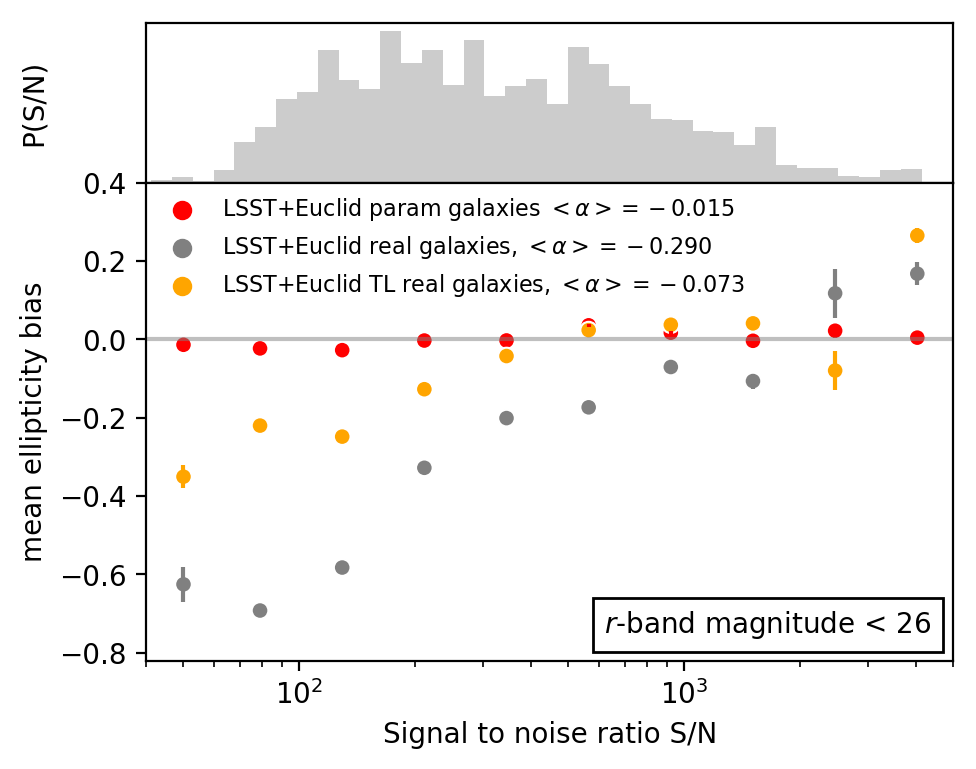

In [223]:
import matplotlib as mpl
mpl.rcdefaults()


fig, axes = plt.subplots(2, 1, figsize=(5,4),sharey='row', gridspec_kw={'height_ratios': [1, 3]})

palette_lsst_euclid = ['red']
palette_lsst_euclid_real = ['grey']
palette_lsst_euclid_transfer = ['orange']

xlim = (40,5000)
xscale = 'log'


sns.distplot(np.log10(df_lsst_euclid_real[param]), ax=axes[0], color='0.5', kde = False)
axes[0].set_xlim(np.log10(xlim[0]), np.log10(xlim[1]))
axes[0].set_ylabel('P(S/N)', fontsize = 10)
axes[0].set_yticks([])
axes[0].set_xticks([])

    
### For <g1, g2>

xlim = (40,5000)
handles = []
legend = []

axis = axes[1]
ax = sns.scatterplot(x="bins_list",
              y="mean_g", 
              hue="Experience",
              data=df_bias, 
              markers = '.',
              palette = [palette_lsst_euclid[0], palette_lsst_euclid_real[0], palette_lsst_euclid_transfer[0]],
              #label = ['LSST $|g_'+str(k+1)+'|$','LSST+Euclid $|g_'+str(k+1)+'|$'],
              ax = axis)
#print(ax.get_legend_handles_labels()[1])

handles.append(ax.get_legend_handles_labels()[0][1])
handles.append(ax.get_legend_handles_labels()[0][2])
handles.append(ax.get_legend_handles_labels()[0][3])
legend.append('LSST+Euclid param galaxies $<\\alpha> = -0.015$')
legend.append('LSST+Euclid real galaxies, $<\\alpha> = -0.290$')
legend.append('LSST+Euclid TL real galaxies, $<\\alpha> = -0.073$')
# Find the x,y coordinates for each point
x_coords = []
y_coords = []

#df_bias = df_bias.drop(df_bias.index[[0,10,20]])
for i, idx in enumerate (df_bias['bins_list']):
    x_coords.append(idx)
    y_coords.append(df_bias["mean_g"][i])
    #print(i)
    #if i <9:
    #    print('ici', i+1)
    #    y_coords.append(df_bias["mean_g"][i+1])
    #if 9<= i <18:
    #    print('la', i+2)
    #    y_coords.append(df_bias["mean_g"][i+2])
    #if i>=18:
    #    print('fin', i+3)
    #    y_coords.append(df_bias["mean_g"][i+3])

colors = [palette_lsst_euclid[0]]*int(len(df_bias['bins_list'])/3) + [palette_lsst_euclid_real[0]]*int(len(df_bias['bins_list'])/3) + [palette_lsst_euclid_transfer[0]]*int(len(df_bias['bins_list'])/3)

axis.errorbar(x_coords, 
             y_coords, 
             yerr=df_bias['mean_stderr'],
             ecolor=colors,
             fmt=' ')


axis.legend(handles, legend, frameon=False, loc ='upper left', borderpad = 0.1, fontsize = 8)#, ncol=2)#, colors = ['steelblue','coral','blue','red'])
axis.set_xlabel('Signal to noise ratio S/N', fontsize = 10)
axis.axhline(0, color = 'grey', alpha = 0.5)
axis.set_xscale(xscale)
axis.set_xlim(xlim)
axis.set_ylim(-0.82,0.4)
axis.set_ylabel('mean ellipticity bias', fontsize = 10)

#axis.text(20,-0.75,'$r$-band magnitude < 26')
axis.text(620,-0.75,'$r$-band magnitude < 26',bbox=dict(fc="none"))#,horizontalalignment='left')

fig.align_ylabels(axes)  
fig.tight_layout()
fig.subplots_adjust(wspace=0, hspace=0)
fig.savefig('figures_v2/bias_ellipticity_transfert_learning_v5.pdf', dpi = 300)

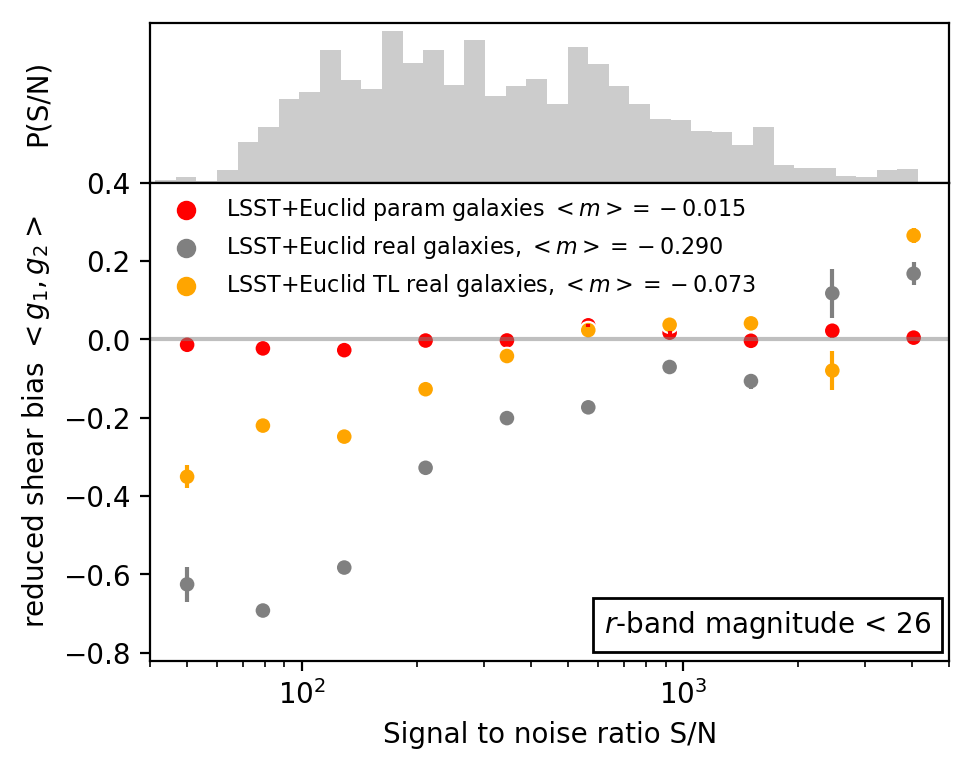

In [222]:
import matplotlib as mpl
mpl.rcdefaults()


fig, axes = plt.subplots(2, 1, figsize=(5,4),sharey='row', gridspec_kw={'height_ratios': [1, 3]})

palette_lsst_euclid = ['red']
palette_lsst_euclid_real = ['grey']
palette_lsst_euclid_transfer = ['orange']

xlim = (40,5000)
xscale = 'log'


sns.distplot(np.log10(df_lsst_euclid_real[param]), ax=axes[0], color='0.5', kde = False)
axes[0].set_xlim(np.log10(xlim[0]), np.log10(xlim[1]))
axes[0].set_ylabel('P(S/N)', fontsize = 10)
axes[0].set_yticks([])

    
### For <g1, g2>

xlim = (40,5000)
handles = []
legend = []

axis = axes[1]
ax = sns.scatterplot(x="bins_list",
              y="mean_g", 
              hue="Experience",
              data=df_bias, 
              markers = '.',
              palette = [palette_lsst_euclid[0], palette_lsst_euclid_real[0], palette_lsst_euclid_transfer[0]],
              #label = ['LSST $|g_'+str(k+1)+'|$','LSST+Euclid $|g_'+str(k+1)+'|$'],
              ax = axis)
#print(ax.get_legend_handles_labels()[1])

handles.append(ax.get_legend_handles_labels()[0][1])
handles.append(ax.get_legend_handles_labels()[0][2])
handles.append(ax.get_legend_handles_labels()[0][3])
legend.append('LSST+Euclid param galaxies $<m> = -0.015$')
legend.append('LSST+Euclid real galaxies, $<m> = -0.290$')
legend.append('LSST+Euclid TL real galaxies, $<m> = -0.073$')
# Find the x,y coordinates for each point
x_coords = []
y_coords = []

for i, idx in enumerate (df_bias['bins_list']):
    x_coords.append(idx)
    y_coords.append(df_bias["mean_g"][i])

colors = [palette_lsst_euclid[0]]*int(len(df_bias['bins_list'])/3) + [palette_lsst_euclid_real[0]]*int(len(df_bias['bins_list'])/3) + [palette_lsst_euclid_transfer[0]]*int(len(df_bias['bins_list'])/3)

axis.errorbar(x_coords, 
             y_coords, 
             yerr=df_bias['mean_stderr'],
             ecolor=colors,
             fmt=' ')


axis.legend(handles, legend, frameon=False, loc ='upper left', borderpad = 0.1, fontsize = 8)#, ncol=2)#, colors = ['steelblue','coral','blue','red'])
axis.set_xlabel('Signal to noise ratio S/N', fontsize = 10)
axis.axhline(0, color = 'grey', alpha = 0.5)
axis.set_xscale(xscale)
axis.set_xlim(xlim)
axis.set_ylim(-0.82,0.4)
axis.set_ylabel('reduced shear bias $<g_1, g_2>$', fontsize = 10)

#axis.text(20,-0.75,'$r$-band magnitude < 26')
axis.text(620,-0.75,'$r$-band magnitude < 26',bbox=dict(fc="none"))#,horizontalalignment='left')

fig.align_ylabels(axes)  
fig.tight_layout()
fig.subplots_adjust(wspace=0, hspace=0)

#fig.savefig('figures_v2/bias_transfert_learning_v2.pdf', dpi = 300)

In [168]:
df_bias_all_sample = pd.DataFrame()
param = 'SNR'
#df_test = df_lsst_euclid[(df_lsst_euclid['e1_out']<=1.) & (df_lsst_euclid['e2_out']<=1.)]

bins = np.geomspace(40, 5000, 1)
bins = np.linspace(0.1, 1, 10)

for k in range (2):
    slope = []
    intercept = []
    std_err = []
    mean_e=[]

    mask = ~np.isnan(df_lsst_euclid['e_in']) & ~np.isnan(df_lsst_euclid['e_out'])
    df_test = df_lsst_euclid[(np.abs(df_lsst_euclid['e1_out'])<=1.) & 
                             (np.abs(df_lsst_euclid['e2_out'])<=1.) &
                             (np.abs(df_lsst_euclid['e1_in'])<=1.) & 
                             (np.abs(df_lsst_euclid['e2_in'])<=1.) &
                             (df_lsst_euclid['e_out']>=0.) & 
                             (df_lsst_euclid['e_out']<=1.) &
                             (df_lsst_euclid['e_in']>=0.) & 
                             (df_lsst_euclid['e_in']<=1.)]
    slope.append(stats.linregress(df_test['e'+str(k+1)+'_in'][mask], df_test['e'+str(k+1)+'_out'][mask])[0]-1)
    intercept.append(stats.linregress(df_test['e'+str(k+1)+'_in'][mask], df_test['e'+str(k+1)+'_out'][mask])[1])
    std_err.append(stats.linregress(df_test['e'+str(k+1)+'_in'][mask], df_test['e'+str(k+1)+'_out'][mask])[4])

    mask = ~np.isnan(df_lsst_euclid_real['e_in']) & ~np.isnan(df_lsst_euclid_real['e_out'])
    df_test = df_lsst_euclid_real[(np.abs(df_lsst_euclid_real['e1_out'])<=1.) & 
                         (np.abs(df_lsst_euclid_real['e2_out'])<=1.) &
                         (np.abs(df_lsst_euclid_real['e1_in'])<=1.) & 
                         (np.abs(df_lsst_euclid_real['e2_in'])<=1.) &
                         (df_lsst_euclid_real['e_out']>=0.) & 
                         (df_lsst_euclid_real['e_out']<=1.) &
                         (df_lsst_euclid_real['e_in']>=0.) & 
                         (df_lsst_euclid_real['e_in']<=1.) ]
    slope.append(stats.linregress(df_test['e'+str(k+1)+'_in'][mask], df_test['e'+str(k+1)+'_out'][mask])[0]-1)
    intercept.append(stats.linregress(df_test['e'+str(k+1)+'_in'][mask], df_test['e'+str(k+1)+'_out'][mask])[1])
    std_err.append(stats.linregress(df_test['e'+str(k+1)+'_in'][mask], df_test['e'+str(k+1)+'_out'][mask])[4])


    mask = ~np.isnan(df_lsst_euclid_real_transfer['e_in']) & ~np.isnan(df_lsst_euclid_real_transfer['e_out'])
    df_test = df_lsst_euclid_real_transfer[(np.abs(df_lsst_euclid_real_transfer['e1_out'])<=1.) & 
                       (np.abs(df_lsst_euclid_real_transfer['e2_out'])<=1.) &
                       (np.abs(df_lsst_euclid_real_transfer['e1_in'])<=1.) & 
                       (np.abs(df_lsst_euclid_real_transfer['e2_in'])<=1.) &
                       (df_lsst_euclid_real_transfer['e_out']>=0.) & 
                       (df_lsst_euclid_real_transfer['e_out']<=1.) &
                       (df_lsst_euclid_real_transfer['e_in']>=0.) & 
                       (df_lsst_euclid_real_transfer['e_in']<=1.) ]
    slope.append(stats.linregress(df_test['e'+str(k+1)+'_in'][mask], df_test['e'+str(k+1)+'_out'][mask])[0]-1)
    intercept.append(stats.linregress(df_test['e'+str(k+1)+'_in'][mask], df_test['e'+str(k+1)+'_out'][mask])[1])
    std_err.append(stats.linregress(df_test['e'+str(k+1)+'_in'][mask], df_test['e'+str(k+1)+'_out'][mask])[4])

              
    df_bias_all_sample['slope_e'+str(k+1)] = np.array(slope)
    df_bias_all_sample['intercept_e'+str(k+1)] = np.array(intercept)
    df_bias_all_sample['std_err_e'+str(k+1)] = np.array(std_err)


df_bias_all_sample['mean_e'] = np.mean([df_bias_all_sample['slope_e1'],df_bias_all_sample['slope_e2']], axis = 0)

In [169]:
df_bias_all_sample

,slope_e1,intercept_e1,std_err_e1,slope_e2,intercept_e2,std_err_e2,mean_e
0,-0.013088,0.000645,0.001525,-0.018165,0.000844,0.001469,-0.015627
1,-0.252724,-0.011550,0.005562,-0.326938,-0.018423,0.005794,-0.289831
2,-0.071982,-0.000121,0.004092,-0.073290,-0.007763,0.004028,-0.072636


# Sampling into latent space

In [68]:
data_dir = '/sps/lsst/users/barcelin/data/blended_galaxies/27.5/centered/test/'
root = 'galaxies_blended_20191024'

In [69]:
shifts = np.load(os.path.join(data_dir, root+'_0_shifts.npy'))
images = np.load(data_dir+'galaxies_blended_20191024_0_images.npy', mmap_mode = 'c')
test_sample = [data_dir+'galaxies_blended_20191024_0_images.npy']

images = images.transpose([0,1,3,4,2])

In [70]:
dfs = []

dfs.append(pd.read_csv(os.path.join(data_dir, root+'_0_data.csv')))
df = dfs[0]

for df2 in dfs[1:]:
    df = df.append(df2)

In [71]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 22 columns):
nb_blended_gal               10000 non-null int64
SNR                          10000 non-null float64
SNR_peak                     10000 non-null float64
redshift                     10000 non-null float64
moment_sigma                 10000 non-null float64
e1                           10000 non-null float64
e2                           10000 non-null float64
mag                          10000 non-null float64
mag_ir                       10000 non-null float64
closest_x                    7471 non-null float64
closest_y                    7471 non-null float64
closest_redshift             7471 non-null float64
closest_moment_sigma         7471 non-null float64
closest_e1                   7471 non-null float64
closest_e2                   7471 non-null float64
closest_mag                  7471 non-null float64
closest_mag_ir               7471 non-null float64
blendedness_total_

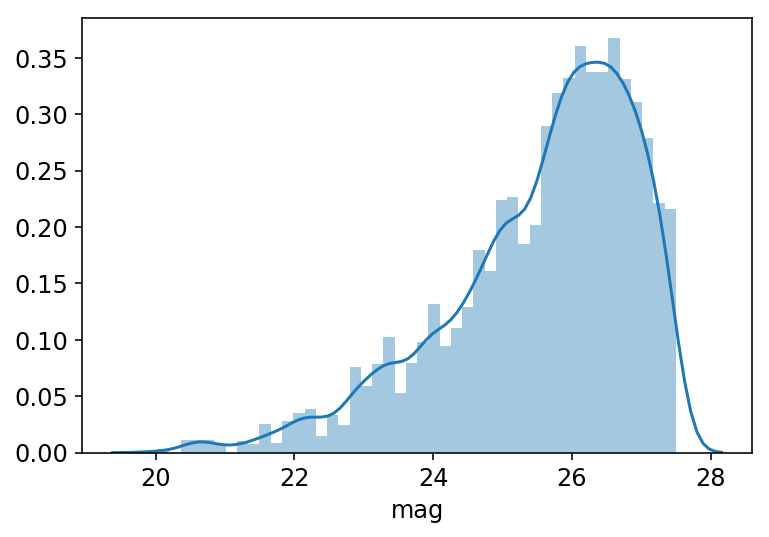

In [72]:
sns.distplot(df['mag'])

Compute the constant to add to have the correct magnitude

In [73]:
# First need to have maximum in flux in the noiseless images
flux_in = []
for i in range(len(images)):
    flux_in.append(np.sum(images[i][0,:,:,6]))

In [74]:
cut_mag = 27.5 # Cut in magnitude for selecting galaxies

cst = cut_mag - (np.max(-2.5*np.log10(flux_in)))
print(cst)

39.03106846440505


Careful, after executing the cell below, comment it and restart the kernel and use the one below.

In [75]:
#images_noisy_norm = norm(images[:,1], bands_lsst_euclid, channel_last = True, path = os.path.join(data_dir, ""))
#np.save(data_dir+'images_noisy_norm.npy', images_noisy_norm)

In [76]:
images_noisy_norm = np.load(data_dir+'images_noisy_norm.npy', mmap_mode = "c")#.transpose([0,2,3,1])

In [77]:
images_noisy_norm.shape

(10000, 64, 64, 10)

Choose N indices which will be our test set

In [121]:
# define the number of samplings
N = 4
nb_of_samplings = 100

batch_size = 100

# Define the PSF used for measurement
PSF = galsim.Kolmogorov(fwhm=0.65)
psf_image = PSF.drawImage(scale=0.2)

In [116]:
blended = False

while blended == False:
    idx = np.random.choice(len(images), N, replace = False)
    if df['nb_blended_gal'][idx[i]] != 1:
        blended = True

print(df['nb_blended_gal'][idx[:]], df['mag'][idx[:]])

9377    4
3988    3
3958    4
3891    3
Name: nb_blended_gal, dtype: int64 9377    25.059168
3988    25.801456
3958    25.016922
3891    26.776372
Name: mag, dtype: float64


In [126]:
idx = np.array([9377, 7084,1253, 3891])  # A PRENDRE : 9377, 7084,1253, 3891 #3988, 3958,

Let's compute shapes and magnitude batch_size*nb_of_samplings times for each galaxy

In [127]:
# Initiate lists
res_out_lsst_e1 = np.empty([N,nb_of_samplings*batch_size], dtype='float32')
res_out_lsst_e2 = np.empty([N,nb_of_samplings*batch_size], dtype='float32')
res_out_lsst_e = np.empty([N,nb_of_samplings*batch_size], dtype='float32')

res_out_lsst_euclid_e1 = np.empty([N,nb_of_samplings*batch_size], dtype='float32')
res_out_lsst_euclid_e2 = np.empty([N,nb_of_samplings*batch_size], dtype='float32')
res_out_lsst_euclid_e = np.empty([N,nb_of_samplings*batch_size], dtype='float32')

mag_out_lsst = np.empty([N,nb_of_samplings*batch_size], dtype='float32')
mag_out_lsst_euclid = np.empty([N,nb_of_samplings*batch_size], dtype='float32')

input_noiseless = []
input_noisy = []
blend_rate = []
nb_of_gal = []
err_count = 0

# Create mask for flux measurement
mask = plot.createCircularMask(stamp_size,stamp_size,None,5)
# Choose shape measurement method
shear_est = 'KSB'

# For each index
for i in range (N):
    # Create a batch of batch_size time the i-eth image 
    image = images[idx[i]]
    list_galsim_simple=images[:batch_size]
    list_galsim_simple[:] = image
    
    # Normalize the list of noisy image: needed to go through the network
    input_noisy = norm(list_galsim_simple[:,1], bands_lsst_euclid, channel_last = True, path = os.path.join(data_dir, ""))
    print(i)
    
    # Keep the number of galaxies on the image and the total blend rate as well
    nb_of_gal.append(df['nb_blended_gal'][idx[i]])
    blend_rate.append(df['blendedness_total_lsst'][idx[i]])
    
    # Then  pass nb_of_samplings time the batch in the network and denorm the output to measure shapes and fluxes
    for j in range (nb_of_samplings):
        print(j)
        output_vae_list_lsst = deblender_lsst.predict(input_noisy[:,:,:,4:], batch_size = batch_size)
        output_vae_list_lsst = denorm(output_vae_list_lsst, bands_lsst, channel_last = True, path = os.path.join(data_dir, ""))

        output_vae_list_lsst_euclid = deblender_lsst_euclid.predict(input_noisy, batch_size = batch_size)
        output_vae_list_lsst_euclid = denorm(output_vae_list_lsst_euclid, bands_lsst_euclid, channel_last = True,  path = os.path.join(data_dir, ""))
        
        # Do the shapes and fluxes measurement on each of the (batch_size images) and each of the (nb_of_samplings) samplings
        for t in range (batch_size):
            print(t)
            ## For LSST deblender
            # Shape measurement
            img_out_simple = galsim.Image(output_vae_list_lsst[t][:,:,2])
            res_out_lsst_e1_temp = galsim.hsm.EstimateShear(img_out_simple,psf_image, shear_est = shear_est, strict = True).corrected_g1
            res_out_lsst_e2_temp = galsim.hsm.EstimateShear(img_out_simple,psf_image, shear_est = shear_est, strict = True).corrected_g2
            #print(res_out_lsst_e1_temp, res_out_lsst_e2_temp)
            res_out_lsst_e1[i,j*batch_size+t] = res_out_lsst_e1_temp
            res_out_lsst_e2[i,j*batch_size+t] = res_out_lsst_e2_temp
            res_out_lsst_e[i,j*batch_size+t] = np.sqrt(res_out_lsst_e1_temp**2+res_out_lsst_e2_temp**2)
            # Magnitudes measurement
            masked_img_in_simple = output_vae_list_lsst[t,:,:,2].copy()
            masked_img_in_simple[~mask] = 0
            mag_out_lsst[i,j*batch_size+t] = -2.5*np.log10(np.sum(masked_img_in_simple))+cst
            
            ## For LSST+Euclid deblender
            # Shape measurement
            img_out_simple_euclid = galsim.Image(output_vae_list_lsst_euclid[t][:,:,6])
            res_out_lsst_euclid_e1_temp = galsim.hsm.EstimateShear(img_out_simple_euclid,psf_image, shear_est = shear_est, strict = True).corrected_g1
            res_out_lsst_euclid_e2_temp = galsim.hsm.EstimateShear(img_out_simple_euclid,psf_image, shear_est = shear_est, strict = True).corrected_g2
            res_out_lsst_euclid_e1[i,j*batch_size+t] = res_out_lsst_euclid_e1_temp
            res_out_lsst_euclid_e2[i,j*batch_size+t] = res_out_lsst_euclid_e2_temp
            res_out_lsst_euclid_e[i,j*batch_size+t] = np.sqrt(res_out_lsst_euclid_e1_temp**2+res_out_lsst_euclid_e2_temp**2)
            # Magnitudes measurement
            masked_img_in_simple = output_vae_list_lsst_euclid[t,:,:,6].copy()
            masked_img_in_simple[~mask] = 0
            mag_out_lsst_euclid[i,j*batch_size+t] = -2.5*np.log10(np.sum(masked_img_in_simple))+cst


0
0
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
1
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
2
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
3
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
4

Now compute the "true" values on the noiseless input images

In [128]:
res_in_e1 = np.empty([N], dtype='float32')
res_in_e2 = np.empty([N], dtype='float32')
res_in_e = np.empty([N], dtype='float32')
mag_in = np.empty([N], dtype='float32')

shear_est = 'KSB'

for k in range (N):
    input_noiseless = images[idx[k]][0,:,:,6]
    img_in_simple = galsim.Image(input_noiseless)
    res_in_e1[k] = galsim.hsm.EstimateShear(img_in_simple,psf_image, shear_est = shear_est, strict = True).corrected_g1
    res_in_e2[k] = galsim.hsm.EstimateShear(img_in_simple,psf_image, shear_est = shear_est, strict = True).corrected_g2
    res_in_e[k] = np.sqrt(res_in_e1[k]**2+res_in_e2[k]**2)
    masked_img_in_simple = input_noiseless.copy()
    masked_img_in_simple[~mask] = 0  
    mag_in[k] = -2.5*np.log10(np.sum(masked_img_in_simple))+cst#38.4147

    print(res_in_e1[k], res_in_e2[k])

-0.39981407 0.9426483
0.1984629 -0.18138795
0.11329106 0.24850325
-0.20148626 0.07768699


In [129]:
images_noisy_norm.shape

(10000, 64, 64, 10)

Plot the output shapes and magnitudes distribution

9377
7084
1253
3891


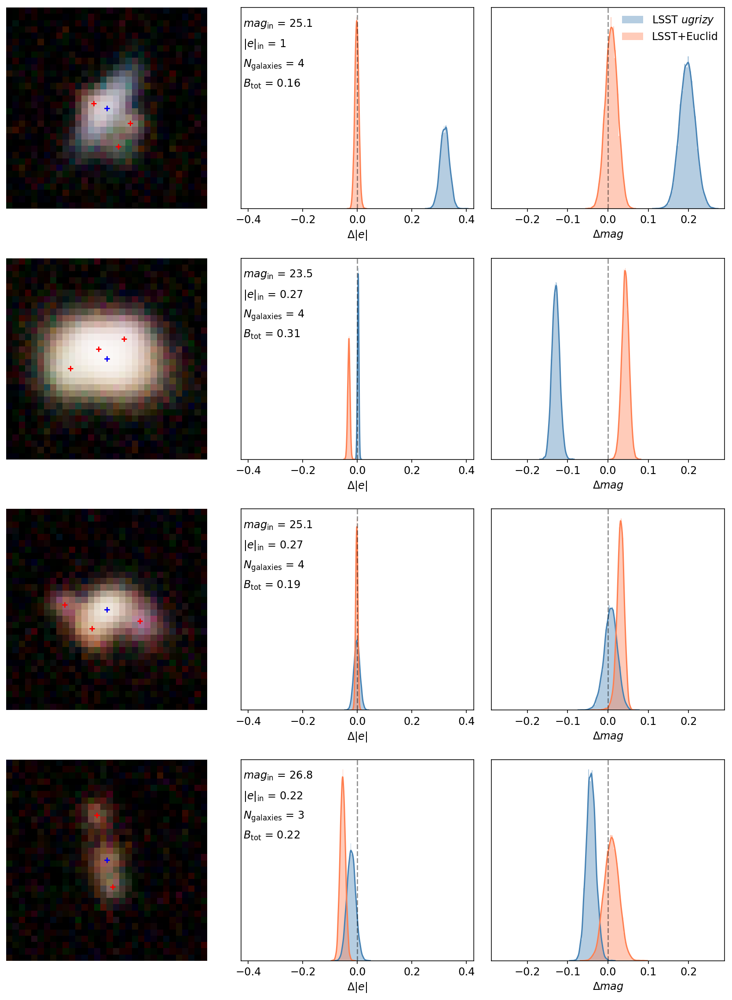

In [130]:
import matplotlib
font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 12}

matplotlib.rc('font', **font)

fig, axes = plt.subplots(N, 3, figsize=(12, 4*N))
#fig.subplots_adjust(right=1, left=0,hspace=0,wspace=0.)

palette = mpl.cm.RdYlBu([0.85, 0.15])
x_max_e = 0
x_max_mag = 0
y_max_e = 0
y_max_mag = 0

for i in range (N):
    print(idx[i])
    if N == 1:
        ax = axes[0]
    else:
        ax = axes[i,0]
    plot_rgb(images_noisy_norm[idx[i]], bands = [5,6,7],ax= ax, band_first= False,zoom = 2, shifts = shifts[idx[i]]/pixel_scale_lsst)
    ax.set_yticklabels([])
    ax.set_xticklabels([])
    
    if N == 1:
        ax = axes[1]
    else:
        ax = axes[i,1]
    sns.distplot(res_out_lsst_e[i]- res_in_e[i], bins = 50, label ='LSST filters' ,ax = ax, norm_hist = True, color = 'steelblue')
    sns.distplot(res_out_lsst_euclid_e[i]- res_in_e[i], bins = 50, label ='LSST+euclid filters' , ax = ax, norm_hist = True, color = 'coral')

    x_max_temp_e = np.max((np.abs(np.min(ax.get_xlim())),np.max(ax.get_xlim())))
    y_max_temp_e = np.max((np.abs(np.min(ax.get_ylim())),np.max(ax.get_ylim())))
    if x_max_temp_e > x_max_e:
        x_max_e = x_max_temp_e
    if y_max_temp_e > y_max_e:
        y_max_e = y_max_temp_e
    ax.text(0.01, 0.95, '$mag_{\\rm in}$'+' = ${:.3g}$'.format(round(df['mag'][idx[i]], 2)), fontsize =12, color='black', va='top', ha='left', transform=ax.transAxes)
    ax.text(0.01, 0.85, '$|e|_{\\rm in}$'+' = ${:.2g}$'.format(round(res_in_e[i], 2)), fontsize =12, color='black', va='top', ha='left', transform=ax.transAxes)
    ax.text(0.01, 0.75, '$N_{\\rm galaxies}$'+' = ${:.2g}$'.format(nb_of_gal[i]), fontsize =12, color='black', va='top', ha='left', transform=ax.transAxes)
    ax.text(0.01, 0.65, '$B_{\\rm tot}$'+' = ${:.2g}$'.format(round(blend_rate[i], 2)), fontsize =12, color='black', va='top', ha='left', transform=ax.transAxes)

    ax.set_xlabel('e')
    #ax.set_xlim(-x_max_e, x_max_e)
    ax.axvline(0, ls = '--',color = 'black', alpha = 0.4)
    ax.set_yticklabels([])
    ax.set_yticks([])
    ax.set_xlabel('$\Delta|e|$')

    if N == 1:
        ax = axes[2]
    else:
        ax = axes[i,2]
    sns.distplot(mag_out_lsst[i]-mag_in[i], bins = 50, label ='LSST $ugrizy$' ,ax = ax, norm_hist = True, color = 'steelblue')
    sns.distplot(mag_out_lsst_euclid[i]-mag_in[i], bins = 50, label ='LSST+Euclid' , ax = ax, norm_hist = True, color = 'coral')

    x_max_temp_mag = np.max((np.abs(np.min(ax.get_xlim())),np.max(ax.get_xlim())))
    y_max_temp_mag = np.max((np.abs(np.min(ax.get_ylim())),np.max(ax.get_ylim())))
    if x_max_temp_mag > x_max_mag:
        x_max_mag = x_max_temp_mag
    if y_max_temp_mag > y_max_mag:
        y_max_mag = y_max_temp_mag
    ax.set_xlabel('e')
    ax.legend()
    #ax.set_xlim(-x_max_mag, x_max_mag)
    ax.axvline(0, ls = '--', color = 'black', alpha = 0.4)
    ax.set_yticklabels([])
    ax.set_yticks([])
    ax.set_xlabel('$\Delta mag$')
    if i == 0:
        ax.legend(frameon=False, loc ='upper right', borderpad = 0.1)
    else:
        ax.get_legend().remove()

if N == 1:
    axes[1].set_xlim(-x_max_e, x_max_e)
    #axes[1].set_ylim(0, y_max_e)
    axes[2].set_xlim(-x_max_mag, x_max_mag)
    #axes[2].set_ylim(0, y_max_mag)
else:
    for k in range (N):
        axes[k,1].set_xlim(-x_max_e, x_max_e)
        #axes[k,1].set_ylim(0, y_max_e)
        axes[k,2].set_xlim(-x_max_mag, x_max_mag)
        #axes[k,2].set_ylim(0, y_max_mag)
    
    #fig.align_ylabels(axes)    
fig.tight_layout()
    #fig.subplots_adjust(wspace=0)
    

fig.savefig('figures_v2/proba_deblending.pdf', dpi = 300)